### Importación de datos



In [2]:
import pandas as pd

url = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_1%20.csv"
url2 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_2.csv"
url3 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_3.csv"
url4 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_4.csv"

tienda = pd.read_csv(url)
tienda2 = pd.read_csv(url2)
tienda3 = pd.read_csv(url3)
tienda4 = pd.read_csv(url4)

tienda.head()

,Producto,Categoría del Producto,Precio,Costo de envío,Fecha de Compra,Vendedor,Lugar de Compra,Calificación,Método de pago,Cantidad de cuotas,lat,lon
0,Asistente virtual,Electrónicos,164300.0,6900.0,16/01/2021,Pedro Gomez,Bogotá,4,Tarjeta de crédito,8,4.60971,-74.08175
1,Mesa de comedor,Muebles,192300.0,8400.0,18/05/2022,Beatriz Morales,Medellín,1,Tarjeta de crédito,4,6.25184,-75.56359
2,Juego de mesa,Juguetes,209600.0,15900.0,15/03/2021,Juan Fernandez,Cartagena,1,Tarjeta de crédito,1,10.39972,-75.51444
3,Microondas,Electrodomésticos,757500.0,41000.0,03/05/2022,Juan Fernandez,Cali,4,Nequi,1,3.43722,-76.52250
4,Silla de oficina,Muebles,335200.0,20200.0,07/11/2020,Maria Alfonso,Medellín,5,Nequi,1,6.25184,-75.56359


## Preparacion y analisis primario de datos del dataframe
### Exportacion de librerias



In [3]:
%pip install nbformat
!pip install nbformat
# importando las bibliotecas necesarias para visualizacion de datos y analisis
import matplotlib.pyplot as plt # para realizar graficos
import seaborn as sns # para graficos mas sofisticados
import numpy as np # para operaciones matematicas
import logging
from dataclasses import dataclass, asdict
from io import StringIO
from IPython.display import display, HTML
import matplotlib.patheffects as path_effects

# Configuramos un logger básico
logging.basicConfig(level=logging.INFO, format="%(message)s")
logger = logging.getLogger("AnalizadorTiendas")


Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.0.1 -> 25.1.1
[notice] To update, run: C:\Users\Gouther\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


Defaulting to user installation because normal site-packages is not writeable



[notice] A new release of pip is available: 25.0.1 -> 25.1.1
[notice] To update, run: C:\Users\Gouther\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


## Analisis de datos generales para cada tienda

In [4]:
@dataclass
class DataFrameSummary:
    name: str
    shape: tuple[int, int]
    memory_usage: pd.Series
    info: str
    describe: pd.DataFrame
    missing_count: pd.Series
    missing_pct: pd.Series
    dtypes: pd.Series
    unique_counts: pd.Series
    top_values: dict[str, pd.Series]
    correlations: pd.DataFrame

class DataFrameAnalyzer:
    """
    Analiza varios DataFrames y devuelve un resumen estructurado por tienda.
    """
    def __init__(self, stores: dict[str, pd.DataFrame], logger: logging.Logger = logger):
        self.stores = stores
        self.logger = logger

    def _capture_info(self, df: pd.DataFrame) -> str:
        buf = StringIO()
        df.info(buf=buf)
        return buf.getvalue()

    def _safe_describe(self, df: pd.DataFrame) -> pd.DataFrame:
        """
        Llama a df.describe() sin argumentos y, si falla,
        reintenta sólo con incluir valores numéricos.
        """
        try:
            return df.describe(include='all')
        except TypeError:
            return df.describe()

    def analyze(self) -> dict[str, DataFrameSummary]:
        results: dict[str, DataFrameSummary] = {}
        for name, df in self.stores.items():
            self.logger.info(f"\n========== Analizando '{name}' ==========")
            try:
                shape = df.shape
                mem = df.memory_usage(deep=True)
                info_str = self._capture_info(df)
                desc = self._safe_describe(df)
                missing = df.isnull().sum()
                missing_pct = (missing / len(df)) * 100
                dtypes = df.dtypes
                unique_cnt = df.nunique()
                top_vals = {col: df[col].value_counts().head(5) for col in df.columns}
                corr = df.select_dtypes(include='number').corr()

                summary = DataFrameSummary(
                    name=name,
                    shape=shape,
                    memory_usage=mem,
                    info=info_str,
                    describe=desc,
                    missing_count=missing,
                    missing_pct=missing_pct,
                    dtypes=dtypes,
                    unique_counts=unique_cnt,
                    top_values=top_vals,
                    correlations=corr
                )
                results[name] = summary

                # Log resumido
                self.logger.info(
                    f"→ {name}: {shape[0]} filas, {shape[1]} cols, "
                    f"{missing.sum()} nulos ({missing_pct.mean():.1f}% avg)"
                )
            except Exception as e:
                self.logger.error(f"[{name}] ERROR al analizar: {e!r}")
        return results

In [5]:
tiendas = {
    "Tienda 1": tienda,
    "Tienda 2": tienda2,
    "Tienda 3": tienda3,
    "Tienda 4": tienda4,
}

analyzer = DataFrameAnalyzer(tiendas)
report = analyzer.analyze()


========== Analizando 'Tienda 1' ==========
→ Tienda 1: 2359 filas, 12 cols, 0 nulos (0.0% avg)

========== Analizando 'Tienda 2' ==========
→ Tienda 2: 2359 filas, 12 cols, 0 nulos (0.0% avg)

========== Analizando 'Tienda 3' ==========
→ Tienda 3: 2359 filas, 12 cols, 0 nulos (0.0% avg)

========== Analizando 'Tienda 4' ==========
→ Tienda 4: 2358 filas, 12 cols, 0 nulos (0.0% avg)


Como se puede observar, contamos con 4 tiendas, dentro de las cuales, segun el analizis primario y resumido, nos dice que la tienda numero 4 tiene menos elementos que el resto de las otras tienda, todas tienen 12 culumnas, ninguna tiene valores nulos.
En este punto del analicis podemos detacar que no hay datos faltantes, dando una buena señal, puesto que da a entender que el dataset, ya esta limpio y bien estructurado.

,Métrica,Valor
0,Filas,2359
1,Columnas,12
2,Memoria (KB),1043.57
3,Columnas con nulos,0


,Columna,Tipo de Dato,Valores Únicos,Nulos (%)
0,Producto,object,51,0.00%
1,Categoría del Producto,object,8,0.00%
2,Precio,float64,1937,0.00%
3,Costo de envío,float64,753,0.00%
4,Fecha de Compra,object,1018,0.00%
5,Vendedor,object,14,0.00%
6,Lugar de Compra,object,19,0.00%
7,Calificación,int64,5,0.00%
8,Método de pago,object,4,0.00%
9,Cantidad de cuotas,int64,15,0.00%


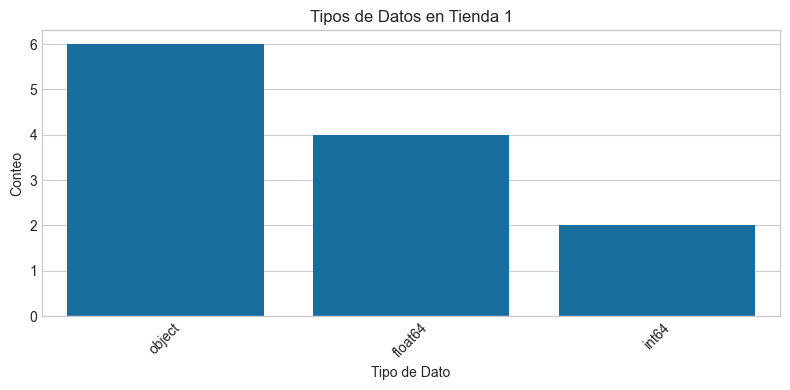

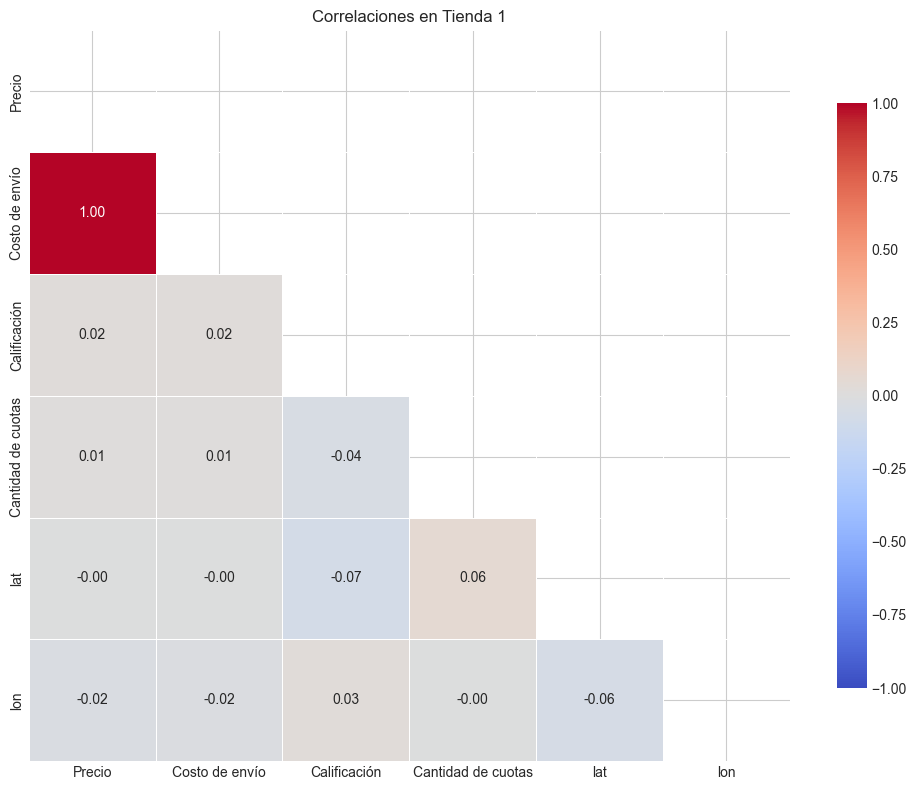

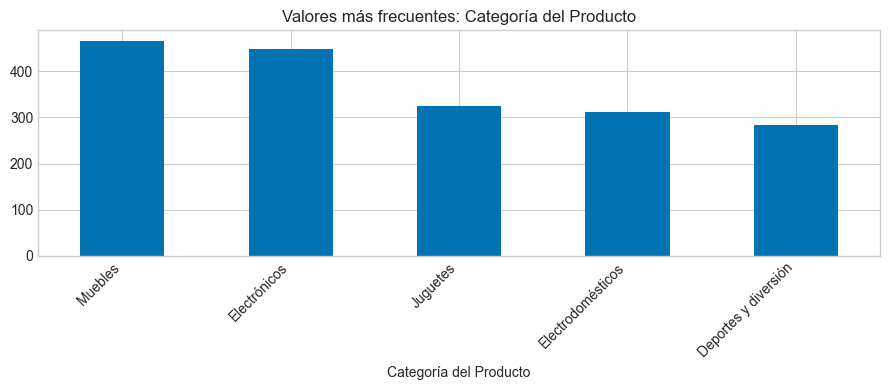

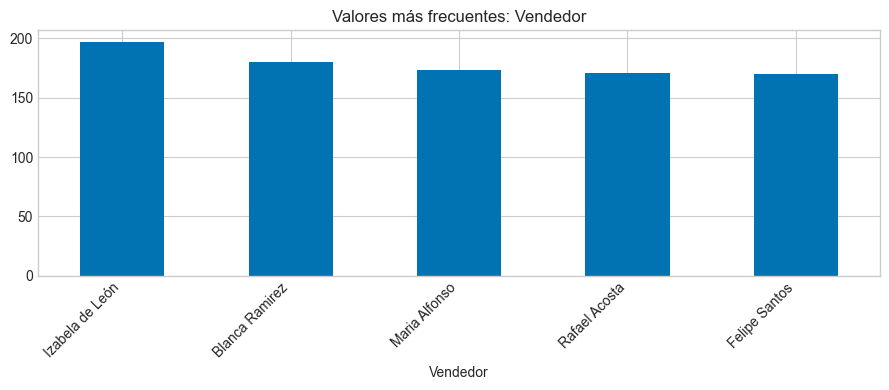

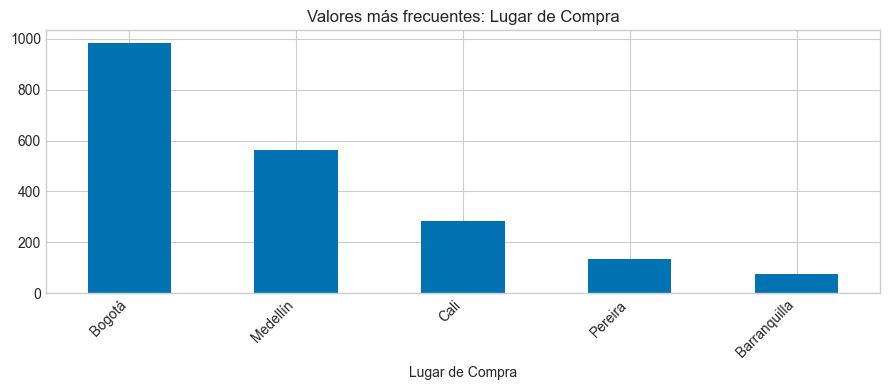

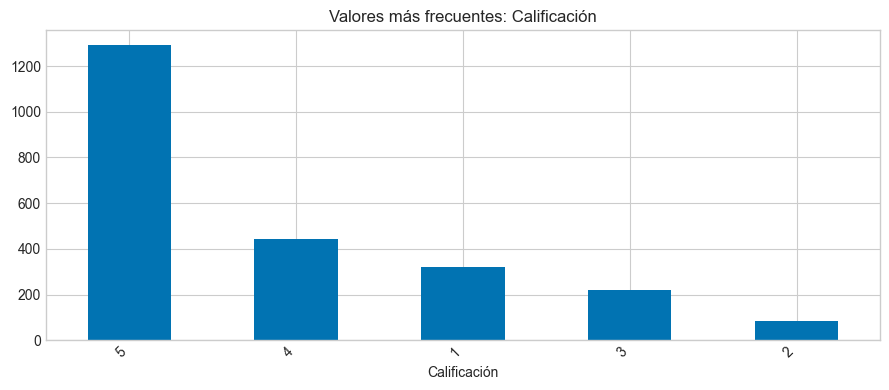

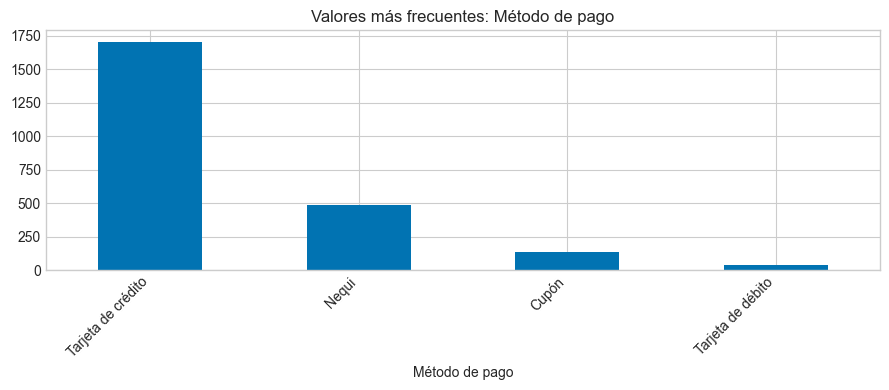

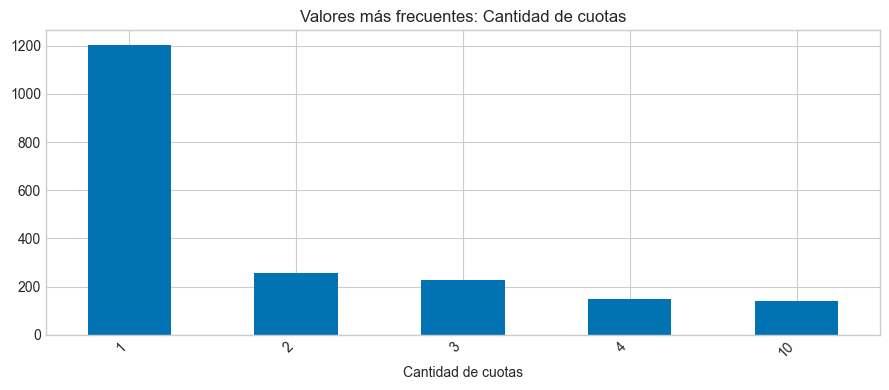

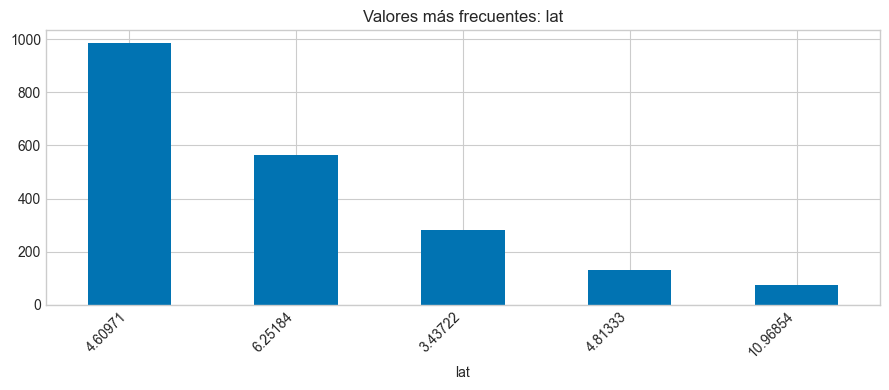

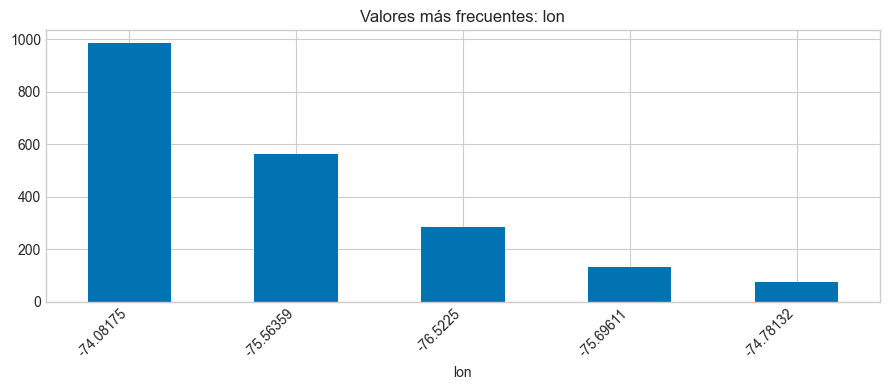

,Métrica,Valor
0,Filas,2359
1,Columnas,12
2,Memoria (KB),1045.98
3,Columnas con nulos,0


,Columna,Tipo de Dato,Valores Únicos,Nulos (%)
0,Producto,object,51,0.00%
1,Categoría del Producto,object,8,0.00%
2,Precio,float64,1908,0.00%
3,Costo de envío,float64,736,0.00%
4,Fecha de Compra,object,1025,0.00%
5,Vendedor,object,14,0.00%
6,Lugar de Compra,object,19,0.00%
7,Calificación,int64,5,0.00%
8,Método de pago,object,4,0.00%
9,Cantidad de cuotas,int64,17,0.00%


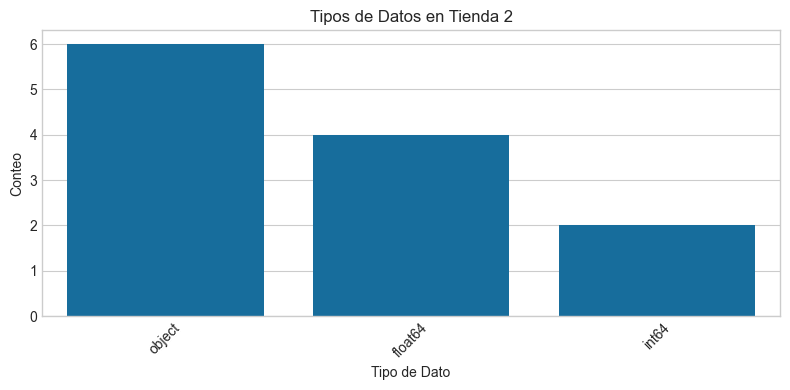

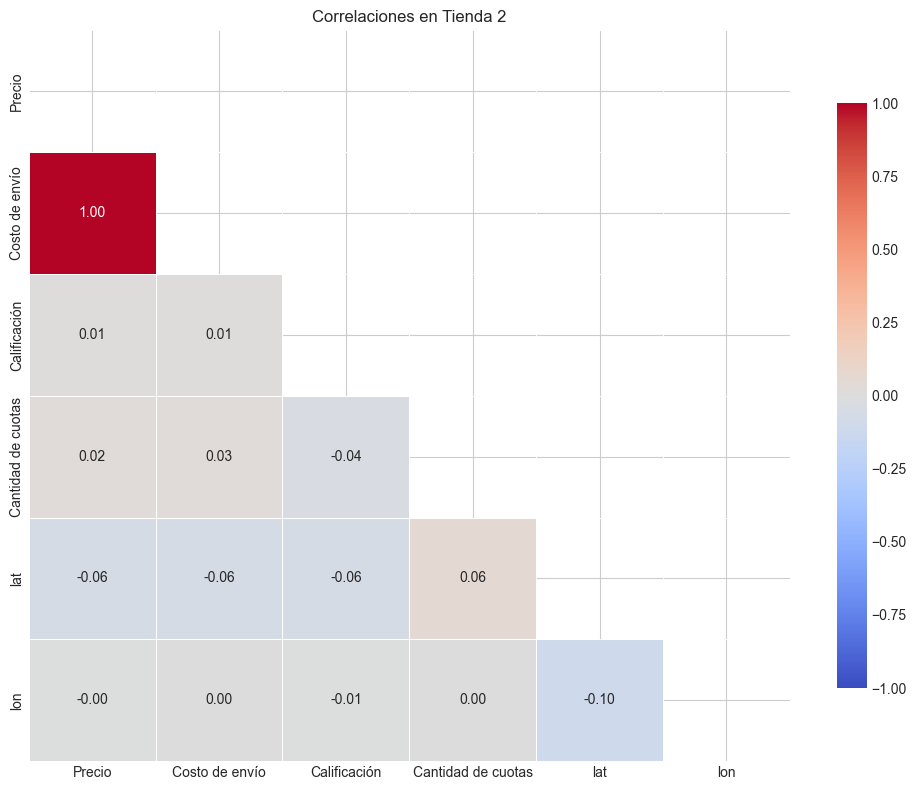

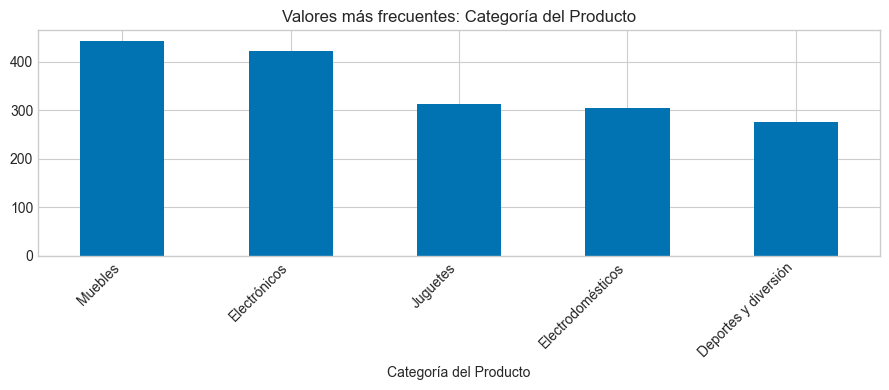

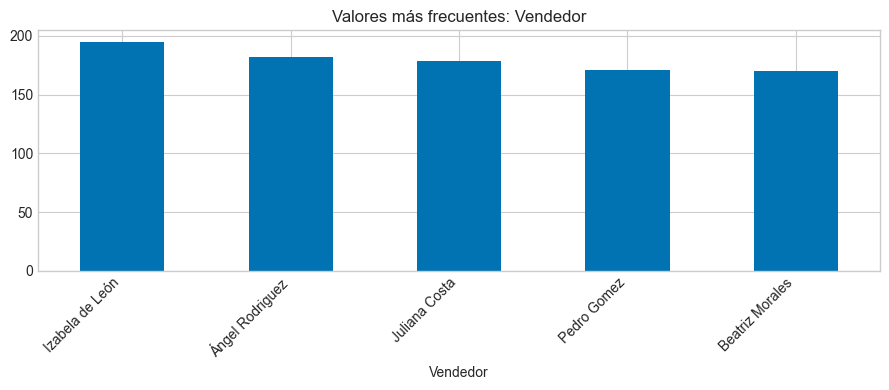

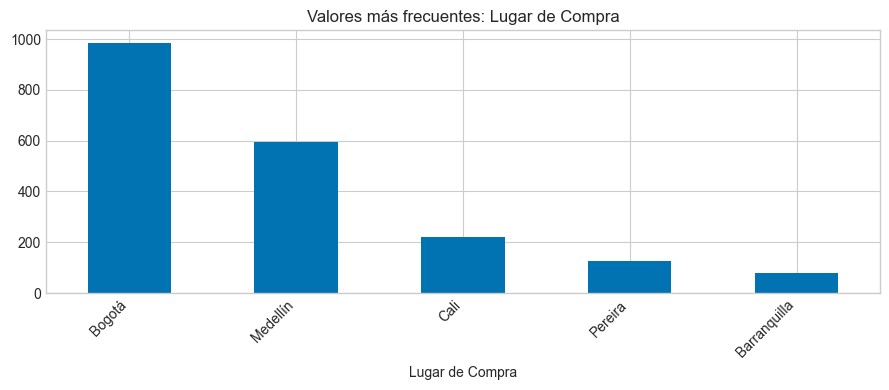

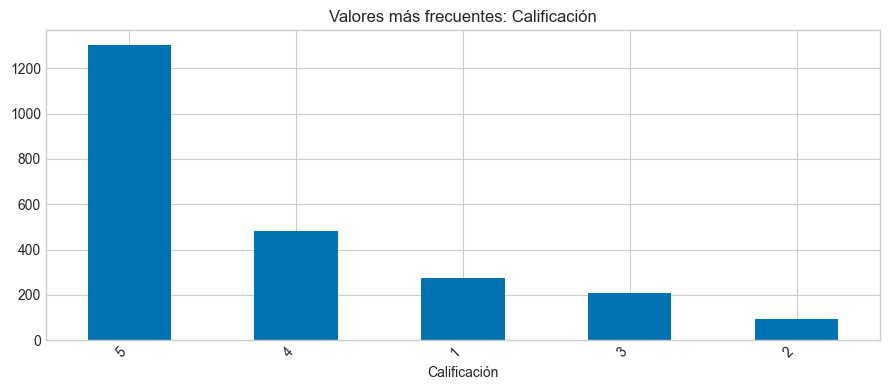

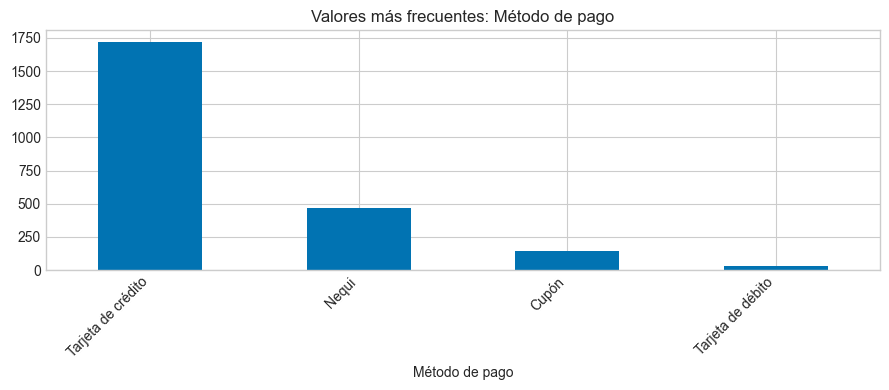

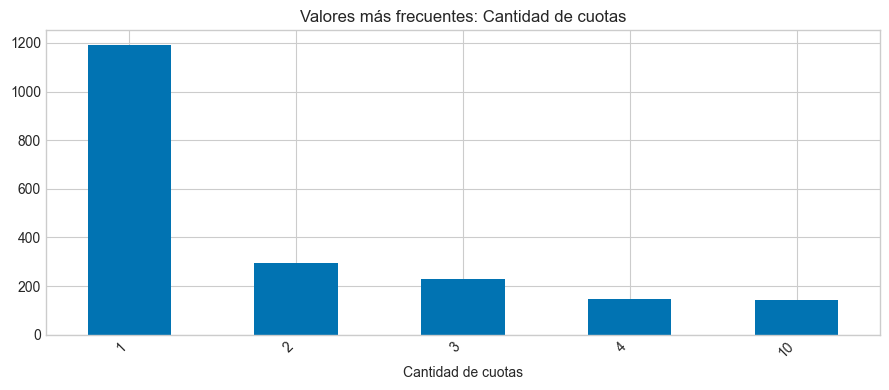

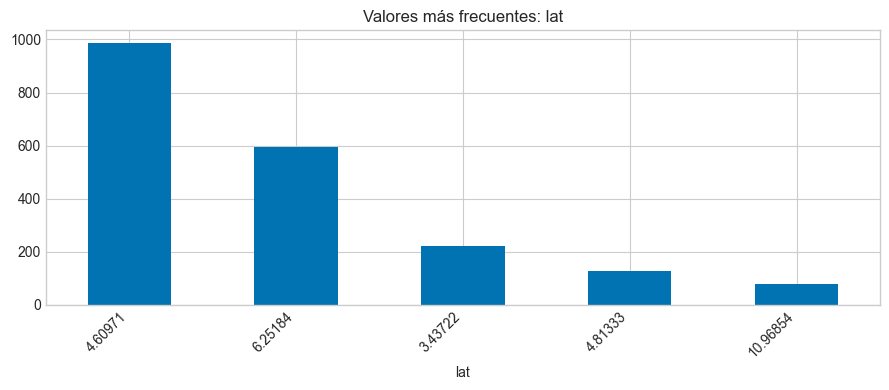

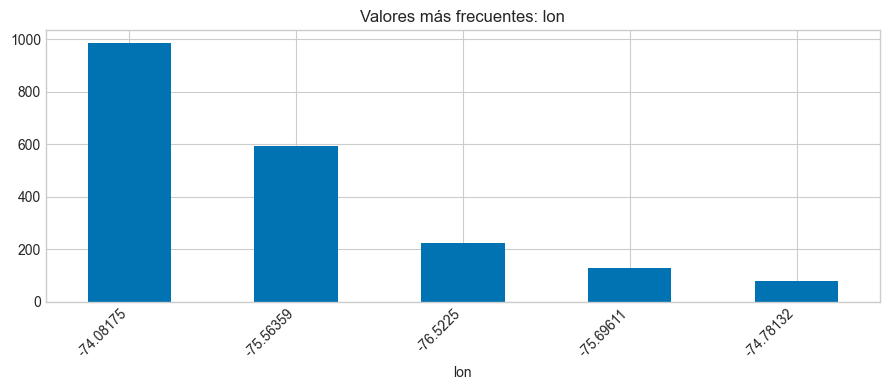

,Métrica,Valor
0,Filas,2359
1,Columnas,12
2,Memoria (KB),1042.90
3,Columnas con nulos,0


,Columna,Tipo de Dato,Valores Únicos,Nulos (%)
0,Producto,object,51,0.00%
1,Categoría del Producto,object,8,0.00%
2,Precio,float64,1946,0.00%
3,Costo de envío,float64,737,0.00%
4,Fecha de Compra,object,1024,0.00%
5,Vendedor,object,14,0.00%
6,Lugar de Compra,object,19,0.00%
7,Calificación,int64,5,0.00%
8,Método de pago,object,4,0.00%
9,Cantidad de cuotas,int64,17,0.00%


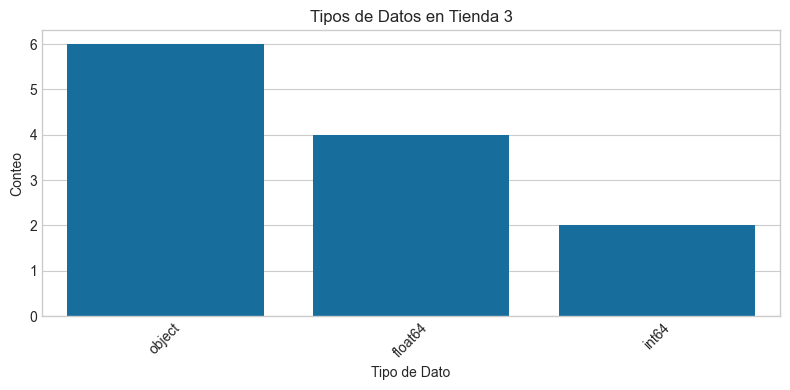

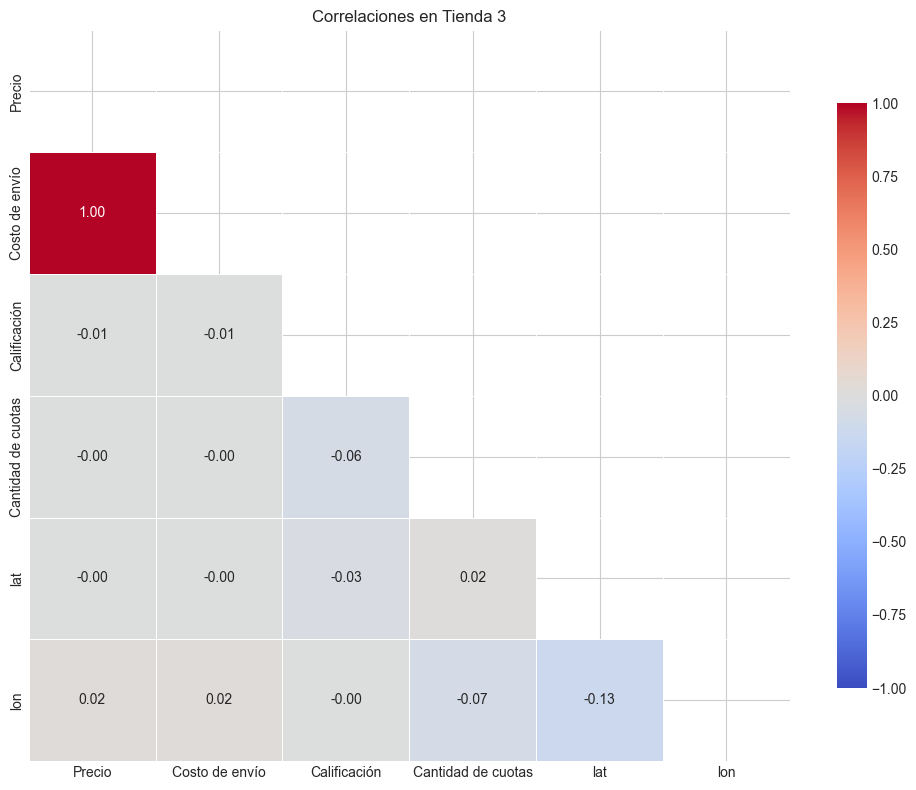

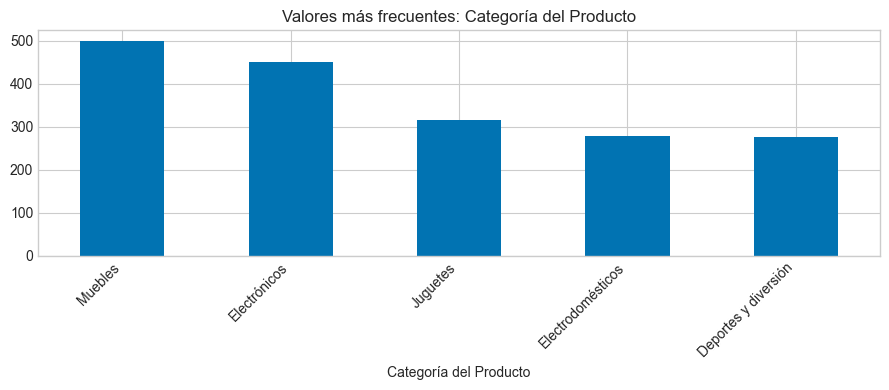

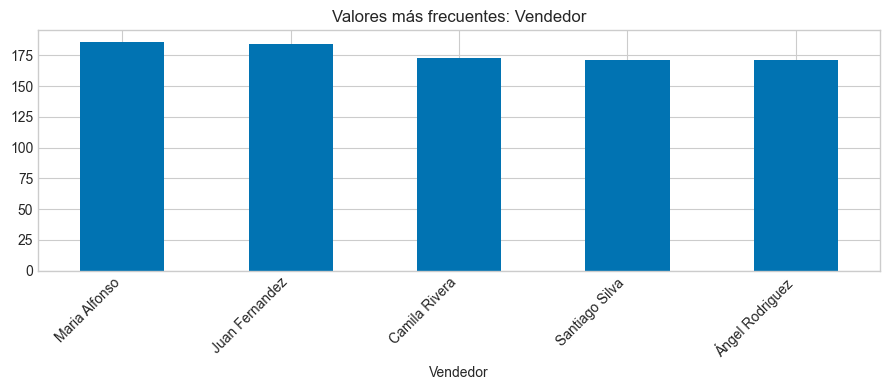

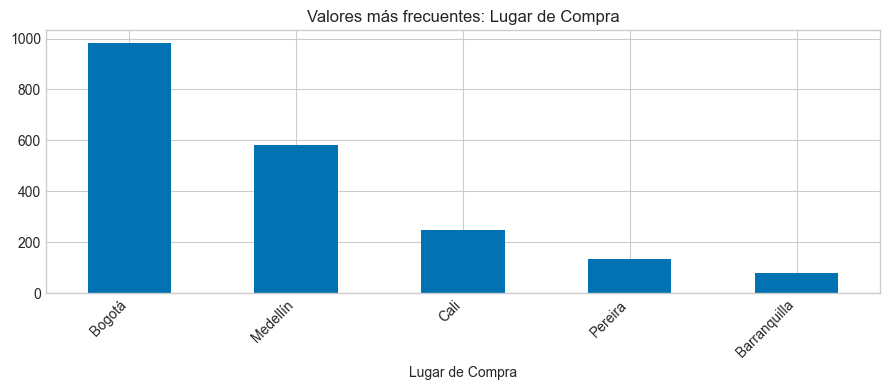

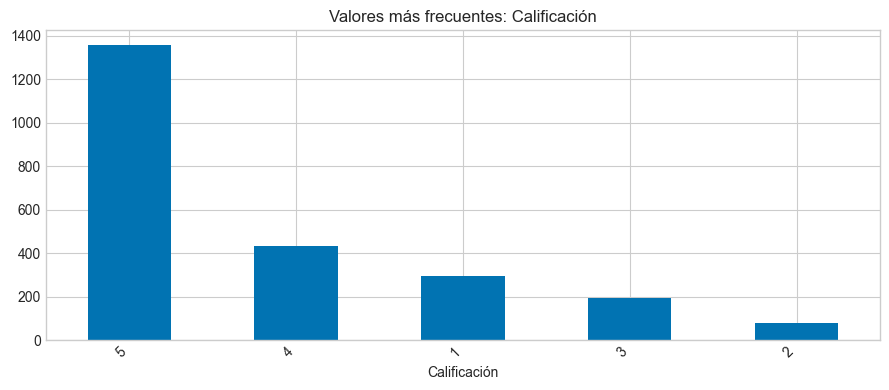

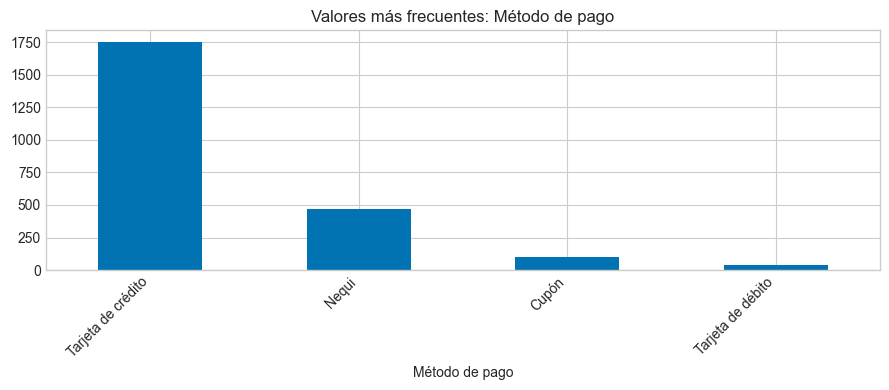

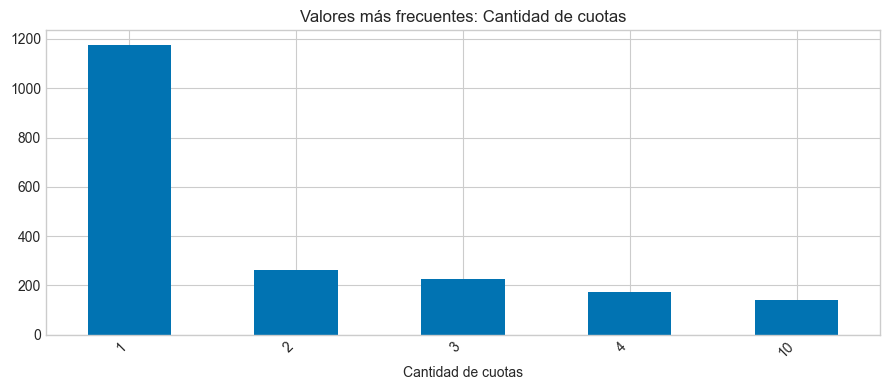

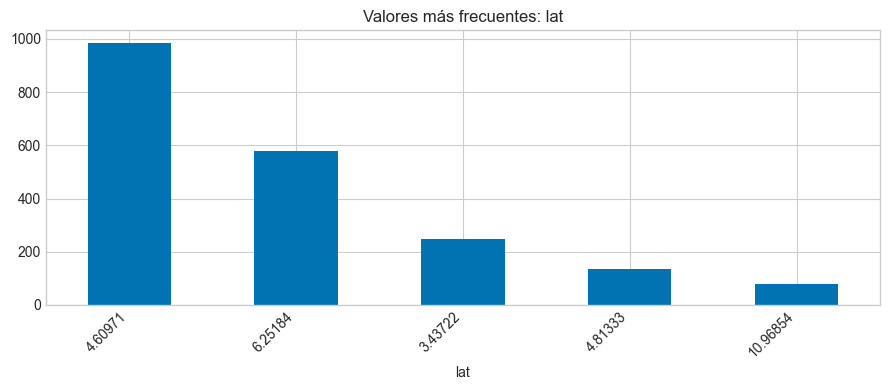

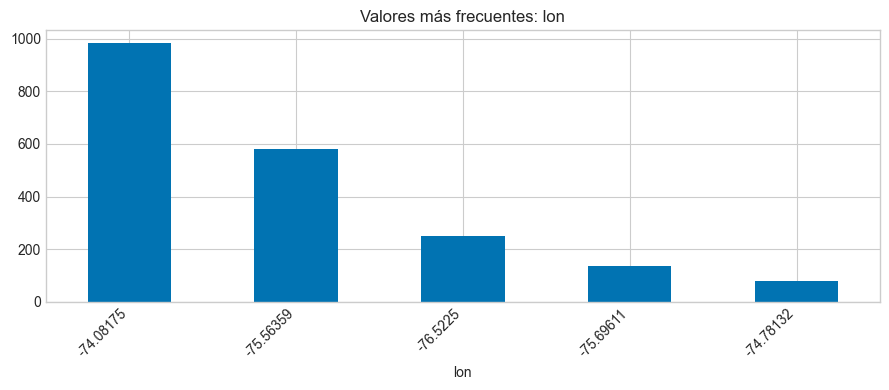

,Métrica,Valor
0,Filas,2358
1,Columnas,12
2,Memoria (KB),1042.60
3,Columnas con nulos,0


,Columna,Tipo de Dato,Valores Únicos,Nulos (%)
0,Producto,object,51,0.00%
1,Categoría del Producto,object,8,0.00%
2,Precio,float64,1867,0.00%
3,Costo de envío,float64,692,0.00%
4,Fecha de Compra,object,1030,0.00%
5,Vendedor,object,14,0.00%
6,Lugar de Compra,object,19,0.00%
7,Calificación,int64,5,0.00%
8,Método de pago,object,4,0.00%
9,Cantidad de cuotas,int64,13,0.00%


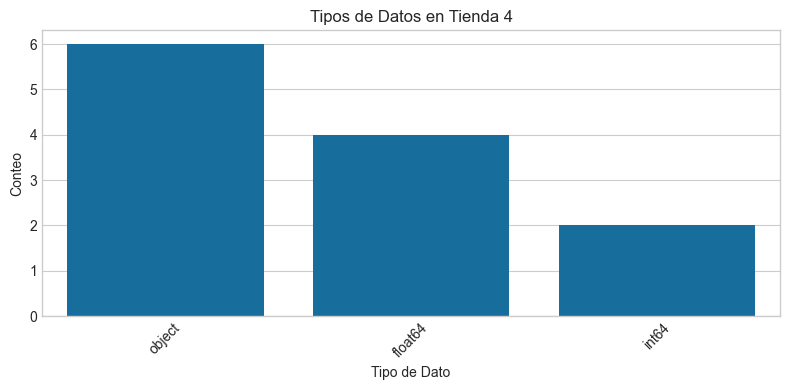

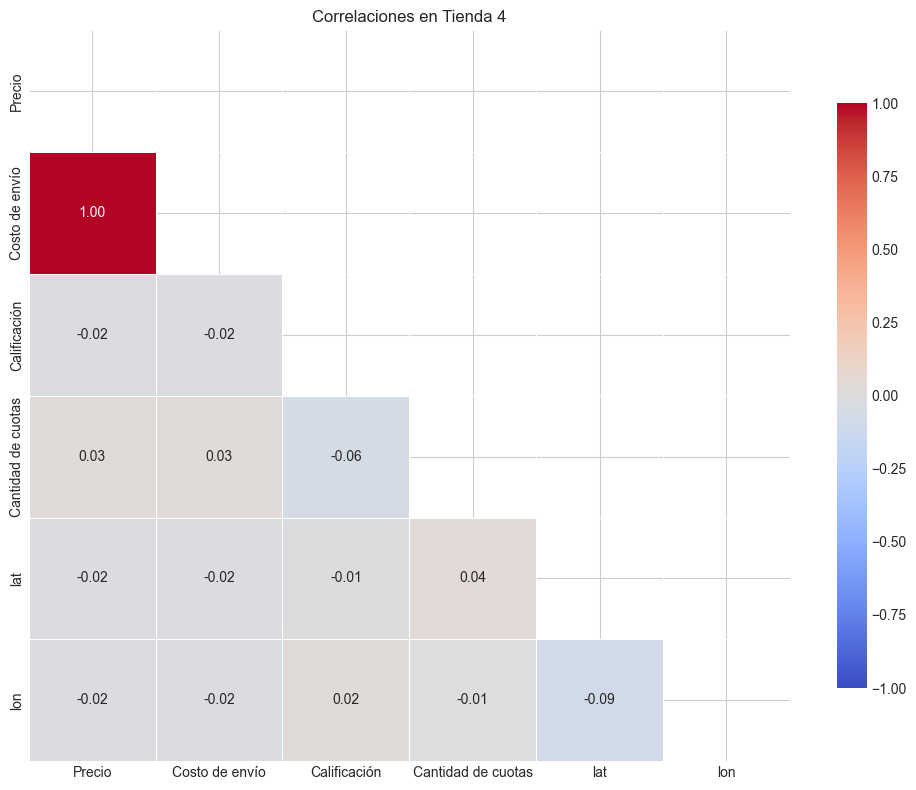

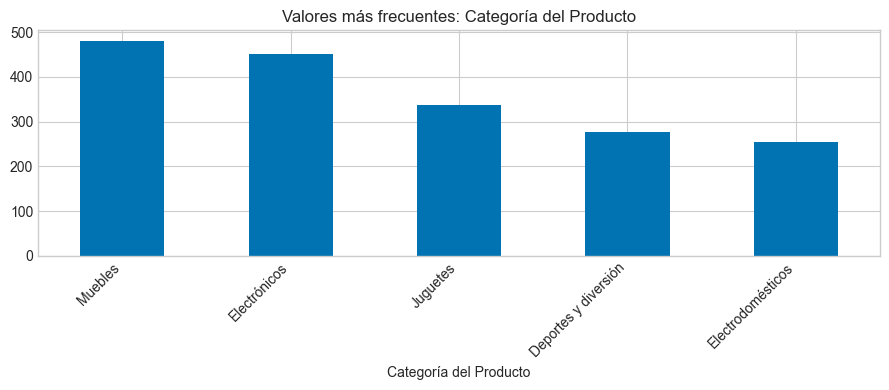

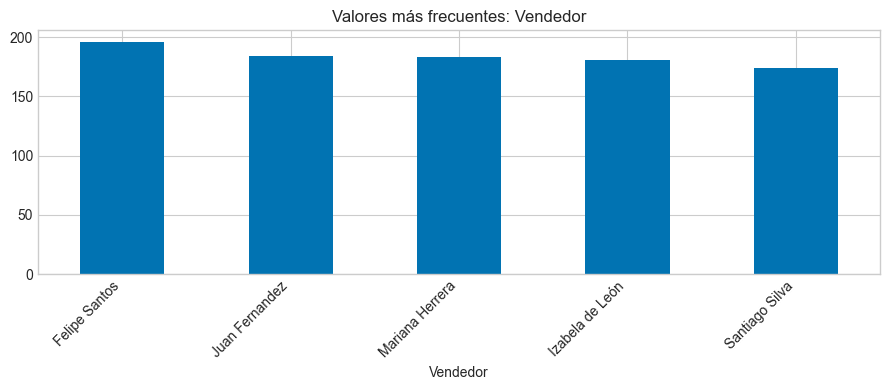

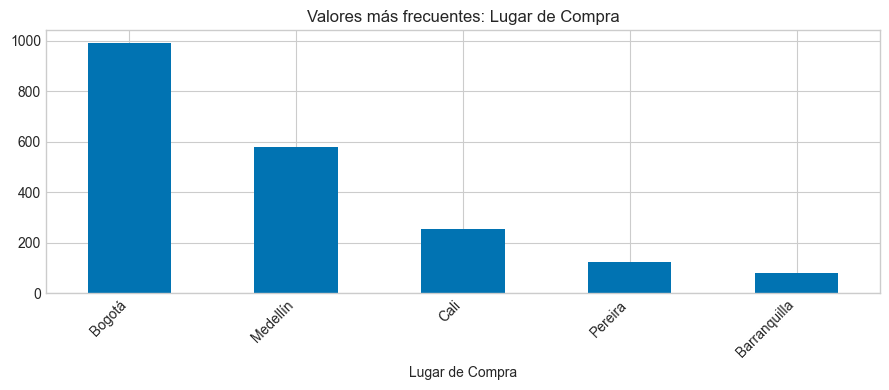

...

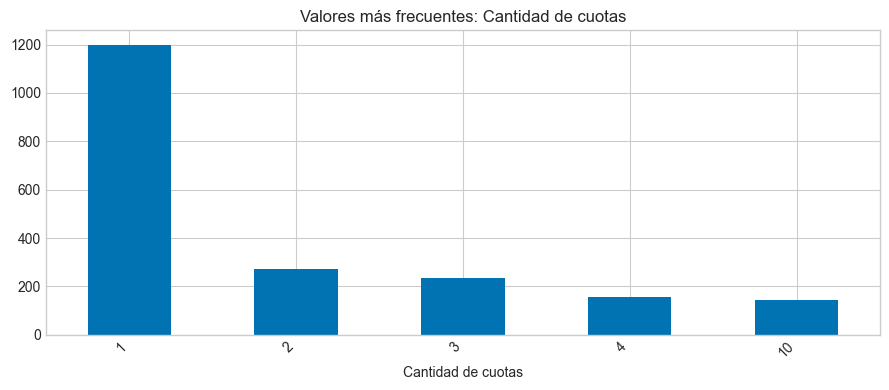

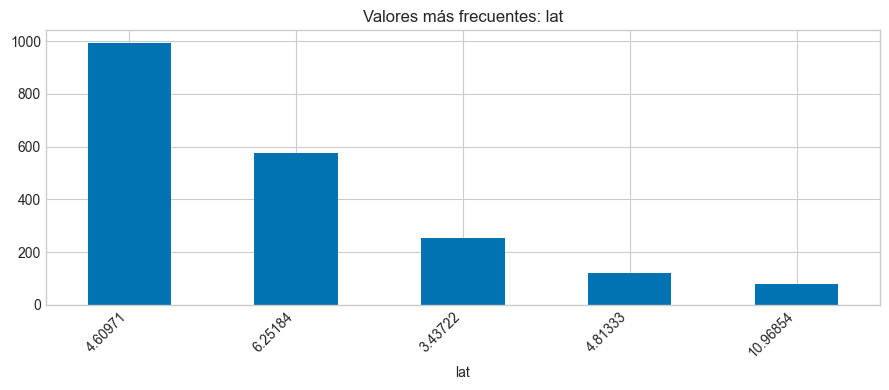

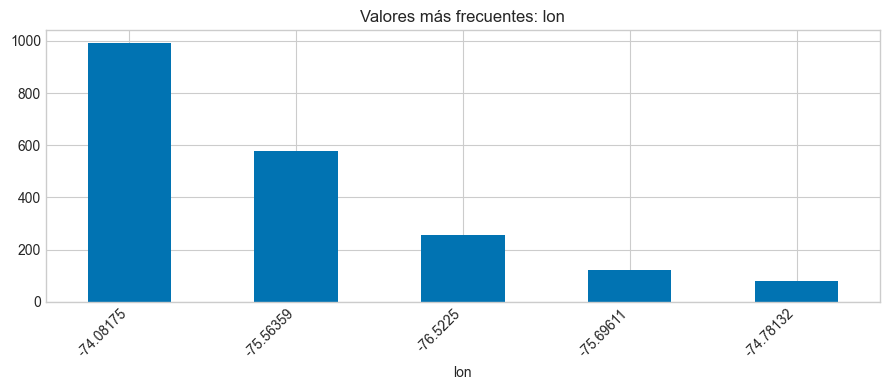

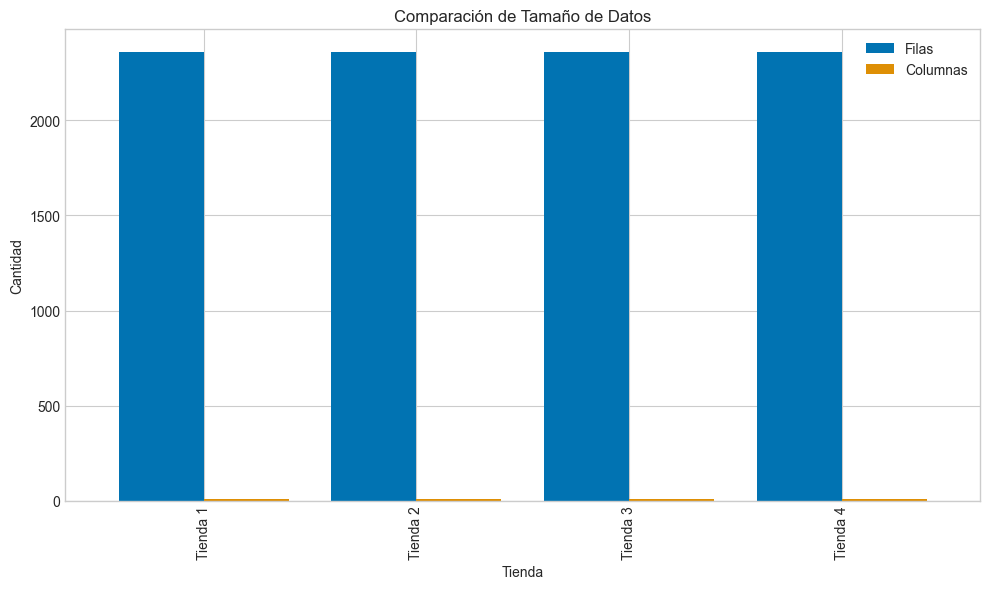

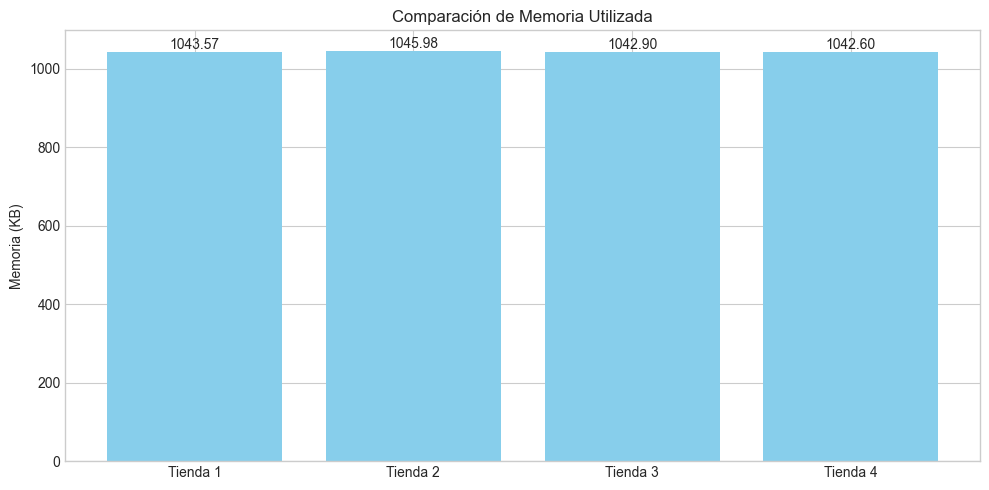

In [6]:
def visualizar_reporte_tiendas(report):
    # Configuración de estilo
    plt.style.use('seaborn-v0_8-whitegrid')
    sns.set_palette("colorblind")
    
    # Verificar si hay datos para visualizar
    if not report:
        print("Error: No hay datos para visualizar. Verifique que 'report' no esté vacío.")
        return
    
    # Crear un dataframe para comparar estadísticas básicas entre tiendas
    resumen_general = pd.DataFrame({
        'Tienda': [],
        'Filas': [],
        'Columnas': [],
        'Memoria (KB)': [],
        'Valores Nulos (%)': []
    })
    
    # Extraer información para cada tienda
    for name, summary in report.items():
        # Agregar al resumen general
        nulos_pct = summary.missing_pct.mean()
        resumen_general = pd.concat([resumen_general, pd.DataFrame({
            'Tienda': [name],
            'Filas': [summary.shape[0]],
            'Columnas': [summary.shape[1]],
            'Memoria (KB)': [summary.memory_usage.sum() / 1024],
            'Valores Nulos (%)': [nulos_pct]
        })], ignore_index=True)
        
        # Crear un título HTML para cada tienda
        display(HTML(f"<h2 style='color:#2C3E50; background:#ECF0F1; padding:10px; border-radius:5px;'>Resumen de {name}</h2>"))
        
        # 1. Tabla de información general
        info_general = pd.DataFrame({
            'Métrica': ['Filas', 'Columnas', 'Memoria (KB)', 'Columnas con nulos'],
            'Valor': [
                summary.shape[0], 
                summary.shape[1], 
                f"{summary.memory_usage.sum() / 1024:.2f}", 
                summary.missing_count[summary.missing_count > 0].count()
            ]
        })
        display(HTML("<h3>Información General</h3>"))
        display(info_general.style.set_table_attributes('class="table table-striped table-hover"').set_properties(**{'text-align': 'left'}))
        
        # 2. Tipos de datos y valores únicos
        tipos_y_unicos = pd.DataFrame({
            'Columna': summary.dtypes.index,
            'Tipo de Dato': summary.dtypes.values,
            'Valores Únicos': summary.unique_counts.values,
            'Nulos (%)': summary.missing_pct.values
        })
        display(HTML("<h3>Tipos de Datos y Valores Únicos</h3>"))
        display(tipos_y_unicos.style.set_table_attributes('class="table table-striped table-hover"')
               .background_gradient(subset=['Nulos (%)'], cmap='OrRd')
               .format({'Nulos (%)': '{:.2f}%'}))
        
        # 3. Visualización de tipos de datos
        display(HTML("<h3>Distribución de Tipos de Datos</h3>"))
        fig, ax = plt.subplots(figsize=(8, 4))
        tipos_conteo = summary.dtypes.value_counts().reset_index()
        tipos_conteo.columns = ['Tipo de Dato', 'Conteo']
        sns.barplot(x='Tipo de Dato', y='Conteo', data=tipos_conteo, ax=ax)
        ax.set_title(f'Tipos de Datos en {name}')
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()
        
        # 4. Mapa de calor de correlaciones
        if not summary.correlations.empty and summary.correlations.shape[0] > 1:
            display(HTML("<h3>Mapa de Correlaciones</h3>"))
            plt.figure(figsize=(10, 8))
            mask = np.triu(np.ones_like(summary.correlations))
            sns.heatmap(summary.correlations, annot=True, fmt=".2f", cmap="coolwarm", 
                       mask=mask, vmin=-1, vmax=1, linewidths=0.5, cbar_kws={"shrink": .8})
            plt.title(f'Correlaciones en {name}')
            plt.tight_layout()
            plt.show()
        
        # 5. Valores más frecuentes para columnas categóricas
        display(HTML("<h3>Valores Más Frecuentes</h3>"))
        for col, values in summary.top_values.items():
            # Mostrar gráficos solo para columnas categóricas con pocos valores únicos
            if summary.unique_counts[col] < 20 and summary.unique_counts[col] > 1:
                plt.figure(figsize=(9, 4))
                values.plot(kind='bar', title=f'Valores más frecuentes: {col}')
                plt.xticks(rotation=45, ha='right')
                plt.tight_layout()
                plt.show()
    
    # Si no hay suficientes tiendas para comparar, terminar aquí
    if len(resumen_general) <= 1:
        print("No hay suficientes tiendas para realizar una comparación.")
        return
    
    # Comparación entre tiendas
    display(HTML("<h2 style='color:#2C3E50; background:#ECF0F1; padding:10px; border-radius:5px;'>Comparación Entre Tiendas</h2>"))
    
    try:
        # Gráfico comparativo de tamaño de datos usando matplotlib
        fig, ax = plt.subplots(figsize=(10, 6))
        resumen_general.plot(x='Tienda', y=['Filas', 'Columnas'], kind='bar', ax=ax, width=0.8)
        ax.set_title('Comparación de Tamaño de Datos')
        ax.set_ylabel('Cantidad')
        plt.tight_layout()
        plt.show()
        
        # Gráfico de memoria utilizada
        fig, ax = plt.subplots(figsize=(10, 5))
        bars = ax.bar(resumen_general['Tienda'], resumen_general['Memoria (KB)'], color='skyblue')
        ax.set_title('Comparación de Memoria Utilizada')
        ax.set_ylabel('Memoria (KB)')
        
        # Añadir etiquetas de valores encima de las barras
        for bar in bars:
            height = bar.get_height()
            ax.text(bar.get_x() + bar.get_width()/2., height + 0.1,
                   f'{height:.2f}', ha='center', va='bottom')
        
        plt.tight_layout()
        plt.show()
    
        
    except Exception as e:
        print(f"Error al generar las visualizaciones comparativas: {e}")
        print("Se muestran visualizaciones individuales pero no las comparativas.")

# Ejecutar la visualización con el reporte existente
visualizar_reporte_tiendas(report)

El anterior análisis visual y descriptivo se realizó con la finalidad de conocer mejor el contexto en donde se desenvuelven los datos, analizando futuros patrones y compatibilidades, que en un futuro nos servirán para dar soporte a la investigación y conocer los datos estadísticamente hablando.

# 1. Análisis de facturación
## 1.1. Facturación por tienda (Calculo de valores)
En este apartado, realizamos un calculo de la facturacion de las cuentas. Gracias al analisis anterior nos dimos cuenta que para este calculo solo es necesario, sumar todos de los precios de todas las tiendas, y asi se obtiene las ventas de cada una de estas.

In [7]:
def calcular_facturacion_total(tiendas: dict[str, pd.DataFrame]) -> dict[str, float]:
    """
    Calcula la facturación total para cada tienda y devuelve un diccionario
    con los resultados.
    
    Args:
        tiendas (dict): Diccionario con nombre de tienda y su DataFrame correspondiente
        
    Returns:
        dict: Diccionario con nombres de tiendas y su facturación total
    """
    facturacion_totales = {}
    
    for nombre, df in tiendas.items():
        # Verificamos si la columna necesaria existe
        if 'Precio' in df.columns:
            # Calculamos la facturación total
            facturacion_total = df['Precio'].sum()
            facturacion_totales[nombre] = facturacion_total
        else:
            logger.warning(f"[{nombre}] No se encontró la columna 'Precio'.")
    
    return facturacion_totales

Hacemos uso de la funcion creada, y visualizamos los resultados, para ver si hay un error al momento de ejecutarlo.

In [8]:
facturacion = calcular_facturacion_total(tiendas)
facturacion

{'Tienda 1': np.float64(1150880400.0),
 'Tienda 2': np.float64(1116343500.0),
 'Tienda 3': np.float64(1098019600.0),
 'Tienda 4': np.float64(1038375700.0)}

## 1.2. Facturación por tienda (Visualizacion de resultados)
En este apartado, realizamos una funcion que muestre de una mejor forma, cuales son las tiendas que mas producen, implementado graficas y tablas, para un mejor detalle y mejor calidad visual.

In [9]:
def visualizar_facturacion(facturacion_totales: dict[str, float]) -> None:
    """
    Visualiza la facturación total de cada tienda en forma de gráfico de barras.
    
    Args:
        facturacion_totales (dict): Diccionario con nombres de tiendas y su facturación total
    """
    if not facturacion_totales:
        print("No hay datos de facturación para visualizar.")
        return
    
    # Convertimos a DataFrame para facilitar la visualización
    df_facturacion = pd.DataFrame({
        'Tienda': list(facturacion_totales.keys()),
        'Facturación Total': list(facturacion_totales.values())
    })
    
    # Ordenamos por facturación para mejor visualización
    df_facturacion = df_facturacion.sort_values(by='Facturación Total', ascending=False)
    
    # Creamos una figura con dos subplots: barras y pastel
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
    
    # Gráfico de barras
    bars = sns.barplot(x='Tienda', y='Facturación Total', data=df_facturacion, ax=ax1)
    ax1.set_title('Ene 2020 / Dic 2023', fontsize=14)
    ax1.set_xlabel('Tienda', fontsize=12)
    ax1.set_ylabel('Facturación Total ($)', fontsize=12)
    
    # Añadimos etiquetas en las barras
    for bar in bars.patches:
        ax1.annotate(f'${bar.get_height():,.2f}',
                   (bar.get_x() + bar.get_width() / 2, bar.get_height()),
                   ha='center', va='bottom',
                   fontsize=10)
    
    # Gráfico circular para mostrar proporción
    ax2.pie(df_facturacion['Facturación Total'], # Valores
            labels=df_facturacion['Tienda'],     # Etiquetas
            autopct='%1.1f%%',                   # Porcentaje
            startangle=90,                       # Ángulo de inicio
            colors=sns.color_palette('viridis', len(df_facturacion)))     # Colores
    ax2.set_title('Distribución Porcentual de Facturación', fontsize=14)  # Título
    
    # Añadimos una tabla con los valores exactos
    display(HTML("<h1>Detalle de Facturación por Tienda</h1>"))
    display(HTML("<h2>Facturacion total por tienda (Tabla de valores)</h2>"))
    df_facturacion['Facturación Total'] = df_facturacion['Facturación Total'].map('${:,.2f}'.format)
    display(df_facturacion.style
            .set_table_attributes('class="table table-striped table-hover"')
            .set_properties(**{'text-align': 'center'}))
    display(HTML("<h2>Facturacion total por tienda (Graficos)</h2>"))
    plt.tight_layout()
    plt.show()

,Tienda,Facturación Total
0,Tienda 1,"$1,150,880,400.00"
1,Tienda 2,"$1,116,343,500.00"
2,Tienda 3,"$1,098,019,600.00"
3,Tienda 4,"$1,038,375,700.00"


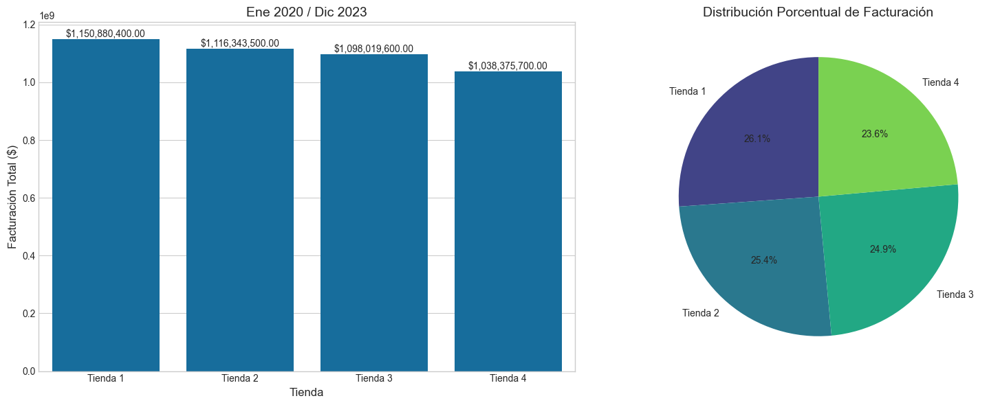

In [10]:
visualizar_facturacion(facturacion)

El análisis de facturación total por tienda nos ofrece una perspectiva clara sobre el desempeño financiero de cada establecimiento. La Tienda 1 se posiciona como líder indiscutible en generación de ingresos con $1,150,880,400.00, representando aproximadamente el 26.1% del total de la facturación según muestra el gráfico circular.

Se evidencia una tendencia decreciente en la facturación a medida que avanzamos de la Tienda 1 a la Tienda 4. La Tienda 2 ocupa el segundo lugar con $1,116,343,500.00 (25.4%), seguida por la Tienda 3 con $1,098,019,600.00 (24.8%) y finalmente la Tienda 4 con $1,038,375,700.00 (23.7%).

Es interesante notar que, a pesar de existir una diferencia de más de $112 millones entre la tienda con mayor y menor facturación, la distribución porcentual muestra un relativo equilibrio, con apenas 2.4 puntos porcentuales de diferencia entre la Tienda 1 y la Tienda 4. Esto sugiere una red de tiendas con un rendimiento bastante homogéneo.

El gráfico de barras complementa esta información visual, permitiendo apreciar la magnitud de las diferencias absolutas entre establecimientos, mientras que el diagrama circular nos ayuda a entender la contribución proporcional de cada tienda al total de ingresos durante el período Enero 2020 - Diciembre 2023.
Estos datos podrían servir como base para identificar las prácticas exitosas implementadas en la Tienda 1 y potencialmente replicarlas en los demás establecimientos, especialmente en la Tienda 4, para optimizar su rendimiento y equilibrar aún más la contribución de cada tienda a los ingresos totales de la empresa.

# 2. Ventas por categoría
## 2.1. Monto de ventas por categoria para cada tienda

In [11]:
def calcular_ventas_por_categoria(tiendas: dict[str, pd.DataFrame]) -> dict[str, pd.DataFrame]:
    """
    Calcula el monto de ventas por categoría para cada tienda.
    
    Args:
        tiendas (dict): Diccionario con nombre de tienda y su DataFrame correspondiente
        
    Returns:
        dict: Diccionario con nombres de tiendas y DataFrames de ventas por categoría
    """
    resultados = {}
    
    for nombre, df in tiendas.items():
        # Verificar que existan las columnas necesarias
        if 'Categoría del Producto' in df.columns and 'Precio' in df.columns:
            # Agrupar por categoría y sumar los precios
            ventas_categoria = df.groupby('Categoría del Producto')['Precio'].sum().reset_index()
            ventas_categoria = ventas_categoria.sort_values(by='Precio', ascending=False)
            resultados[nombre] = ventas_categoria
        else:
            logger.warning(f"[{nombre}] No se encontraron las columnas 'Categoria' o 'Precio'")
    
    return resultados




In [12]:
def visualizar_ventas_por_categoria(resultados: dict[str, pd.DataFrame], 
                                    mostrar_individual: bool = True, 
                                    mostrar_comparativo: bool = True) -> None:
    """
    Visualiza las ventas por categoría para cada tienda.
    
    Args:
        resultados (dict): Diccionario con nombres de tiendas y DataFrames de ventas por categoría
        mostrar_individual (bool): Si se deben mostrar gráficos para cada tienda individual
        mostrar_comparativo (bool): Si se debe mostrar un gráfico comparativo entre tiendas
    """
    if not resultados:
        logger.warning("No hay datos de ventas por categoría para visualizar.")
        return
    
    # Colores para gráficos
    colores = sns.color_palette('viridis', len(resultados))
    
    # Crear un DataFrame combinado para comparaciones
    df_combinado = pd.DataFrame()
    
    # Visualizaciones individuales para cada tienda
    if mostrar_individual:
        for i, (nombre, df) in enumerate(resultados.items()):
            # Mostrar tabla HTML con valores formateados
            display(HTML(f"<h2 style='color:#2C3E50; background:#ECF0F1; padding:10px; border-radius:5px;'>Ventas por Categoría: {nombre}</h2>"))
            
            # Crear copia para no modificar el original
            df_display = df.copy()
            
            # Aplicar gradiente primero (a valores numéricos)
            styled_df = df_display.style.set_table_attributes('class="table table-striped table-hover"')\
                                       .set_properties(**{'text-align': 'center'})
                                       
            
            # Formatear valores monetarios después del gradiente
            styled_df = styled_df.format({'Precio': '${:,.2f}'})
            
            # Mostrar tabla HTML estilizada
            display(styled_df)
            
            # Gráfico de barras horizontal
            plt.figure(figsize=(12, max(6, len(df) * 0.4)))  # Ajustar altura según categorías
            # Corregido: usar hue para asignar colores
            ax = sns.barplot(x='Precio', y='Categoría del Producto', data=df, 
                           color=colores[i], orient='h')
            
            # Añadir valores a las barras
            for p in ax.patches:
                width = p.get_width()
                ax.text(width + width * 0.02, p.get_y() + p.get_height() / 2, 
                       f'${width:,.2f}', ha='left', va='center')
            
            plt.title(f'Ventas por Categoría: {nombre}', fontsize=14)
            plt.xlabel('Ventas ($)', fontsize=12)
            plt.ylabel('Categoría', fontsize=12)
            plt.tight_layout()
            plt.show()
            
            # Gráfico circular para mostrar distribución
            plt.figure(figsize=(12, 8))

            # Ordenar los datos para mayor claridad visual
            df_sorted = df.sort_values(by='Precio', ascending=False)

            # Calcular porcentajes para incluirlos en la leyenda
            total = df_sorted['Precio'].sum()
            df_sorted['Porcentaje'] = (df_sorted['Precio'] / total * 100).round(1)

            # Crear etiquetas con porcentajes para la leyenda
            legend_labels = [f"{cat} ({pct:.1f}%)" for cat, pct in zip(df_sorted['Categoría del Producto'], df_sorted['Porcentaje'])]

            # Seleccionar una paleta de colores más diferenciada
            colors = sns.color_palette('viridis', len(df_sorted))

            # Crear el gráfico de pastel SIN porcentajes en el gráfico
            wedges, texts = plt.pie( 
                df_sorted['Precio'], 
                labels=None,          # Sin etiquetas directas
                autopct=None,         # Sin porcentajes automáticos
                startangle=90,        
                colors=colors,
                wedgeprops={'edgecolor': 'white', 'linewidth': 1.5}
            )

            plt.axis('equal')  # Asegurar que el círculo sea un círculo

            # Título 
            plt.suptitle(f'Distribución de Ventas por Categoría: {nombre}', 
                    fontsize=28, fontweight='bold', y=0.98)

            # Crear una leyenda externa con los porcentajes incluidos
            plt.legend(
                wedges,                # Pasamos los wedges para asociar cada sector con su etiqueta
                legend_labels,         # Etiquetas con categoría y porcentaje
                title="Categorías",
                loc="center left",
                bbox_to_anchor=(1, 0, 0.5, 1),
                fontsize=20,
                title_fontsize=22
            )

            # Añadir una nota al pie
            plt.figtext(0.5, 0.01, 
                    "Nota: Los porcentajes representan la participación en las ventas totales", 
                    ha="center", fontsize=10, style='italic')

            plt.tight_layout()
            plt.show()
            
            # Agregar datos al DataFrame combinado para comparación
            temp_df = df.copy()
            temp_df['Tienda'] = nombre
            df_combinado = pd.concat([df_combinado, temp_df])
    
    # Visualización comparativa entre tiendas
    if mostrar_comparativo and len(resultados) > 1:
        display(HTML("<h2 style='color:#2C3E50; background:#ECF0F1; padding:10px; border-radius:5px;'>Comparación de Ventas por Categoría Entre Tiendas</h2>"))
        
        # Obtener todas las categorías únicas
        categorias_unicas = df_combinado['Categoría del Producto'].unique()
        
        # 1. Gráfico de barras apiladas (stacked) por categoría
        pivot_df = df_combinado.pivot_table(
            index='Categoría del Producto', columns='Tienda', values='Precio', fill_value=0
        ).reset_index()
        
        # Ordenar por suma total de ventas por categoría
        pivot_df['Total'] = pivot_df.sum(axis=1, numeric_only=True)
        pivot_df = pivot_df.sort_values('Total', ascending=False).drop('Total', axis=1)
        
        plt.figure(figsize=(14, max(8, len(categorias_unicas) * 0.4)))
        pivot_df.set_index('Categoría del Producto').plot(kind='barh', stacked=True, figsize=(14, 10), 
                                           colormap='viridis')
        plt.title('Ventas por Categoría y Tienda', fontsize=16)
        plt.xlabel('Ventas ($)', fontsize=14)
        plt.ylabel('Categoría', fontsize=14)
        plt.legend(title='Tienda', bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.tight_layout()
        plt.show()
        
        # 2. Heatmap para comparar categorías entre tiendas
        plt.figure(figsize=(14, max(8, len(categorias_unicas) * 0.4)))
        pivot_wide = df_combinado.pivot_table(
            index='Categoría del Producto', columns='Tienda', values='Precio', fill_value=0
        )
        
        sns.heatmap(pivot_wide, annot=True, fmt=',.0f', cmap='YlGnBu', linewidths=.5)
        plt.title('Heatmap de Ventas por Categoría y Tienda ($)', fontsize=16) 
        plt.tight_layout()
        plt.show()
        
        # 3. Tabla resumen con totales
        tabla_resumen = pivot_wide.copy()
        tabla_resumen['Total por Categoría'] = tabla_resumen.sum(axis=1)
        tabla_resumen.loc['Total por Tienda'] = tabla_resumen.sum(axis=0)
        
        # Primero aplicar el estilo sin formatear aún los valores como moneda
        styled_tabla = tabla_resumen.style\
            .set_table_attributes('class="table table-striped table-hover"')\
            .set_properties(**{'text-align': 'right'})\
            .set_properties(subset=['Total por Categoría'], **{'font-weight': 'bold'})\
            .set_properties(subset=pd.IndexSlice['Total por Tienda', :], **{'font-weight': 'bold'})
        
        # Ahora formatear los valores como moneda
        styled_tabla = styled_tabla.format('${:,.2f}')
        
        display(HTML("<h3>Tabla Resumen de Ventas por Categoría</h3>"))
        display(styled_tabla)

In [13]:
# Función principal para ejecutar el análisis completo
def analisis_ventas_por_categoria(tiendas: dict[str, pd.DataFrame]) -> None:
    """
    Ejecuta el análisis completo de ventas por categoría para todas las tiendas.
    
    Args:
        tiendas (dict): Diccionario con nombre de tienda y su DataFrame correspondiente
    """
    logger.info("Iniciando análisis de ventas por categoría...")
    
    # Calcular ventas por categoría
    resultados = calcular_ventas_por_categoria(tiendas)
    
    # Verificar si se obtuvieron resultados
    if not resultados:
        logger.error("No se encontraron datos válidos para el análisis.")
        return
    
    # Visualizar resultados
    visualizar_ventas_por_categoria(resultados)
    
    # Mostrar el top de categorías más vendidas en todas las tiendas
    display(HTML("<h2 style='color:#2C3E50; background:#ECF0F1; padding:10px; border-radius:5px;'>Top Categorías por Ventas (Todas las Tiendas)</h2>"))
    
    # Combinar datos de todas las tiendas
    df_todas = pd.DataFrame()
    for nombre, df in resultados.items():
        temp = df.copy()
        temp['Tienda'] = nombre
        df_todas = pd.concat([df_todas, temp])
    
    # Agrupar por categoría
    top_categorias = df_todas.groupby('Categoría del Producto')['Precio'].sum().reset_index().sort_values('Precio', ascending=False)
    
    # Visualizar las top categorías
    plt.figure(figsize=(12, 8))
    bars = sns.barplot(x='Precio', y='Categoría del Producto', data=top_categorias.head(10), orient='h')
    
    # Añadir valores a las barras
    for p in bars.patches:
        width = p.get_width()
        plt.text(width + width * 0.01, p.get_y() + p.get_height() / 2, 
               f'${width:,.2f}', ha='left', va='center', fontsize=10)
    
    plt.title('Top Categorías por Ventas (Todas las Tiendas)', fontsize=16)
    plt.xlabel('Ventas Totales ($)', fontsize=14)
    plt.ylabel('Categoría', fontsize=14)
    plt.tight_layout()
    plt.show()
    
    logger.info("Análisis de ventas por categoría completado.")

Iniciando análisis de ventas por categoría...


,Categoría del Producto,Precio
3,Electrónicos,"$429,493,500.00"
2,Electrodomésticos,"$363,685,200.00"
7,Muebles,"$187,633,700.00"
4,Instrumentos musicales,"$91,299,000.00"
1,Deportes y diversión,"$39,290,000.00"
5,Juguetes,"$17,995,700.00"
0,Artículos para el hogar,"$12,698,400.00"
6,Libros,"$8,784,900.00"


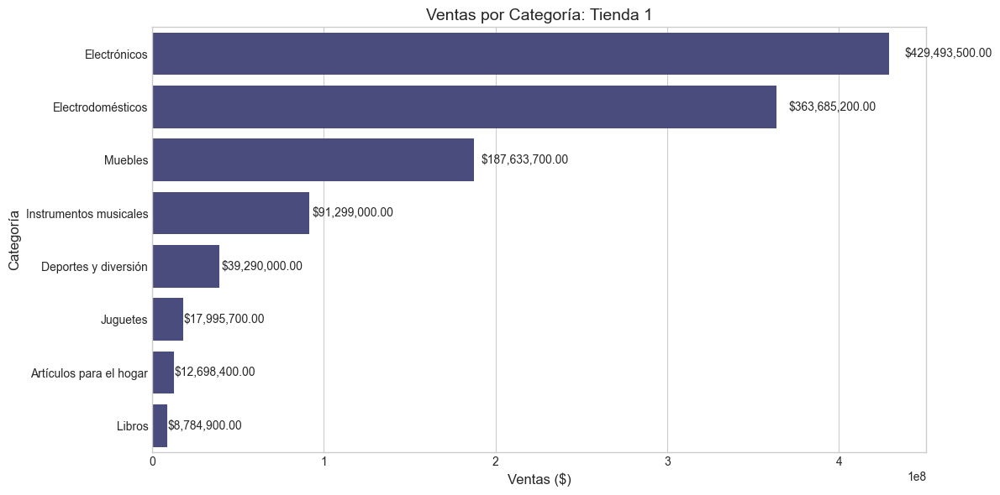

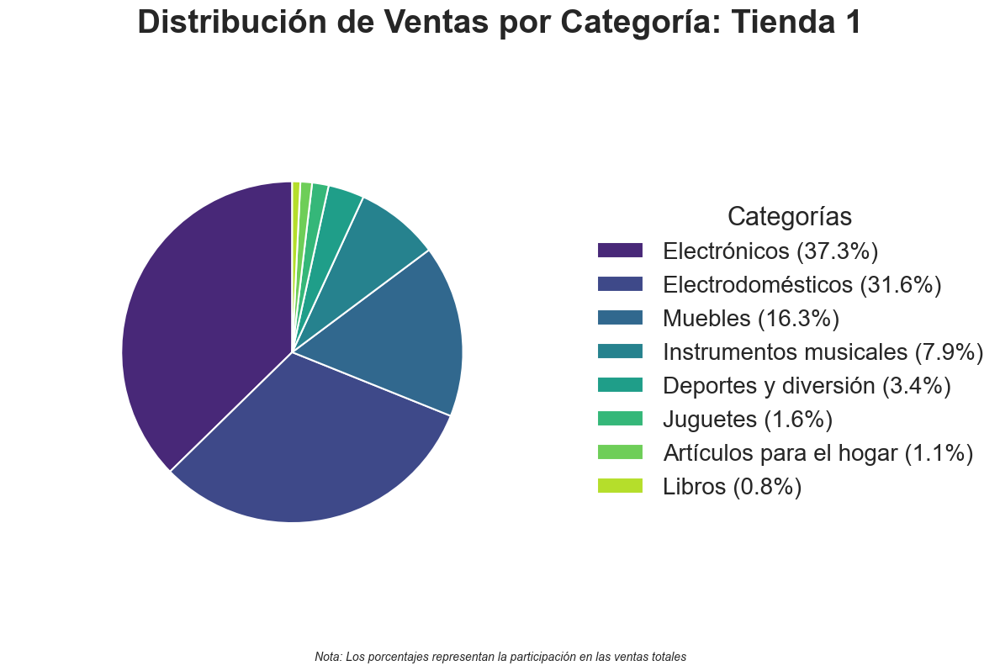

,Categoría del Producto,Precio
3,Electrónicos,"$410,831,100.00"
2,Electrodomésticos,"$348,567,800.00"
7,Muebles,"$176,426,300.00"
4,Instrumentos musicales,"$104,990,300.00"
1,Deportes y diversión,"$34,744,500.00"
5,Juguetes,"$15,945,400.00"
0,Artículos para el hogar,"$14,746,900.00"
6,Libros,"$10,091,200.00"


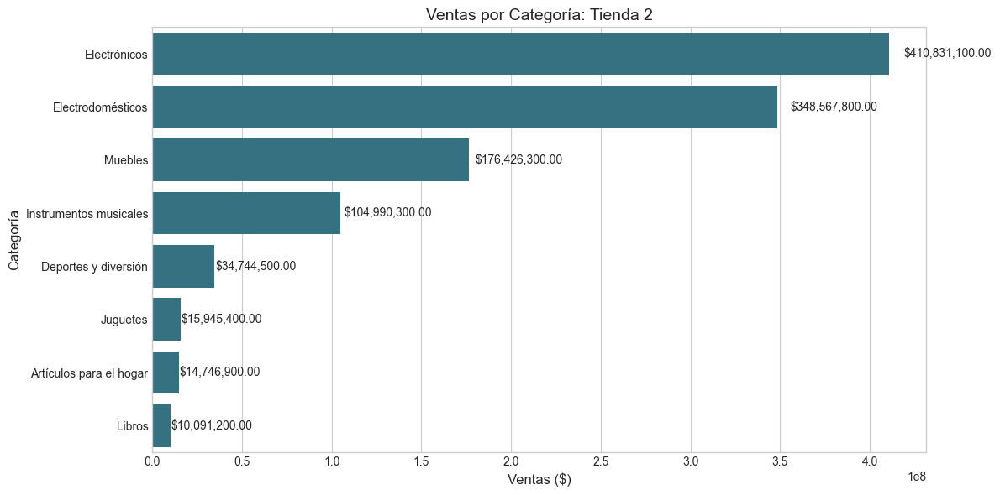

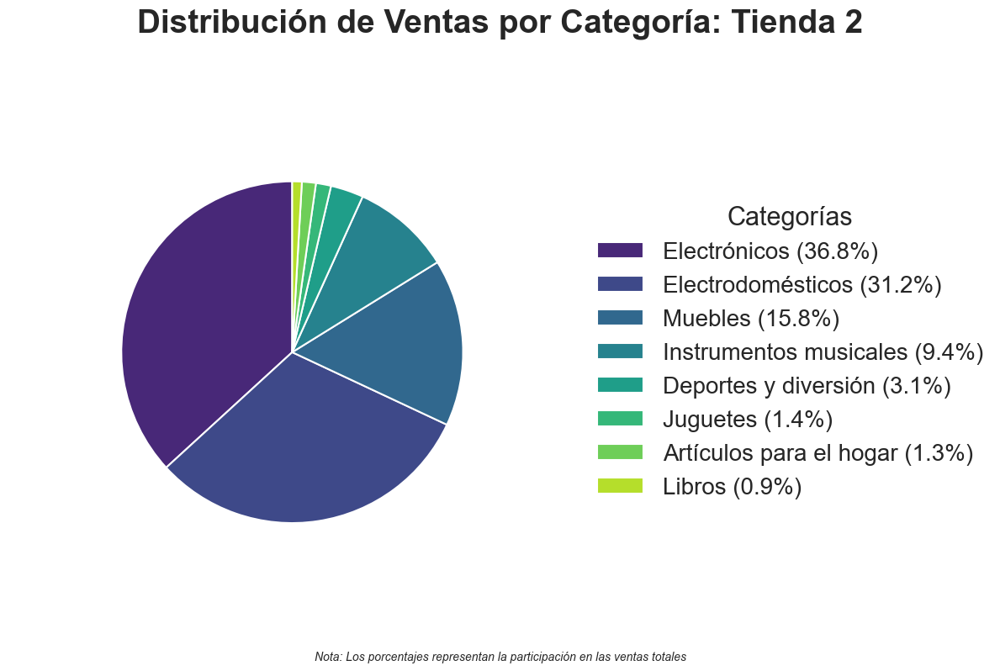

,Categoría del Producto,Precio
3,Electrónicos,"$410,775,800.00"
2,Electrodomésticos,"$329,237,900.00"
7,Muebles,"$201,072,100.00"
4,Instrumentos musicales,"$77,380,900.00"
1,Deportes y diversión,"$35,593,100.00"
5,Juguetes,"$19,401,100.00"
0,Artículos para el hogar,"$15,060,000.00"
6,Libros,"$9,498,700.00"


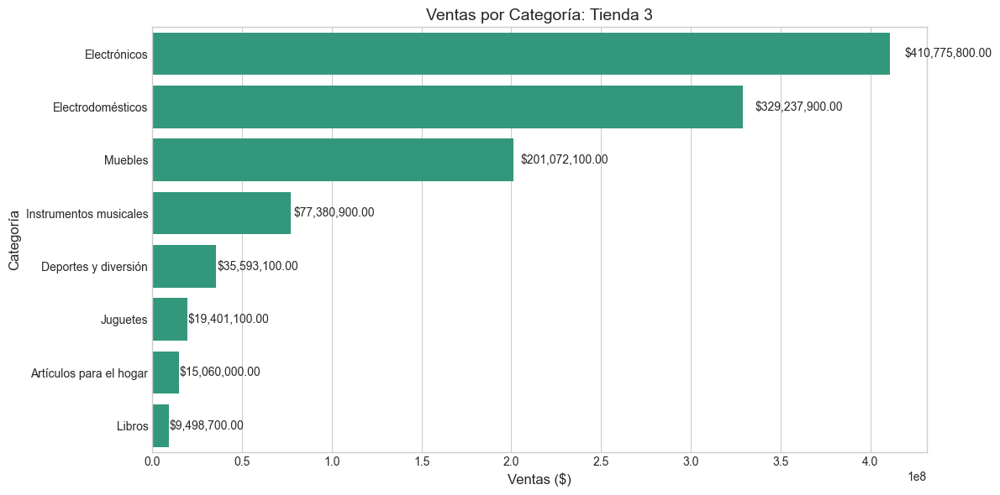

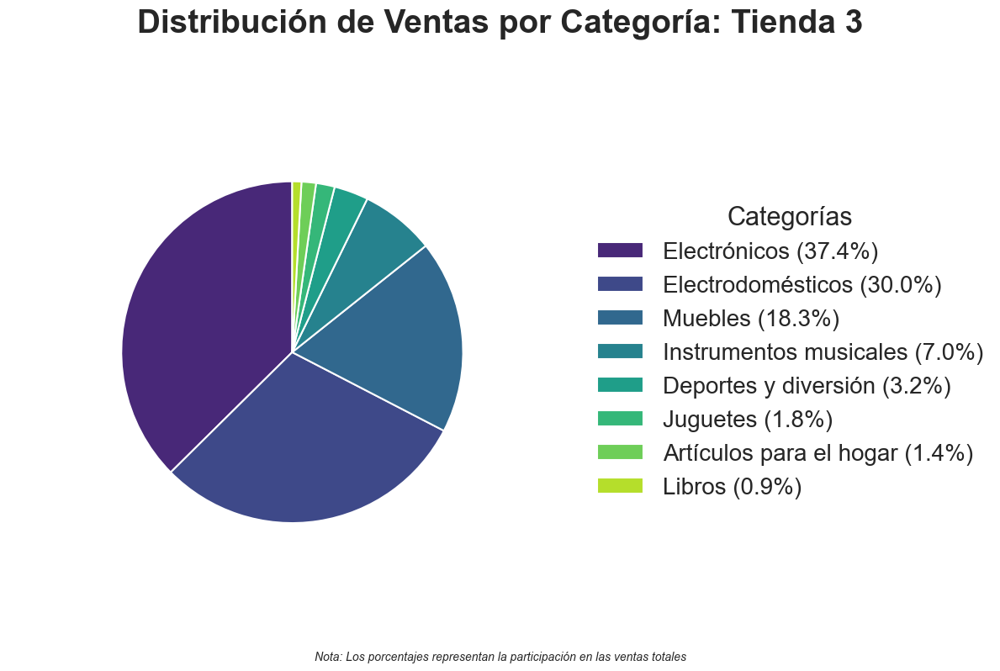

,Categoría del Producto,Precio
3,Electrónicos,"$409,476,100.00"
2,Electrodomésticos,"$283,260,200.00"
7,Muebles,"$192,528,900.00"
4,Instrumentos musicales,"$75,102,400.00"
1,Deportes y diversión,"$33,350,100.00"
5,Juguetes,"$20,262,200.00"
0,Artículos para el hogar,"$15,074,500.00"
6,Libros,"$9,321,300.00"


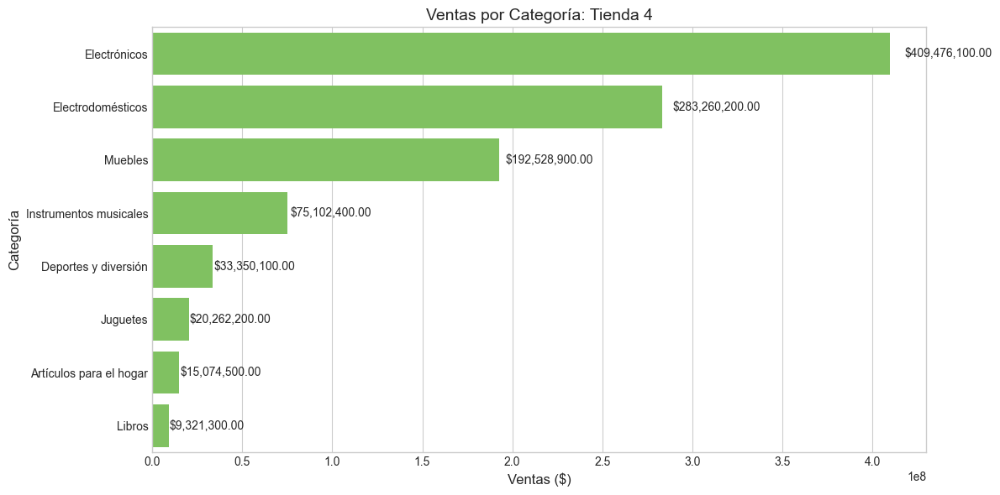

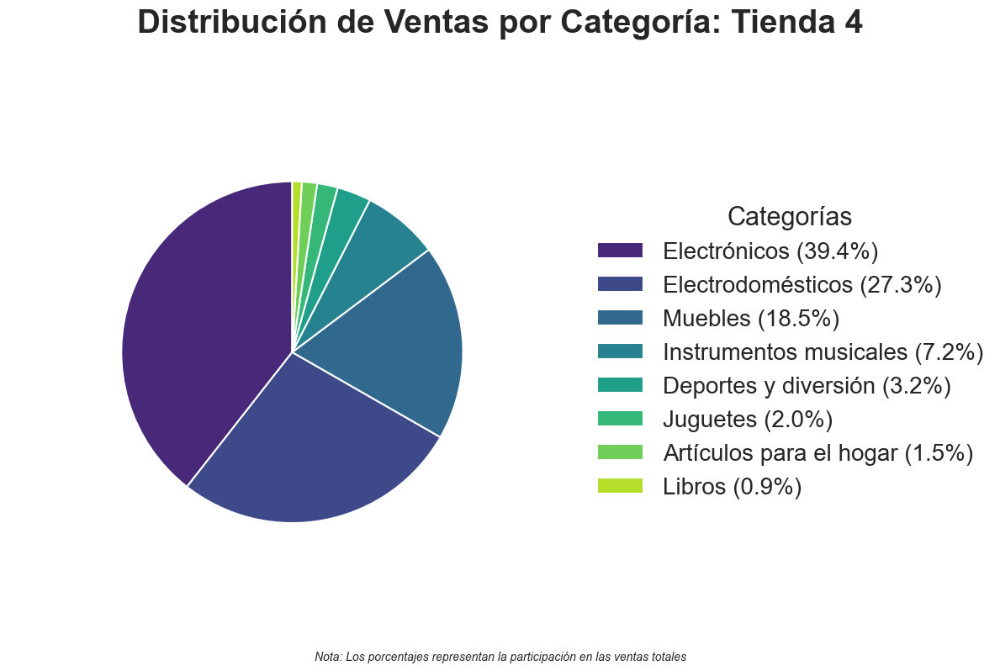

<Figure size 1400x800 with 0 Axes>

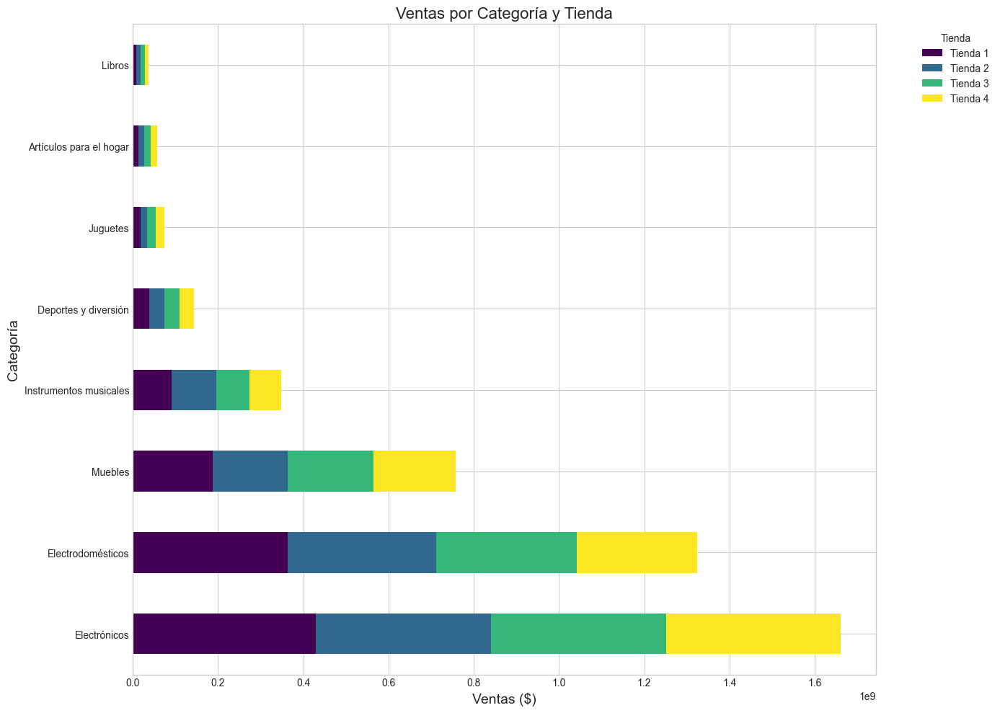

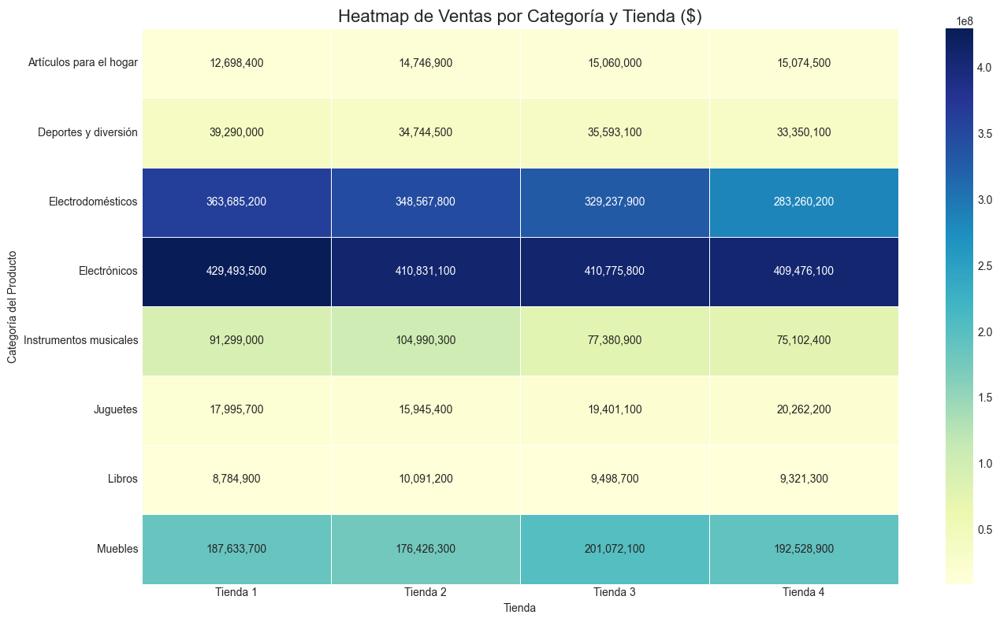

Tienda,Tienda 1,Tienda 2,Tienda 3,Tienda 4,Total por Categoría
Categoría del Producto,,,,,
Artículos para el hogar,"$12,698,400.00","$14,746,900.00","$15,060,000.00","$15,074,500.00","$57,579,800.00"
Deportes y diversión,"$39,290,000.00","$34,744,500.00","$35,593,100.00","$33,350,100.00","$142,977,700.00"
Electrodomésticos,"$363,685,200.00","$348,567,800.00","$329,237,900.00","$283,260,200.00","$1,324,751,100.00"
Electrónicos,"$429,493,500.00","$410,831,100.00","$410,775,800.00","$409,476,100.00","$1,660,576,500.00"
Instrumentos musicales,"$91,299,000.00","$104,990,300.00","$77,380,900.00","$75,102,400.00","$348,772,600.00"
Juguetes,"$17,995,700.00","$15,945,400.00","$19,401,100.00","$20,262,200.00","$73,604,400.00"
Libros,"$8,784,900.00","$10,091,200.00","$9,498,700.00","$9,321,300.00","$37,696,100.00"
Muebles,"$187,633,700.00","$176,426,300.00","$201,072,100.00","$192,528,900.00","$757,661,000.00"
Total por Tienda,"$1,150,880,400.00","$1,116,343,500.00","$1,098,019,600.00","$1,038,375,700.00","$4,403,619,200.00"


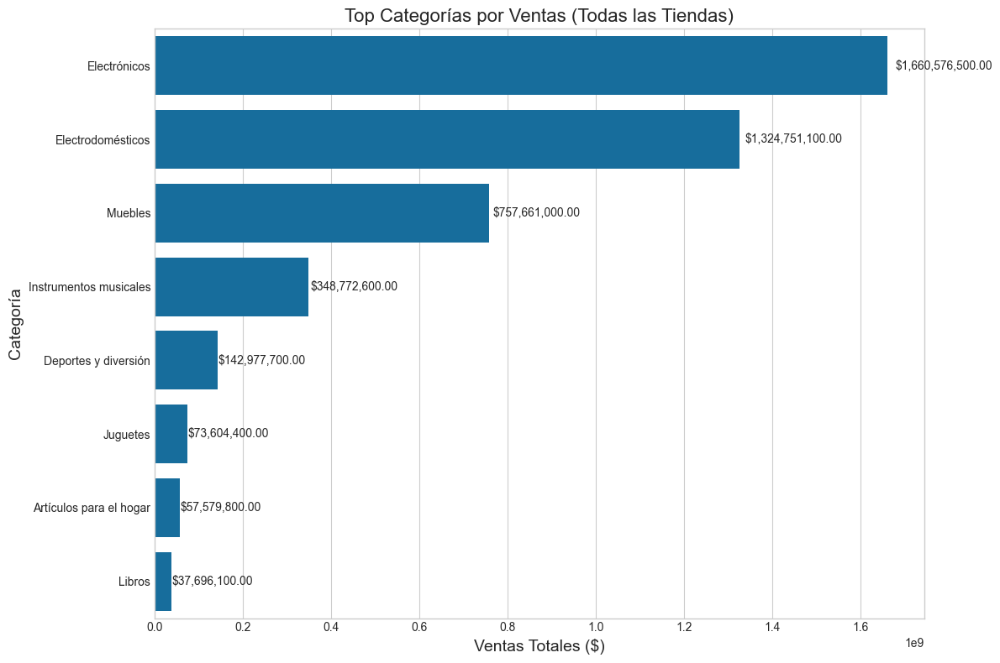

Análisis de ventas por categoría completado.


In [14]:
analisis_ventas_por_categoria(tiendas)

## 2.2. Cantidad de productos vendidos por categoría

In [15]:
def calcular_total_por_categoria(tiendas: dict[str, pd.DataFrame]) -> dict[str, pd.DataFrame]:
    """
    Calcula la cantidad de productos vendidos por categoría para cada tienda.
    
    Args:
        tiendas (dict): Diccionario con nombre de tienda y su DataFrame correspondiente
        
    Returns:
        dict: Diccionario con nombres de tiendas y DataFrames de cantidad de ventas por categoría
    """
    resultados = {}
    
    for nombre, df in tiendas.items():
        # Verificar que existan las columnas necesarias
        if 'Categoría del Producto' in df.columns and 'Precio' in df.columns:
            # Agrupar por categoría y contar los productos
            ventas_categoria = df.groupby('Categoría del Producto')['Producto'].count().reset_index()
            
            # Renombrar las columnas para mejor claridad
            ventas_categoria = ventas_categoria.rename(columns={
                'Categoría del Producto': 'Categoría',
                'Producto': 'Cantidad'
            })
            
            # Ordenar por cantidad descendente
            ventas_categoria = ventas_categoria.sort_values(by='Cantidad', ascending=False)
            resultados[nombre] = ventas_categoria
        else:
            logger.warning(f"[{nombre}] No se encontraron las columnas 'Categoría del Producto' o 'Producto'")
    
    return resultados

# Ejecutar función corregida
cantidad_ventas_categoria = calcular_total_por_categoria(tiendas)
cantidad_ventas_categoria

{'Tienda 1':                  Categoría  Cantidad
 7                  Muebles       465
 3             Electrónicos       448
 5                 Juguetes       324
 2        Electrodomésticos       312
 1     Deportes y diversión       284
 4   Instrumentos musicales       182
 6                   Libros       173
 0  Artículos para el hogar       171,
 'Tienda 2':                  Categoría  Cantidad
 7                  Muebles       442
 3             Electrónicos       422
 5                 Juguetes       313
 2        Electrodomésticos       305
 1     Deportes y diversión       275
 4   Instrumentos musicales       224
 6                   Libros       197
 0  Artículos para el hogar       181,
 'Tienda 3':                  Categoría  Cantidad
 7                  Muebles       499
 3             Electrónicos       451
 5                 Juguetes       315
 2        Electrodomésticos       278
 1     Deportes y diversión       277
 6                   Libros       185
 0  Artículo

### 2.2.1. Visualizar cantidad de productos vendidos por categorias

In [16]:
def visualizar_cantidad_por_categoria(resultados: dict[str, pd.DataFrame], 
                                    mostrar_individual: bool = True, 
                                    mostrar_comparativo: bool = True) -> None:
    """
    Visualiza las cantidad de ventas por categoría para cada tienda.
    
    Args:
        resultados (dict): Diccionario con nombres de tiendas y DataFrames de cantidad de ventas por categoría
        mostrar_individual (bool): Si se deben mostrar gráficos para cada tienda individual
        mostrar_comparativo (bool): Si se debe mostrar un gráfico comparativo entre tiendas
    """
    if not resultados:
        logger.warning("No hay datos de ventas por categoría para visualizar.")
        return
    
    # Colores para gráficos
    colores = sns.color_palette('viridis', len(resultados))
    
    # Crear un DataFrame combinado para comparaciones
    df_combinado = pd.DataFrame()
    
    # Visualizaciones individuales para cada tienda
    if mostrar_individual:
        for i, (nombre, df) in enumerate(resultados.items()):
            # Mostrar tabla HTML con valores formateados
            display(HTML(f"<h2 style='color:#2C3E50; background:#ECF0F1; padding:10px; border-radius:5px;'>Ventas por Categoría: {nombre}</h2>"))
            
            # Crear copia para no modificar el original
            df_display = df.copy()
            
            # Aplicar gradiente primero (a valores numéricos)
            styled_df = df_display.style.set_table_attributes('class="table table-striped table-hover"')\
                                       .set_properties(**{'text-align': 'center'})
                                       
            
            # Mostrar tabla HTML estilizada
            display(styled_df)
            
            # Gráfico de barras horizontal
            plt.figure(figsize=(12, max(6, len(df) * 0.4)))  # Ajustar altura según categorías
          
            ax = sns.barplot(x='Cantidad', y='Categoría', data=df, 
                           color=colores[i], orient='h')
            
            # Añadir valores a las barras
            for p in ax.patches:
                width = p.get_width()
                ax.text(width + width * 0.02, p.get_y() + p.get_height() / 2, 
                       f'{width}.', ha='left', va='center')
            
            plt.title(f'Cantidad por Categoría: {nombre}', fontsize=14)
            plt.xlabel('Cantidad (#)', fontsize=12)
            plt.ylabel('Categoría', fontsize=12)
            plt.tight_layout()
            plt.show()
            
            # Gráfico circular para mostrar distribución
            plt.figure(figsize=(12, 8))

            # Ordenar los datos para mayor claridad visual
            df_sorted = df.sort_values(by='Cantidad', ascending=False)

            # Seleccionar una paleta de colores más diferenciada
            colors = sns.color_palette('viridis', len(df_sorted))

            # Crear el gráfico de pastel
            wedges, texts, autotexts = plt.pie(
                df_sorted['Cantidad'], 
                labels=None,  # Quitamos las etiquetas directas para reducir solapamiento
                autopct='%1.1f%%', # Porcentajes
                startangle=90, # Comenzar desde el ángulo de 90 grados       
                colors=colors,
                wedgeprops={'edgecolor': 'white', 'linewidth': 1.5},  # Borde blanco para mejor separación
                textprops={'fontsize': 22, 'fontweight': 'bold'},     # Texto de porcentajes más visible
                pctdistance=0.8 # Ubicar los % más cerca del centro para evitar solapamiento
            )

            # Mejorando la apariencia de los porcentajes
            for autotext in autotexts:
                autotext.set_color('white')
                autotext.set_fontweight('bold')
                # Añadir contorno negro para mejor visibilidad en todos los colores
                autotext.set_path_effects([path_effects.withStroke(linewidth=3, foreground='black')])

            plt.axis('equal')  # Asegurar que el círculo sea un círculo

            # Título 
            plt.suptitle(f'Distribución de cantidad Ventas por Categoría: {nombre}', 
                    fontsize=28, fontweight='bold', y=0.98)
            
            # Crear una leyenda externa para mejor legibilidad
            plt.legend(
                df_sorted['Categoría'],  # Parece que hay un error tipográfico en 'Coategría'
                title="Categorías",
                loc="center left",
                bbox_to_anchor=(1, 0.5),  # Posicionar a la derecha del gráfico
                fontsize=20,
                title_fontsize=22  # Esto aumentará el tamaño del título de la leyenda
            )

            # Añadir una nota al pie
            plt.figtext(0.5, 0.01, 
                    "Nota: Los porcentajes representan la participación en las cantidades totales", 
                    ha="center", fontsize=16, style='italic')

            plt.tight_layout()
            plt.show()
            
            # Agregar datos al DataFrame combinado para comparación
            temp_df = df.copy()
            temp_df['Tienda'] = nombre
            df_combinado = pd.concat([df_combinado, temp_df])
    
    # Visualización comparativa entre tiendas
    if mostrar_comparativo and len(resultados) > 1:
        display(HTML("<h2 style='color:#2C3E50; background:#ECF0F1; padding:10px; border-radius:5px;'>Comparación de Ventas por Categoría Entre Tiendas</h2>"))
        
        # Obtener todas las categorías únicas
        categorias_unicas = df_combinado['Categoría'].unique()
        
        # 1. Gráfico de barras apiladas (stacked) por categoría
        pivot_df = df_combinado.pivot_table(
            index='Categoría', columns='Tienda', values='Cantidad', fill_value=0
        ).reset_index()
        
        # Ordenar por suma total de ventas por categoría
        pivot_df['Total'] = pivot_df.sum(axis=1, numeric_only=True)
        pivot_df = pivot_df.sort_values('Total', ascending=False).drop('Total', axis=1)
        
        plt.figure(figsize=(14, max(8, len(categorias_unicas) * 0.4)))
        pivot_df.set_index('Categoría').plot(kind='barh', stacked=True, figsize=(14, 10), 
                                           colormap='viridis')
        plt.title('Cantidad por Categoría y Tienda', fontsize=16)
        plt.xlabel('Cantidad (#)', fontsize=14)
        plt.ylabel('Categoría', fontsize=14)
        plt.legend(title='Tienda', bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.tight_layout()
        plt.show()
        
        # 2. Heatmap para comparar categorías entre tiendas
        plt.figure(figsize=(14, max(8, len(categorias_unicas) * 0.4)))
        pivot_wide = df_combinado.pivot_table(
            index='Categoría', columns='Tienda', values='Cantidad', fill_value=0
        )
        
        sns.heatmap(pivot_wide, annot=True, fmt=',.0f', cmap='YlGnBu', linewidths=.5)
        plt.title('Heatmap de cantidad de ventas por Categoría y Tienda', fontsize=16) 
        plt.tight_layout()
        plt.show()
        
        # 3. Tabla resumen con totales
        tabla_resumen = pivot_wide.copy()
        tabla_resumen['Total por Categoría'] = tabla_resumen.sum(axis=1)
        tabla_resumen.loc['Total por Tienda'] = tabla_resumen.sum(axis=0)
        
        # Primero aplicar el estilo sin formatear aún los valores como moneda
        styled_tabla = tabla_resumen.style\
            .set_table_attributes('class="table table-striped table-hover"')\
            .set_properties(**{'text-align': 'right'})\
            .set_properties(subset=['Total por Categoría'], **{'font-weight': 'bold'})\
            .set_properties(subset=pd.IndexSlice['Total por Tienda', :], **{'font-weight': 'bold'})\
            .format('{:.0f}') 
        
        display(HTML("<h3>Tabla Resumen de Cantidad de Ventas por Categoría</h3>"))
        display(styled_tabla)


,Categoría,Cantidad
7,Muebles,465
3,Electrónicos,448
5,Juguetes,324
2,Electrodomésticos,312
1,Deportes y diversión,284
4,Instrumentos musicales,182
6,Libros,173
0,Artículos para el hogar,171


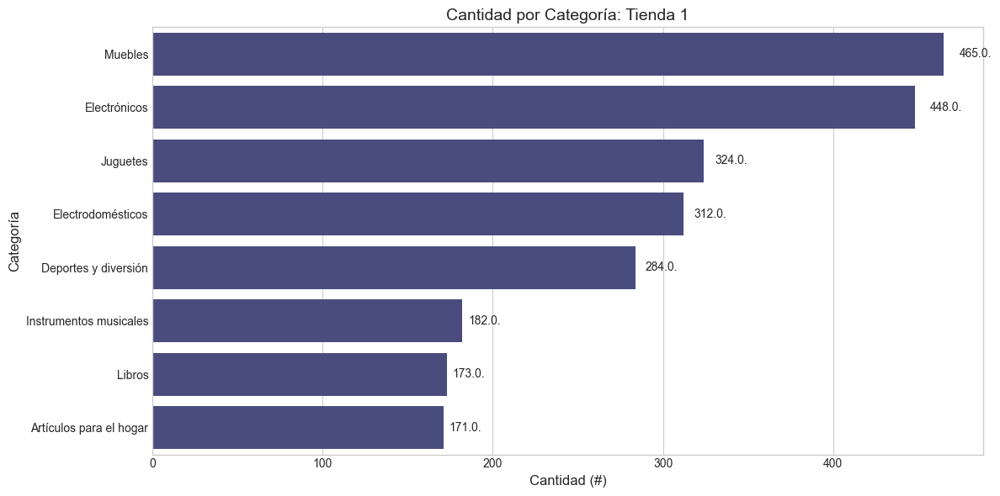

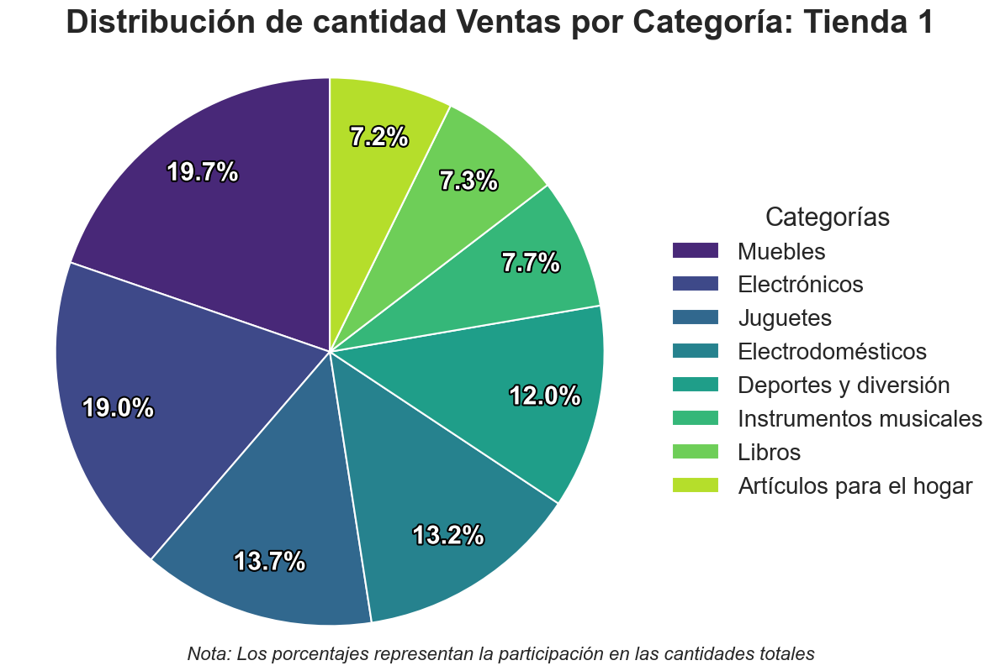

,Categoría,Cantidad
7,Muebles,442
3,Electrónicos,422
5,Juguetes,313
2,Electrodomésticos,305
1,Deportes y diversión,275
4,Instrumentos musicales,224
6,Libros,197
0,Artículos para el hogar,181


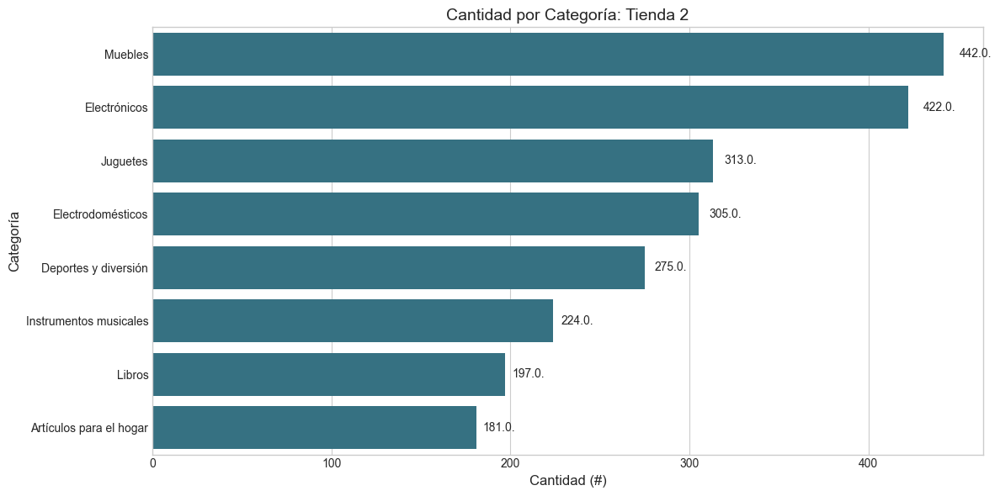

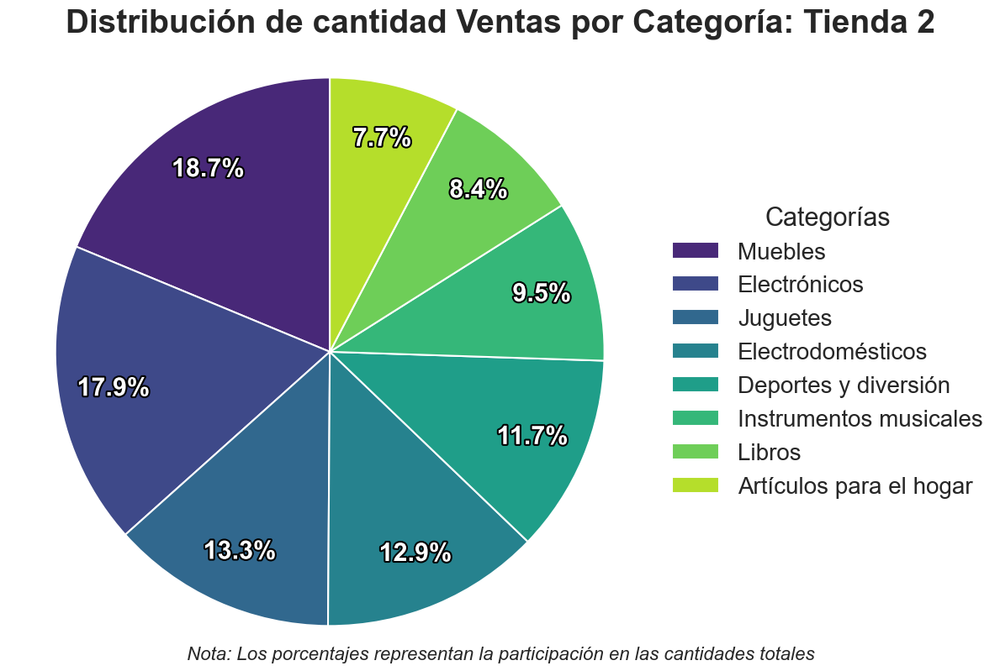

,Categoría,Cantidad
7,Muebles,499
3,Electrónicos,451
5,Juguetes,315
2,Electrodomésticos,278
1,Deportes y diversión,277
6,Libros,185
0,Artículos para el hogar,177
4,Instrumentos musicales,177


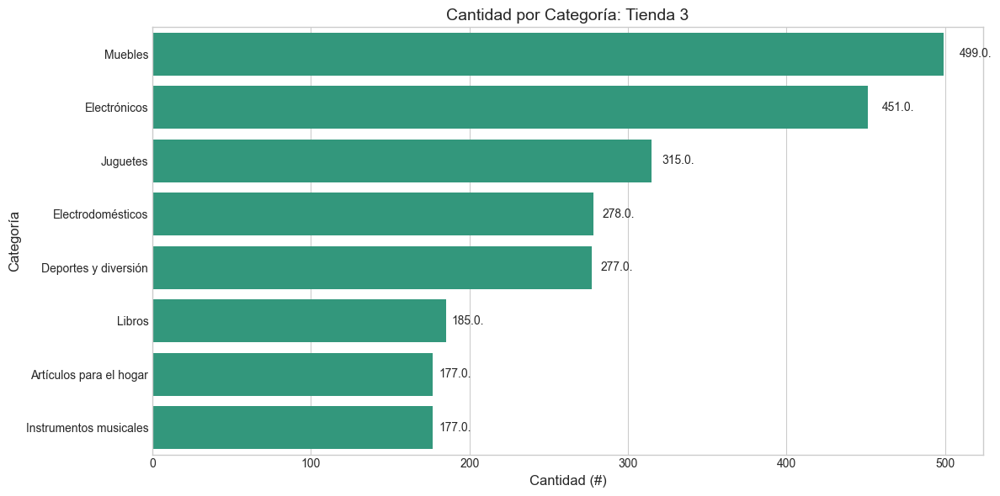

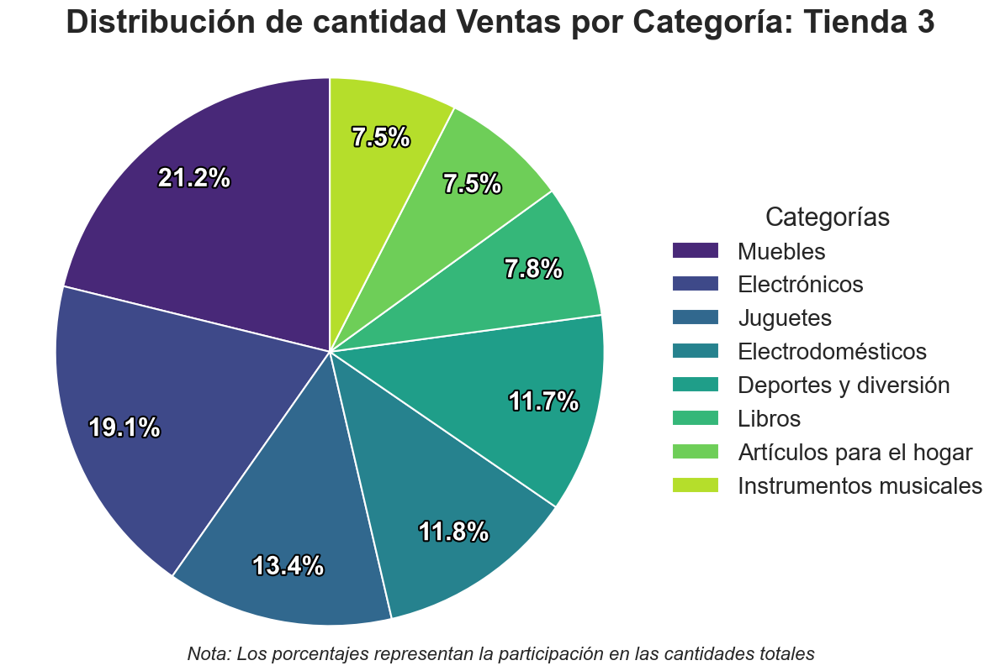

,Categoría,Cantidad
7,Muebles,480
3,Electrónicos,451
5,Juguetes,338
1,Deportes y diversión,277
2,Electrodomésticos,254
0,Artículos para el hogar,201
6,Libros,187
4,Instrumentos musicales,170


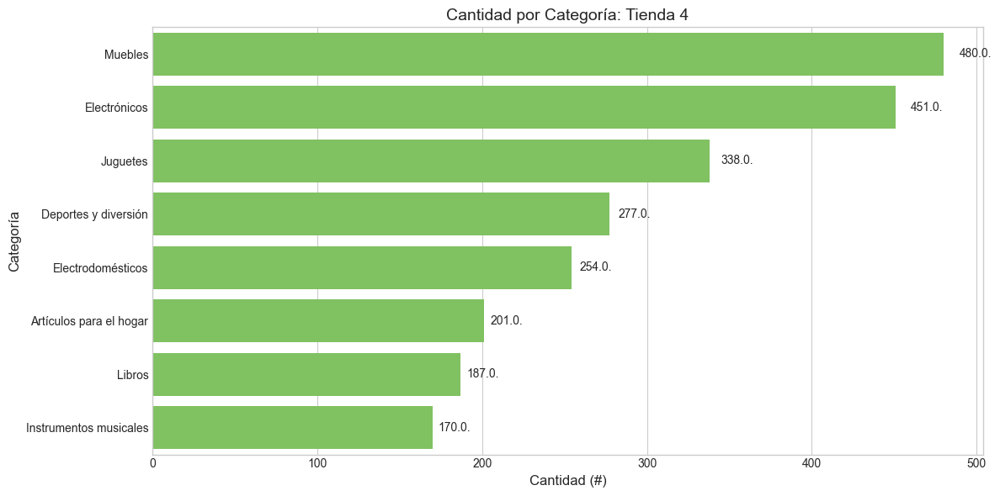

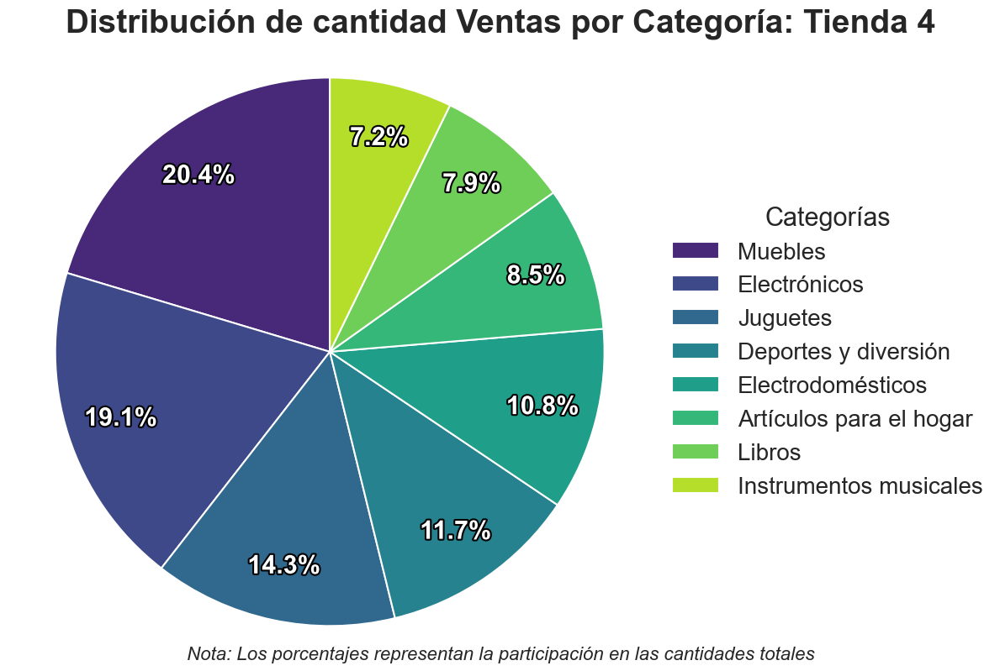

<Figure size 1400x800 with 0 Axes>

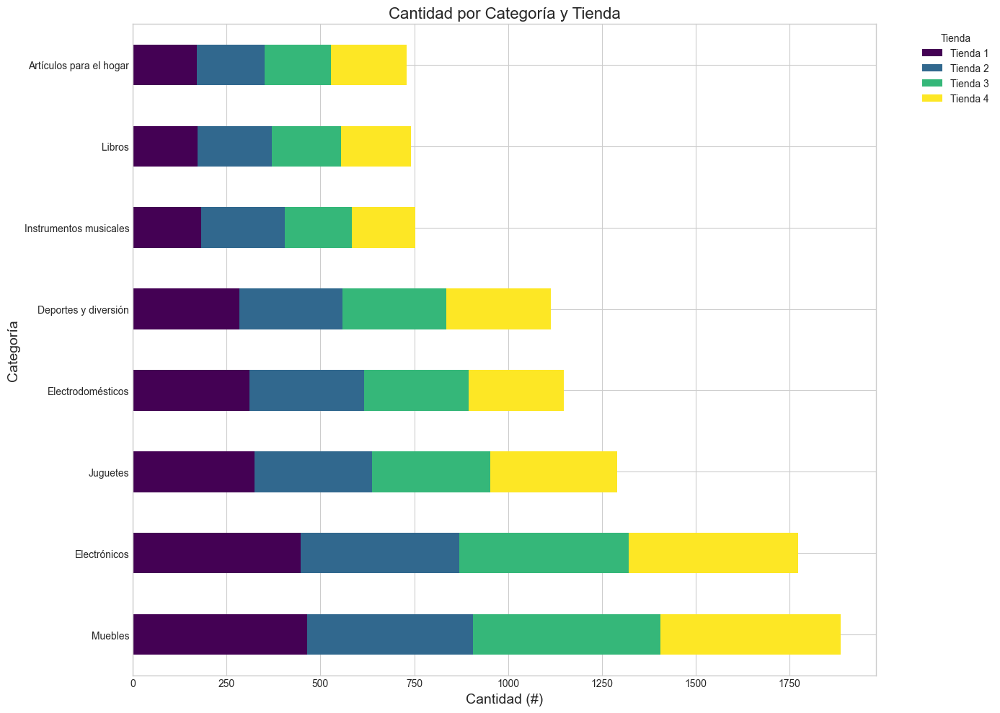

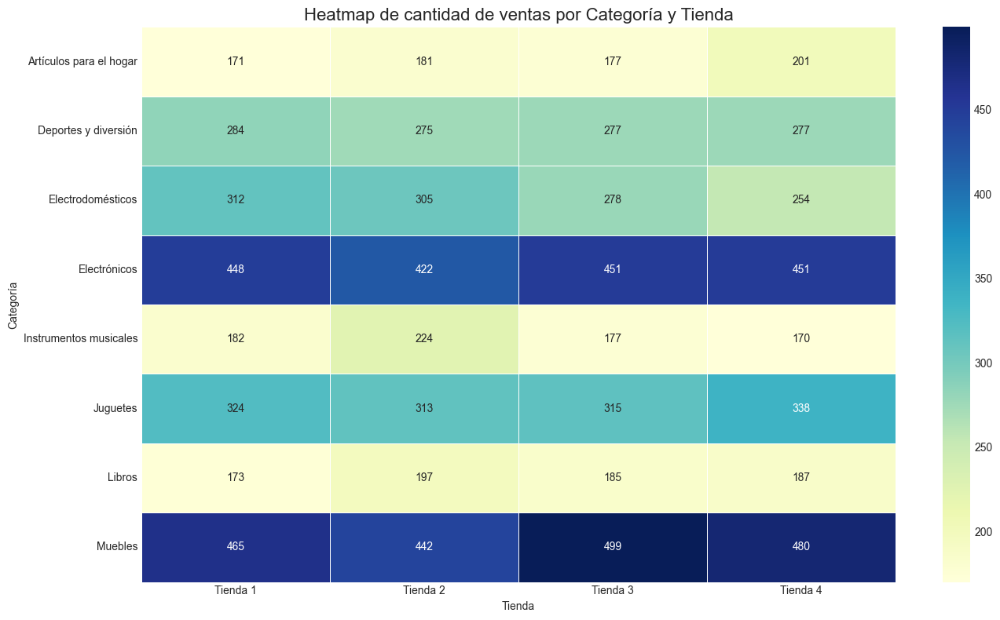

Tienda,Tienda 1,Tienda 2,Tienda 3,Tienda 4,Total por Categoría
Categoría,,,,,
Artículos para el hogar,171,181,177,201,730
Deportes y diversión,284,275,277,277,1113
Electrodomésticos,312,305,278,254,1149
Electrónicos,448,422,451,451,1772
Instrumentos musicales,182,224,177,170,753
Juguetes,324,313,315,338,1290
Libros,173,197,185,187,742
Muebles,465,442,499,480,1886
Total por Tienda,2359,2359,2359,2358,9435


In [17]:
# Para ver SOLO las comparativas entre tiendas
visualizar_cantidad_por_categoria(cantidad_ventas_categoria)

Este análisis es muy interesante, debido a que nos da una visión mucho más amplia acerca de las ventas. Si hablamos de las cantidades de productos vendidos, observamos que los Muebles lideran con 1,886 unidades, seguidos por los Electrónicos con 1,772 unidades. Sin embargo, en términos de ingresos, son los Electrónicos los que generan mayores ganancias para las tiendas, con un promedio aproximado de $415 millones por tienda.

Los datos también nos permiten identificar que la tienda que menos unidades vendió fue la Tienda 4 con 2,358 productos, apenas una unidad menos que las demás tiendas. Por otro lado, la Tienda 1 generó los mayores ingresos con un total de $1,150,880,400.00, mientras que la Tienda 4 obtuvo los menores ingresos con $1,038,375,700.00.

Es destacable que aunque los Juguetes ocupan la tercera posición en cantidad vendida (1,290 unidades), sus ingresos son relativamente bajos en comparación con otras categorías como Electrodomésticos, que con menos unidades (1,149) generan ingresos significativamente mayores. Esto sugiere una diferencia importante en el precio unitario y el margen de ganancia entre las distintas categorías de productos.

Adicionalmente, podemos observar que la distribución de ventas por unidades es bastante uniforme entre las cuatro tiendas, lo que indica una consistencia operativa en la red de tiendas. Sin embargo, los ingresos muestran mayores variaciones, lo que podría sugerir diferentes estrategias de venta, ubicaciones con distinto poder adquisitivo, o variaciones en el mix de productos vendidos en cada tienda.

# 3. Calificación promedio de la tienda


In [18]:
def calcular_calificacion(tiendas: dict[str, pd.DataFrame]) -> dict[str, float]:
    """
    Calcula la calificación promedio para cada tienda y devuelve un diccionario
    con los resultados.
    
    Args:
        tiendas (dict): Diccionario con nombre de tienda y su DataFrame correspondiente
        
    Returns:
        dict: Diccionario con nombres de tiendas y su calificación promedio
    """
    calificaciones_promedio = {}  # Diccionario para almacenar los resultados
    
    for nombre, df in tiendas.items():
        # Verificamos si la columna necesaria existe
        if 'Calificación' in df.columns:
            # Calculamos la calificación promedio
            promedio = df['Calificación'].sum() / df['Calificación'].count()
            calificaciones_promedio[nombre] = promedio
        else:
            logger.warning(f"[{nombre}] No se encontró la columna 'Calificación'.")
    
    return calificaciones_promedio

# Ejecutar la función y guardar el resultado con un nombre diferente
calificaciones = calcular_calificacion(tiendas)
calificaciones

{'Tienda 1': np.float64(3.976685036032217),
 'Tienda 2': np.float64(4.037303942348453),
 'Tienda 3': np.float64(4.048325561678677),
 'Tienda 4': np.float64(3.9957591178965224)}

In [19]:
def visualizar_calificaciones(calificaciones: dict[str, float]) -> None:
    """
    Visualiza las calificaciones promedio de las tiendas mediante múltiples gráficos:
    - Gráfico de barras comparativo
    - Gráfico circular (pastel)
    - Gráfico lineal de tendencia
    - Tabla de valores
    
    Args:
        calificaciones (dict): Diccionario con nombres de tiendas y sus calificaciones promedio
    """
    if not calificaciones:
        logger.warning("No hay datos de calificaciones para visualizar.")
        return
    
    # Convertir a DataFrame para facilitar la visualización
    df_calificaciones = pd.DataFrame({
        'Tienda': list(calificaciones.keys()),
        'Calificación Promedio': list(calificaciones.values())
    })
    
    # Ordenar por calificación para mejor visualización
    df_calificaciones = df_calificaciones.sort_values(by='Calificación Promedio', ascending=False)
    
    # Establecer estilo
    plt.style.use('seaborn-v0_8-whitegrid')
    sns.set_palette("viridis")
    
    # Crear una figura con tres subplots: barras, pastel y línea
    fig = plt.figure(figsize=(18, 14))
    
    # Definir layout con GridSpec para mejor control
    gs = fig.add_gridspec(2, 2, height_ratios=[1, 1])
    
    # 1. GRÁFICO DE BARRAS (arriba izquierda)
    ax1 = fig.add_subplot(gs[0, 0])
    bars = sns.barplot(x='Tienda', y='Calificación Promedio', data=df_calificaciones, ax=ax1)
    
    # Añadir etiquetas precisas en las barras
    for bar in bars.patches:
        ax1.annotate(f'{bar.get_height():.2f}',
                   (bar.get_x() + bar.get_width() / 2, bar.get_height()),
                   ha='center', va='bottom',
                   fontsize=12)
    
    # Configurar título y etiquetas
    ax1.set_title('Calificación Promedio por Tienda', fontsize=16)
    ax1.set_xlabel('Tienda', fontsize=14)
    ax1.set_ylabel('Calificación (0-5)', fontsize=14)
    
    # Establecer límites y línea de referencia
    ax1.set_ylim(0, 5)  # Rango completo de calificaciones
    ax1.axhline(y=4.0, color='red', linestyle='--', alpha=0.7)
    ax1.text(ax1.get_xlim()[1]*0.01, 4.05, 'Calificación 4.0', color='red', fontsize=12)
    
    # 2. GRÁFICO CIRCULAR (arriba derecha)
    ax2 = fig.add_subplot(gs[0, 1])
    
    # Para el gráfico de pastel, necesitamos valores relativos
    # Como las calificaciones son muy similares, presentaremos la diferencia respecto a la mínima calificación
    min_calif = min(calificaciones.values())
    valores_ajustados = {tienda: calif - min_calif + 0.1 for tienda, calif in calificaciones.items()}
    
    # Crear etiquetas más informativas
    etiquetas = [f"{tienda}\n({calificaciones[tienda]:.2f})" for tienda in valores_ajustados.keys()]
    
    wedges, texts, autotexts = ax2.pie(
        list(valores_ajustados.values()),
        autopct='%1.1f%%',
        startangle=90,
        labels=etiquetas,
        wedgeprops={'width': 0.6, 'edgecolor': 'w'},
        textprops={'fontsize': 12}
    )
    
    # Ajustar colores de texto para visibilidad
    for autotext in autotexts:
        autotext.set_color('white')
        autotext.set_fontweight('bold')
    
    ax2.set_title('Distribución Relativa de Calificaciones\n(proporcional a la diferencia sobre la calificación mínima)', 
                 fontsize=14)
    
    # 3. GRÁFICO LINEAL (abajo, ocupando todo el ancho)
    ax3 = fig.add_subplot(gs[1, :])
    
    # Ordenar por nombre de tienda para el gráfico de tendencia
    df_tendencia = df_calificaciones.sort_index()
    
    # Graficar línea con marcadores
    ax3.plot(df_calificaciones['Tienda'], df_calificaciones['Calificación Promedio'], 
             marker='o', linewidth=2, markersize=12)
    
    # Añadir etiquetas a cada punto
    for x, y in zip(df_calificaciones['Tienda'], df_calificaciones['Calificación Promedio']):
        ax3.annotate(f'{y:.2f}', (x, y), textcoords="offset points", 
                    xytext=(0, 10), ha='center', fontsize=12)
    
    # Añadir línea horizontal de referencia
    ax3.axhline(y=4.0, color='gray', linestyle='--', alpha=0.6)
    
    # Configurar título y etiquetas
    ax3.set_title('Tendencia de Calificaciones por Tienda', fontsize=16)
    ax3.set_xlabel('Tienda', fontsize=14)
    ax3.set_ylabel('Calificación Promedio', fontsize=14)
    ax3.set_ylim(3.9, 4.1)  # Ajustar para ver mejor las diferencias
    ax3.grid(True, linestyle='--', alpha=0.7)
    
    # Ajustar layout
    plt.tight_layout(pad=3)
    
    # Mostrar la visualización completa
    display(HTML(f"<h2 style='color:#2C3E50; background:#ECF0F1; padding:10px; border-radius:5px;'>Análisis de Calificaciones por Tienda</h2>"))
    plt.show()
    
    # 4. TABLA HTML con los valores exactos
    display(HTML("<h3>Calificaciones Promedio por Tienda</h3>"))
    
    # Formatear DataFrame para visualización
    styled_df = df_calificaciones.style\
        .set_table_attributes('class="table table-striped table-hover"')\
        .set_properties(**{'text-align': 'center'})\
        .format({'Calificación Promedio': '{:.2f}%'})
    
    # Mostrar tabla estilizada
    display(styled_df)

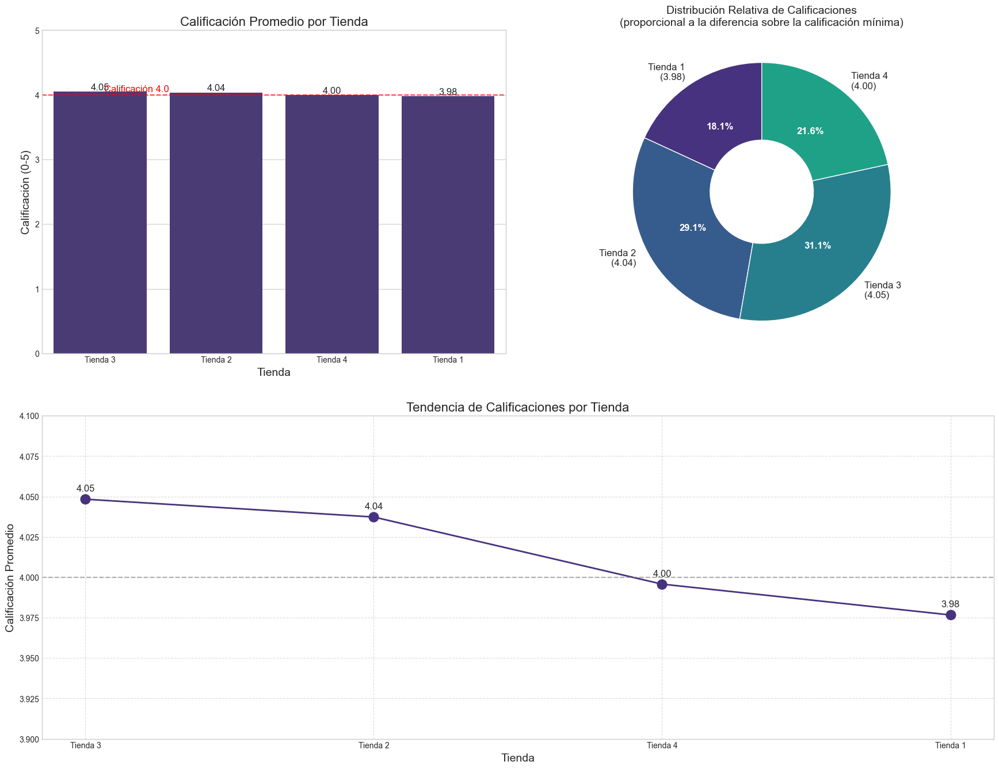

,Tienda,Calificación Promedio
2,Tienda 3,4.05%
1,Tienda 2,4.04%
3,Tienda 4,4.00%
0,Tienda 1,3.98%


In [20]:
visualizar_calificaciones(calificaciones)

Resulta particularmente revelador, aunque pudiera parecer contraintuitivo, que la Tienda 1 —líder indiscutible en facturación con más de $1,150 millones— sea simultáneamente la que recibe las calificaciones más bajas por parte de los clientes (3.98). Este hallazgo es extremadamente valioso desde una perspectiva estratégica, pues evidencia que existe un importante potencial de crecimiento aún sin explotar en este establecimiento.

La aparente contradicción entre alto rendimiento financiero y menor satisfacción del cliente sugiere que la Tienda 1 podría estar priorizando el volumen de ventas sobre la experiencia del usuario. Si consideramos que esta tienda ya lidera en facturación a pesar de tener la menor calificación en servicio, es razonable proyectar que una mejora en la atención al cliente podría traducirse en un incremento sustancial tanto en ventas como en fidelización.

Este descubrimiento representa una oportunidad de oro para la empresa: si se implementan estrategias enfocadas en mejorar la experiencia del cliente en la Tienda 1, elevando su calificación al nivel de la Tienda 3 (4.05), podríamos anticipar un aumento significativo en el ticket promedio por cliente, mayor frecuencia de visitas y un incremento en las recomendaciones boca a boca, factores que impulsarían aún más sus ya sobresalientes resultados financieros.

En términos concretos, la Tienda 1 posee un "techo de crecimiento" mucho más alto de lo que sus actuales cifras sugieren. La inversión en capacitación de personal, optimización de procesos de atención y mejora de la experiencia de compra podría generar un retorno excepcional, considerando que ya cuenta con una base sólida de clientela y ventas. Este es uno de esos casos donde la brecha identificada no representa una debilidad, sino una poderosa oportunidad para consolidar aún más el liderazgo de este establecimiento en la red comercial.

# 4. Productos más y menos vendidos

In [ ]:
def calcular_cantidad_productos(tiendas: dict[str, pd.DataFrame], 
                              ordenar: bool = True,
                              ascendente: bool = False) -> dict[str, pd.DataFrame]:
    """
    Calcula la cantidad de veces que se ha vendido cada producto para cada tienda.
    
    Args:
        tiendas (dict): Diccionario con nombre de tienda y su DataFrame correspondiente
        ordenar (bool): Indica si se debe ordenar el resultado por cantidad
        ascendente (bool): Indica si el ordenamiento debe ser ascendente (True) o descendente (False)
        
    Returns:
        dict: Diccionario con nombres de tiendas y DataFrames de cantidad de ventas por producto
    """
    resultados = {}
    total_productos = 0
    
    for nombre, df in tiendas.items():
        # Verificar que existan las columnas necesarias
        if 'Producto' in df.columns:
            # Agrupar por producto y contar las apariciones
            ventas_producto = df.groupby('Producto').size().reset_index(name='Cantidad')
            
            # Ordenar por cantidad si se solicita
            if ordenar:
                ventas_producto = ventas_producto.sort_values(by='Cantidad', ascending=ascendente)
            
            # Guardar resultado en el diccionario
            resultados[nombre] = ventas_producto
            
            # Sumar al total de productos vendidos
            total_productos += ventas_producto['Cantidad'].sum()
        else:
            logger.warning(f"[{nombre}] No se encontró la columna 'Producto'")
    
    # Mostrar resumen
    if resultados:
        logger.info(f"Se encontraron {total_productos} productos vendidos en {len(resultados)} tiendas")
    else:
        logger.warning("No se pudo calcular la cantidad de productos para ninguna tienda")
    
    return resultados

In [22]:
cantidad_ventas_productos_desendente = calcular_cantidad_productos(tiendas, ordenar=True, ascendente=False)
cantidad_ventas_productos_desendente 

Se encontraron 9435 productos vendidos en 4 tiendas


{'Tienda 1':                        Producto  Cantidad
 1                       Armario        60
 48                TV LED UHD 4K        60
 33                   Microondas        60
 40             Secadora de ropa        58
 32                Mesa de noche        56
 9       Bloques de construcción        56
 5           Balón de baloncesto        55
 8                     Bicicleta        54
 23                    Impresora        54
 50                 Vaso térmico        54
 39                 Refrigerador        54
 7                       Batería        53
 15                   Cubertería        52
 12    Carrito de control remoto        52
 35          Modelado predictivo        51
 3                   Auriculares        50
 0             Ajedrez de madera        49
 25                    Iphone 15        49
 29                 Lavavajillas        48
 22           Guitarra eléctrica        47
 28             Lavadora de ropa        47
 43             Silla de oficina        46

In [23]:
cantidad_ventas_productos_ascendente = calcular_cantidad_productos(tiendas, ordenar=True, ascendente=True)
cantidad_ventas_productos_ascendente

Se encontraron 9435 productos vendidos en 4 tiendas


{'Tienda 1':                        Producto  Cantidad
 4     Auriculares con micrófono        33
 13                 Celular ABXY        33
 37              Olla de presión        35
 38                    Pandereta        36
 14  Ciencia de datos con Python        39
 34                      Mochila        39
 19               Dinosaurio Rex        40
 2             Asistente virtual        40
 36                  Muñeca bebé        40
 31              Mesa de comedor        40
 17           Cuerda para saltar        40
 44                       Sillón        41
 42                 Set de vasos        41
 24    Iniciando en programación        41
 6             Balón de voleibol        42
 18      Dashboards con Power BI        42
 49                  Tablet ABXY        42
 41                 Set de ollas        43
 26                Juego de mesa        43
 46                   Smartwatch        43
 16              Cubo mágico 8x8        44
 11                    Cama king        44

## 4.1. Visualizacion de datos mas y menos vendidos por tienda

In [ ]:
def visualizar_cantidad_productos(resultados: dict[str, pd.DataFrame],
                                  orden: str = 'descendente',
                                  colores: list = None) -> None:
    if colores is None:
        colores = sns.color_palette('viridis', len(resultados))
        
    for i, (nombre, df) in enumerate(resultados.items()):
            # Mostrar tabla HTML con valores formateados
            display(HTML(f"<h2 style='color:#2C3E50; background:#ECF0F1; padding:10px; border-radius:5px;'>Ventas por Producto ({"Descendente" if orden == 'descendente' else "Ascendente"}): {nombre}</h2>"))
            
            # Crear copia para no modificar el original
            df_display = df.copy()
            
            # Aplicar gradiente primero (a valores numéricos)
            styled_df = df_display.style.set_table_attributes('class="table table-striped table-hover"')\
                                       .set_properties(**{'text-align': 'center'})
                                       
            
            # Mostrar tabla HTML estilizada
            display(styled_df)
            
            # Gráfico de barras horizontal
            plt.figure(figsize=(12, max(6, len(df) * 0.4)))  # Ajustar altura según productos
            ax = sns.barplot(x='Cantidad', y='Producto', data=df, 
                           color=colores[i], orient='h')
            
            # Añadir valores a las barras
            for p in ax.patches:
                width = p.get_width()
                ax.text(width + width * 0.02, p.get_y() + p.get_height() / 2, 
                       f'{width}', ha='left', va='center')
            
            plt.title(f'Ventas por Producto ({"Descendente" if orden == 'descendente' else "Ascendente"}): {nombre}', fontsize=14)
            plt.xlabel('Cantidad (#)', fontsize=12)
            plt.ylabel('Producto', fontsize=12)
            plt.tight_layout()
            plt.show()
            
            # Gráfico circular para mostrar distribución
            plt.figure(figsize=(12, 8))
            # Ordenar los datos para mayor claridad visual
            df_sorted = df.sort_values(by='Cantidad', ascending=False)
            # Calcular porcentajes para incluirlos en la leyenda
            total = df_sorted['Cantidad'].sum()
            df_sorted['Porcentaje'] = (df_sorted['Cantidad'] / total * 100).round(1)
            # Crear etiquetas con porcentajes para la leyenda
            legend_labels = [f"{prod} ({pct:.1f}%)" for prod, pct in zip(df_sorted['Producto'], df_sorted['Porcentaje'])]
            # Seleccionar una paleta de colores más diferenciada
            colors = sns.color_palette('viridis', len(df_sorted))
            # Crear el gráfico de pastel SIN porcentajes en el gráfico
            wedges, texts = plt.pie( 
                df_sorted['Cantidad'], 
                labels=None,          # Sin etiquetas directas
                autopct=None,         # Sin porcentajes automáticos
                startangle=90,        
                colors=colors,
                wedgeprops={'edgecolor': 'white', 'linewidth': 1.5}
            )
            plt.axis('equal')
            # Asegurar que el círculo sea un círculo
            plt.suptitle(f'Distribución de Ventas por Producto ({"Descendente" if orden == 'descendente' else "Ascendente"}): {nombre}', 
                    fontsize=28, fontweight='bold', y=0.98)
            # Crear una leyenda externa con los porcentajes incluidos
            plt.legend(
                wedges,                # Pasamos los wedges para asociar cada sector con su etiqueta
                legend_labels,         # Etiquetas con producto y porcentaje
                title="Productos",
                loc="center left",
                bbox_to_anchor=(1, 0, 0.5, 1),
                fontsize=20,
                title_fontsize=22
            )
            # Añadir una nota al pie
            plt.figtext(0.5, 0.01, 
                    "Nota: Los porcentajes representan la participación en las cantidades totales", 
                    ha="center", fontsize=10, style='italic')
            plt.tight_layout()
            plt.show()

In [41]:
def visualizar_ventas_por_producto(desendente: dict[str, pd.DataFrame], 
                                   ascendente: dict[str, pd.DataFrame]) -> None:
   
    if not desendente and not ascendente:
        logger.warning("No hay datos de ventas por producto para visualizar.")
        return
    # Colores para gráficos
    colores = sns.color_palette('viridis', max(len(desendente), len(ascendente)))
    
    # Visualizaciones individuales para cada tienda en orden descendente
    visualizar_cantidad_productos(desendente, orden='descendente', colores=colores)
    visualizar_cantidad_productos(ascendente, orden='ascendente', colores=colores)
        

,Producto,Cantidad
1,Armario,60
48,TV LED UHD 4K,60
33,Microondas,60
40,Secadora de ropa,58
32,Mesa de noche,56
9,Bloques de construcción,56
5,Balón de baloncesto,55
8,Bicicleta,54
23,Impresora,54
50,Vaso térmico,54


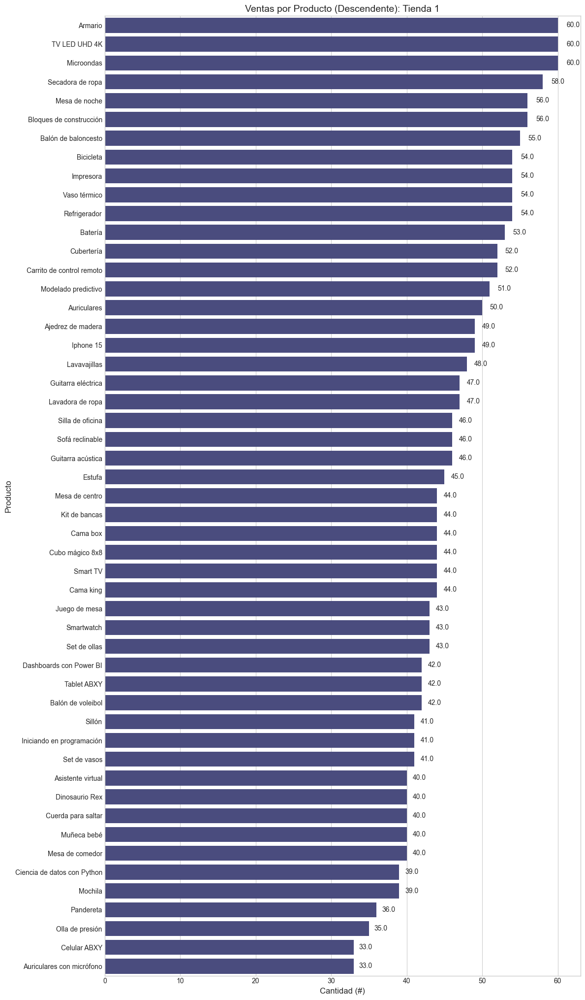

C:\Users\Gouther\AppData\Local\Temp\ipykernel_10720\2356897232.py:77: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


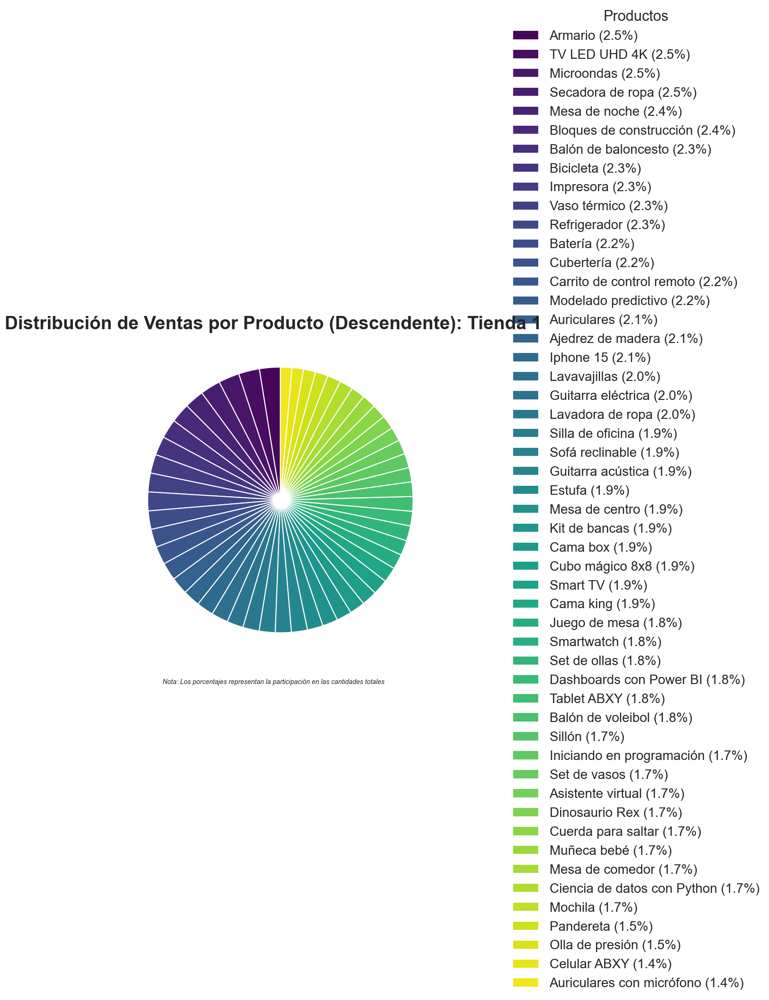

,Producto,Cantidad
24,Iniciando en programación,65
33,Microondas,62
7,Batería,61
38,Pandereta,58
21,Guitarra acústica,58
40,Secadora de ropa,57
25,Iphone 15,55
9,Bloques de construcción,54
1,Armario,54
41,Set de ollas,52


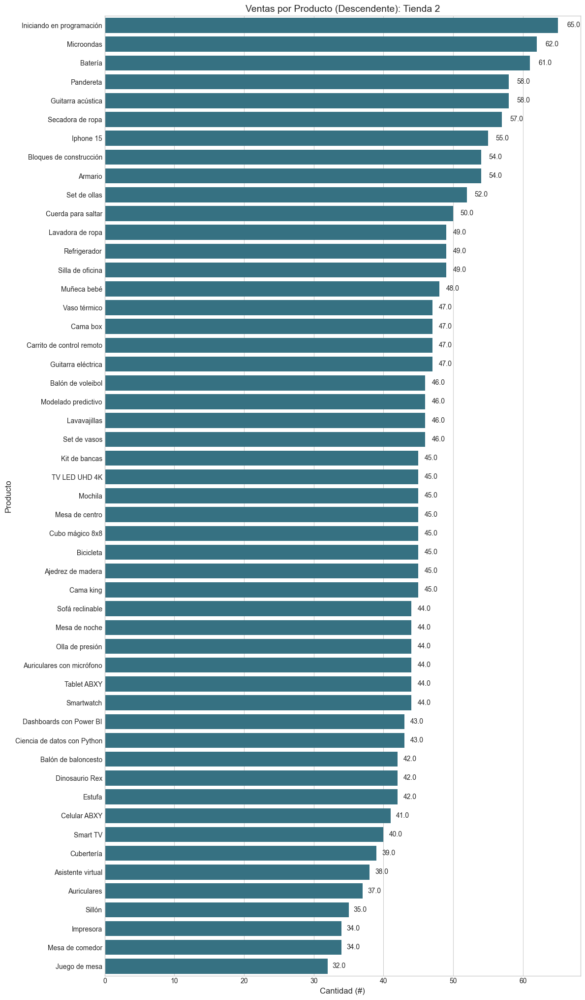

C:\Users\Gouther\AppData\Local\Temp\ipykernel_10720\2356897232.py:77: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


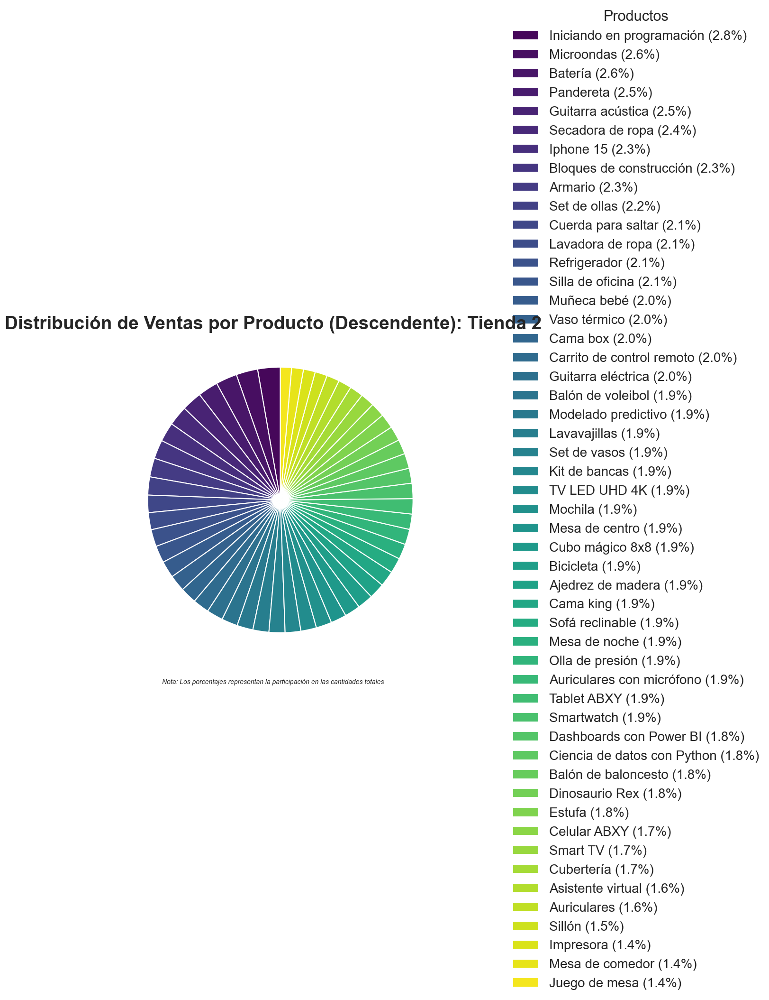

,Producto,Cantidad
27,Kit de bancas,57
31,Mesa de comedor,56
11,Cama king,56
41,Set de ollas,55
32,Mesa de noche,55
45,Smart TV,54
35,Modelado predictivo,53
17,Cuerda para saltar,53
20,Estufa,53
12,Carrito de control remoto,52


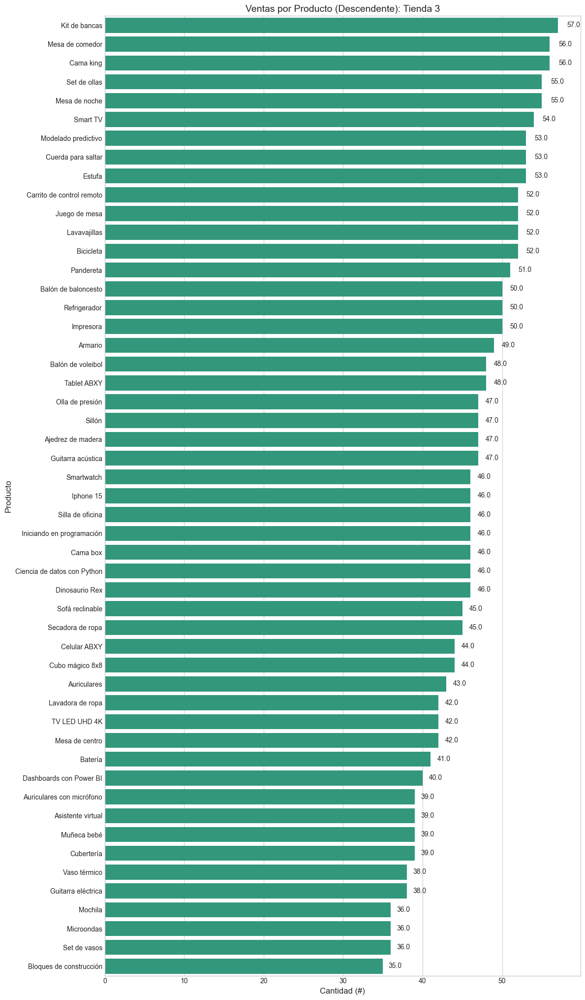

C:\Users\Gouther\AppData\Local\Temp\ipykernel_10720\2356897232.py:77: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


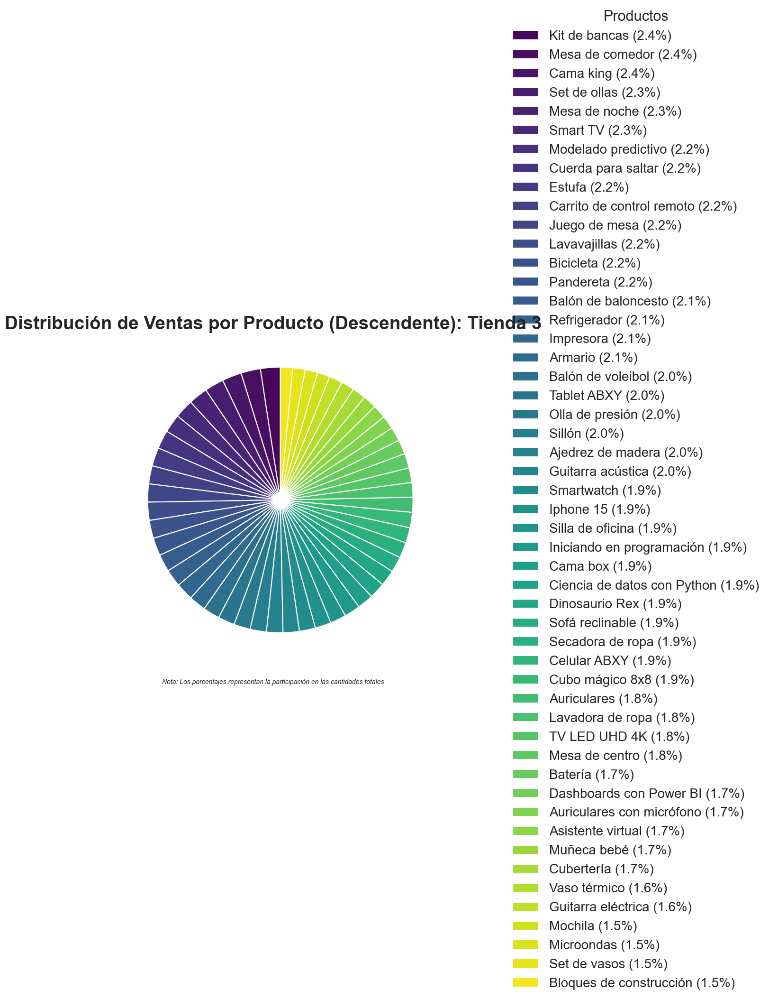

,Producto,Cantidad
10,Cama box,62
15,Cubertería,59
11,Cama king,56
18,Dashboards con Power BI,56
12,Carrito de control remoto,55
32,Mesa de noche,55
31,Mesa de comedor,55
9,Bloques de construcción,54
45,Smart TV,54
38,Pandereta,52


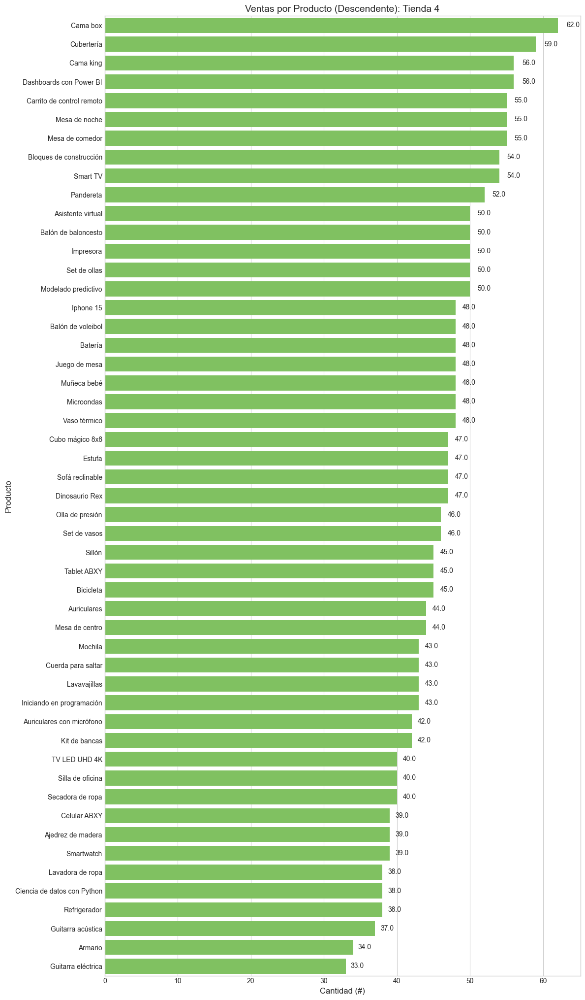

C:\Users\Gouther\AppData\Local\Temp\ipykernel_10720\2356897232.py:77: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


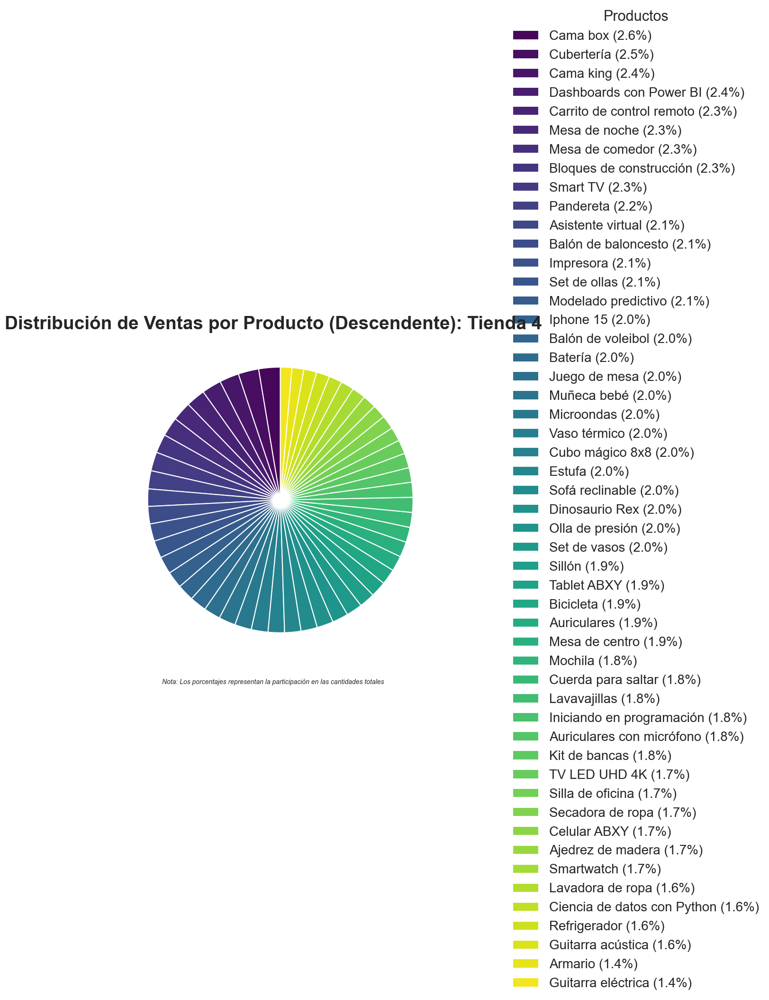

,Producto,Cantidad
4,Auriculares con micrófono,33
13,Celular ABXY,33
37,Olla de presión,35
38,Pandereta,36
14,Ciencia de datos con Python,39
34,Mochila,39
19,Dinosaurio Rex,40
2,Asistente virtual,40
36,Muñeca bebé,40
31,Mesa de comedor,40


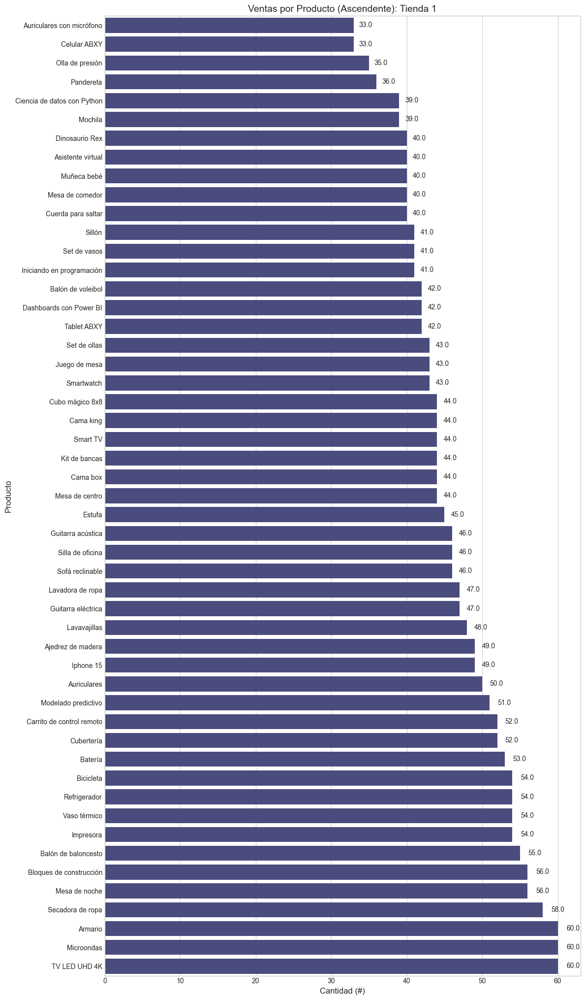

C:\Users\Gouther\AppData\Local\Temp\ipykernel_10720\2356897232.py:77: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


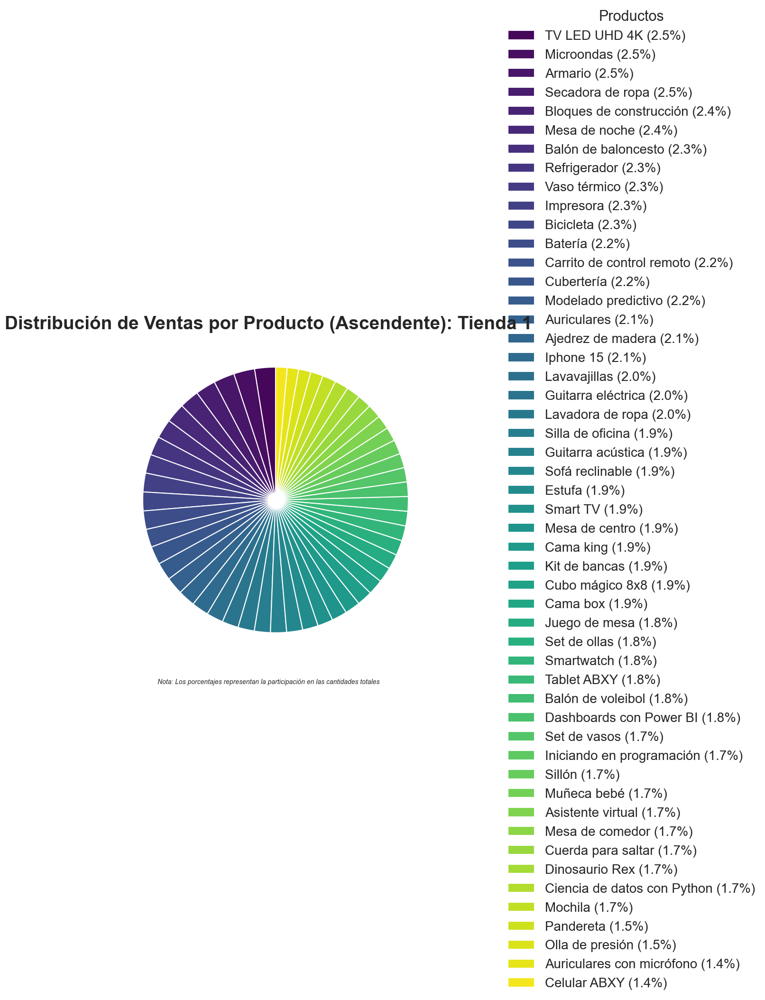

,Producto,Cantidad
26,Juego de mesa,32
23,Impresora,34
31,Mesa de comedor,34
44,Sillón,35
3,Auriculares,37
2,Asistente virtual,38
15,Cubertería,39
45,Smart TV,40
13,Celular ABXY,41
20,Estufa,42


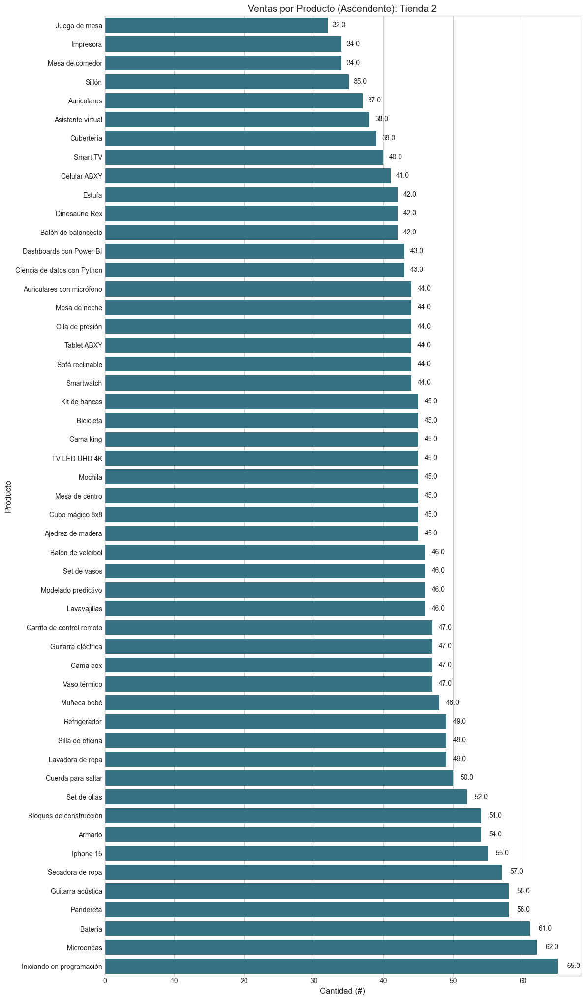

C:\Users\Gouther\AppData\Local\Temp\ipykernel_10720\2356897232.py:77: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


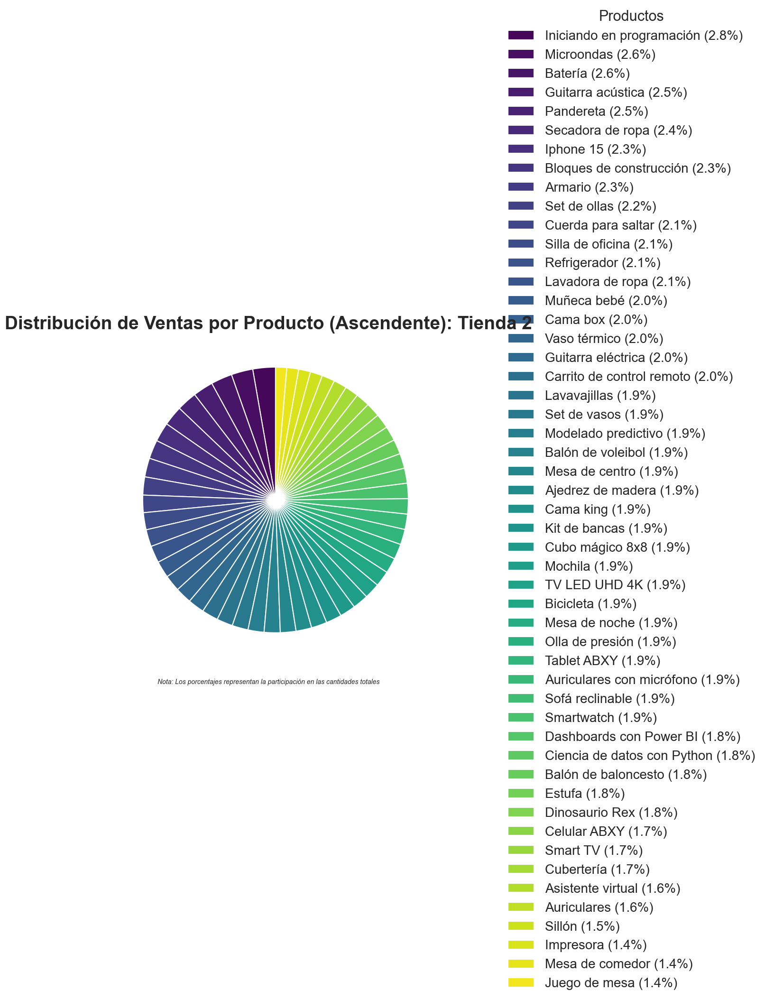

,Producto,Cantidad
9,Bloques de construcción,35
42,Set de vasos,36
34,Mochila,36
33,Microondas,36
50,Vaso térmico,38
22,Guitarra eléctrica,38
15,Cubertería,39
2,Asistente virtual,39
4,Auriculares con micrófono,39
36,Muñeca bebé,39


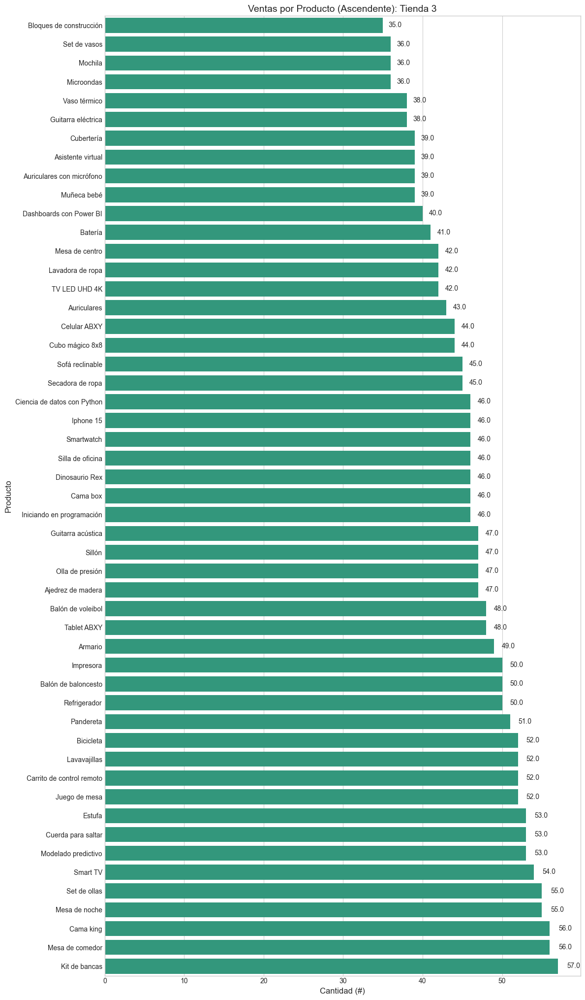

C:\Users\Gouther\AppData\Local\Temp\ipykernel_10720\2356897232.py:77: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


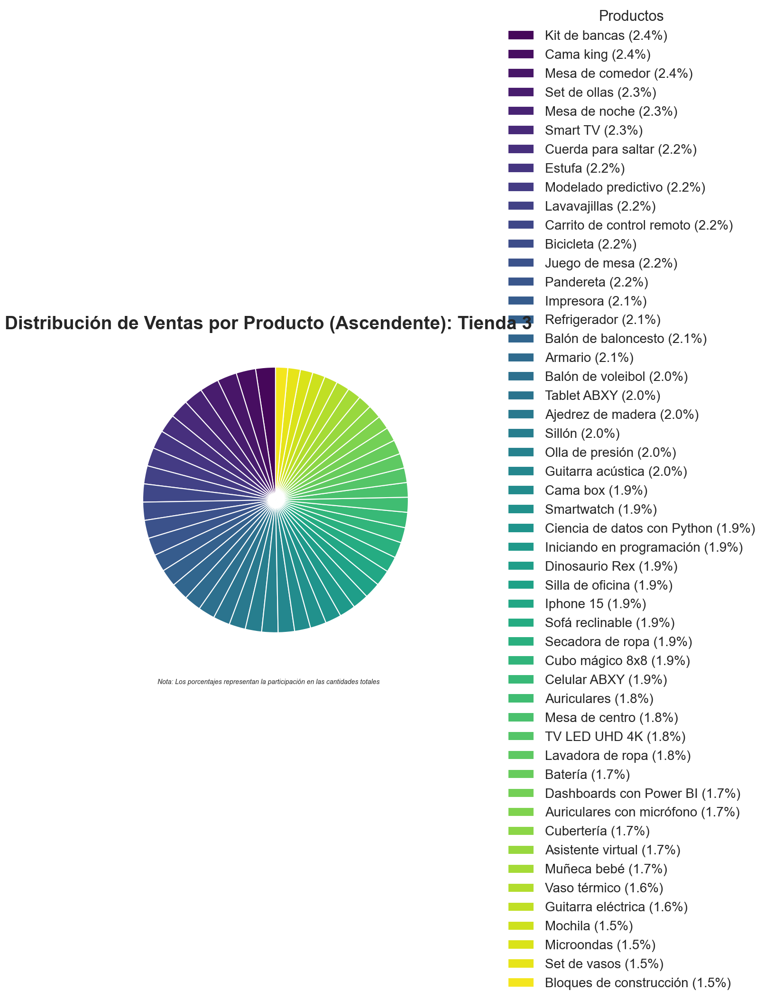

,Producto,Cantidad
22,Guitarra eléctrica,33
1,Armario,34
21,Guitarra acústica,37
14,Ciencia de datos con Python,38
28,Lavadora de ropa,38
39,Refrigerador,38
0,Ajedrez de madera,39
13,Celular ABXY,39
46,Smartwatch,39
40,Secadora de ropa,40


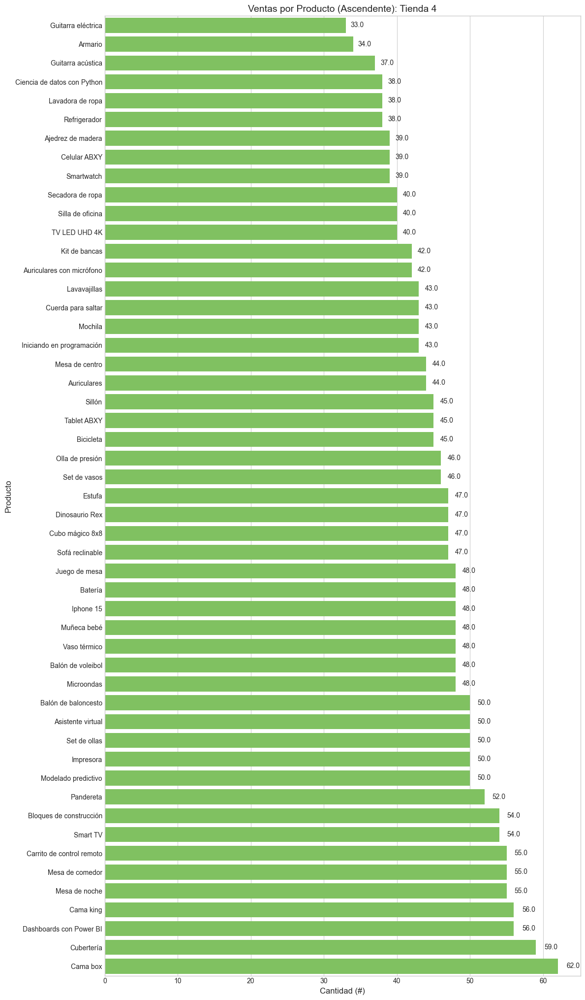

C:\Users\Gouther\AppData\Local\Temp\ipykernel_10720\2356897232.py:77: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


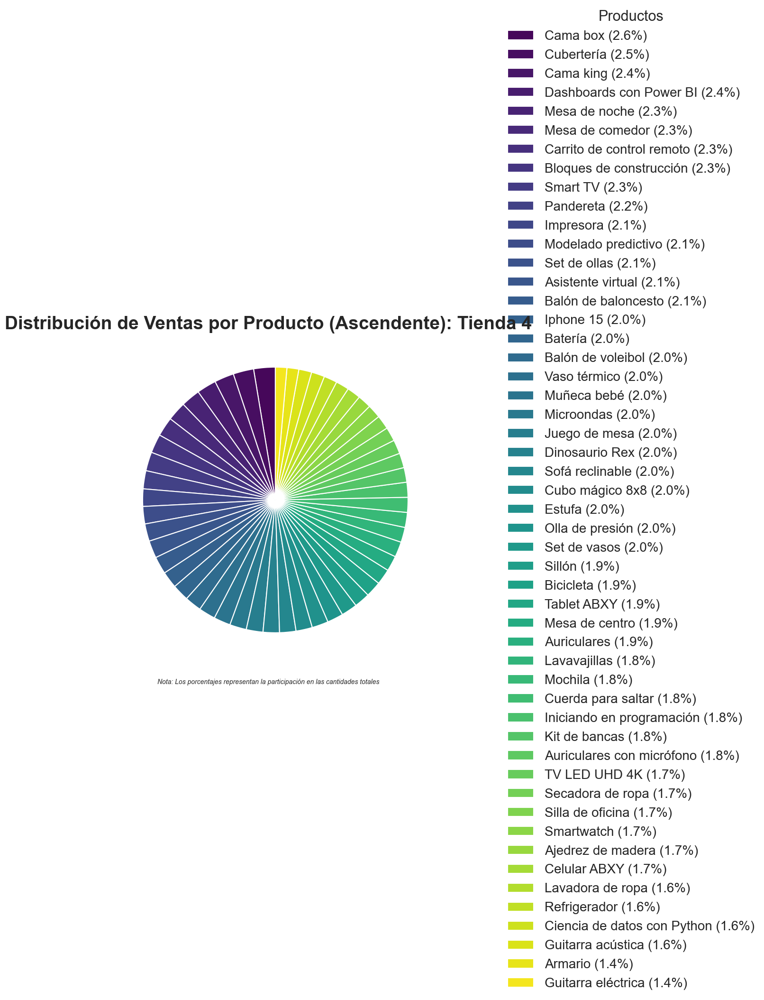

In [42]:
visualizar_ventas_por_producto(cantidad_ventas_productos_desendente,
                                   cantidad_ventas_productos_ascendente)

## 4.2. Visualizacion de datos mas y menos vendidos con todas las tiendas.

In [36]:
def visualizar_ventas_por_producto_global(tiendas: dict[str, pd.DataFrame]) -> None:
    """
    Visualiza los productos más vendidos y menos vendidos, ordenados por la suma total
    de ventas en todas las tiendas.
    
    Args:
        tiendas (dict): Diccionario con nombre de tienda y su DataFrame correspondiente
    """
    # Paso 1: Combinar todos los datos de productos de todas las tiendas
    productos_combinados = pd.DataFrame(columns=['Producto', 'Cantidad', 'Tienda'])
    
    for nombre, df in tiendas.items():
        # Agrupar por producto y contar las apariciones
        ventas_producto = df.groupby('Producto').size().reset_index(name='Cantidad')
        ventas_producto['Tienda'] = nombre
        productos_combinados = pd.concat([productos_combinados, ventas_producto])
    
    # Paso 2: Calcular el total por producto (sumando todas las tiendas)
    total_por_producto = productos_combinados.groupby('Producto')['Cantidad'].sum().reset_index()
    
    # Paso 3: Ordenar para obtener los más vendidos (descendente) y menos vendidos (ascendente)
    mas_vendidos = total_por_producto.sort_values(by='Cantidad', ascending=False)
    menos_vendidos = total_por_producto.sort_values(by='Cantidad', ascending=True)
    
    # Obtener datos por tienda para cada producto (para la tabla detallada)
    pivot_cantidades = productos_combinados.pivot_table(
        index='Producto', columns='Tienda', values='Cantidad', fill_value=0
    ).reset_index()
    
    # Añadir columna de total
    pivot_cantidades['Total'] = pivot_cantidades.sum(axis=1, numeric_only=True)
    
    # Paso 4: Crear visualizaciones para productos más vendidos
    display(HTML("<h2 style='color:#2C3E50; background:#ECF0F1; padding:10px; border-radius:5px;'>Productos Más Vendidos (Todas las Tiendas)</h2>"))
    
    # Tabla de más vendidos con detalle por tienda
    tabla_mas_vendidos = pivot_cantidades.merge(mas_vendidos[['Producto']], on='Producto')
    tabla_mas_vendidos = tabla_mas_vendidos.sort_values(by='Total', ascending=False).head(15)
    
    # Mostrar tabla estilizada
    styled_mas_vendidos = tabla_mas_vendidos.style\
        .set_table_attributes('class="table table-striped table-hover"')\
        .set_properties(**{'text-align': 'center'})\
        .format({col: '{:.0f}' for col in tabla_mas_vendidos.columns if col != 'Producto'})
    
    display(HTML("<h3>Top 15 Productos Más Vendidos por Total Global</h3>"))
    display(styled_mas_vendidos)
    
    # Gráfico de barras horizontal para los más vendidos
    plt.figure(figsize=(14, 8))
    top_productos = mas_vendidos.head(15)
    ax = sns.barplot(x='Cantidad', y='Producto', data=top_productos, orient='h')
    
    # Añadir valores a las barras
    for p in ax.patches:
        width = p.get_width()
        ax.text(width + width * 0.02, p.get_y() + p.get_height() / 2, 
               f'{int(width)}', ha='left', va='center')
    
    plt.title('15 Productos Más Vendidos (Todas las Tiendas)', fontsize=16)
    plt.xlabel('Cantidad Total Vendida', fontsize=14)
    plt.ylabel('Producto', fontsize=14)
    plt.tight_layout()
    plt.show()
    
    # Paso 5: Crear visualizaciones para productos menos vendidos
    display(HTML("<h2 style='color:#2C3E50; background:#ECF0F1; padding:10px; border-radius:5px;'>Productos Menos Vendidos (Todas las Tiendas)</h2>"))
    
    # Tabla de menos vendidos con detalle por tienda
    tabla_menos_vendidos = pivot_cantidades.merge(menos_vendidos[['Producto']], on='Producto')
    tabla_menos_vendidos = tabla_menos_vendidos.sort_values(by='Total', ascending=True).head(15)
    
    # Mostrar tabla estilizada
    styled_menos_vendidos = tabla_menos_vendidos.style\
        .set_table_attributes('class="table table-striped table-hover"')\
        .set_properties(**{'text-align': 'center'})\
        .format({col: '{:.0f}' for col in tabla_menos_vendidos.columns if col != 'Producto'})
    
    display(HTML("<h3>15 Productos Menos Vendidos por Total Global</h3>"))
    display(styled_menos_vendidos)
    
    # Gráfico de barras horizontal para los menos vendidos
    plt.figure(figsize=(14, 8))
    bottom_productos = menos_vendidos.head(15)
    ax = sns.barplot(x='Cantidad', y='Producto', data=bottom_productos, orient='h')
    
    # Añadir valores a las barras
    for p in ax.patches:
        width = p.get_width()
        ax.text(width + width * 0.02, p.get_y() + p.get_height() / 2, 
               f'{int(width)}', ha='left', va='center')
    
    plt.title('15 Productos Menos Vendidos (Todas las Tiendas)', fontsize=16)
    plt.xlabel('Cantidad Total Vendida', fontsize=14)
    plt.ylabel('Producto', fontsize=14)
    plt.tight_layout()
    plt.show()

    # Añadir análisis comparativo entre tiendas para los productos destacados
    display(HTML("<h2 style='color:#2C3E50; background:#ECF0F1; padding:10px; border-radius:5px;'>Análisis Comparativo por Tienda</h2>"))
    
    # Seleccionar los 5 productos más vendidos para análisis detallado
    top5_productos = mas_vendidos.head(5)['Producto'].tolist()
    
    # Filtrar productos combinados para incluir solo los top 5
    top5_data = productos_combinados[productos_combinados['Producto'].isin(top5_productos)]
    
    # Gráfico de barras agrupadas para ver la distribución por tienda
    plt.figure(figsize=(14, 8))
    sns.barplot(x='Producto', y='Cantidad', hue='Tienda', data=top5_data)
    plt.title('Distribución de los 5 Productos Más Vendidos por Tienda', fontsize=16)
    plt.xlabel('Producto', fontsize=14)
    plt.ylabel('Cantidad Vendida', fontsize=14)
    plt.xticks(rotation=45, ha='right')
    plt.legend(title='Tienda', loc='upper right')
    plt.tight_layout()
    plt.show()
    
    # Lo mismo para los 5 menos vendidos
    bottom5_productos = menos_vendidos.head(5)['Producto'].tolist()
    bottom5_data = productos_combinados[productos_combinados['Producto'].isin(bottom5_productos)]
    
    plt.figure(figsize=(14, 8))
    sns.barplot(x='Producto', y='Cantidad', hue='Tienda', data=bottom5_data)
    plt.title('Distribución de los 5 Productos Menos Vendidos por Tienda', fontsize=16)
    plt.xlabel('Producto', fontsize=14)
    plt.ylabel('Cantidad Vendida', fontsize=14)
    plt.xticks(rotation=45, ha='right')
    plt.legend(title='Tienda', loc='upper right')
    plt.tight_layout()
    plt.show()

C:\Users\Gouther\AppData\Local\Temp\ipykernel_10720\895925709.py:26: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  pivot_cantidades = productos_combinados.pivot_table(


,Producto,Tienda 1,Tienda 2,Tienda 3,Tienda 4,Total
32,Mesa de noche,56,44,55,55,210
33,Microondas,60,62,36,48,206
12,Carrito de control remoto,52,47,52,55,206
7,Batería,53,61,41,48,203
11,Cama king,44,45,56,56,201
35,Modelado predictivo,51,46,53,50,200
40,Secadora de ropa,58,57,45,40,200
41,Set de ollas,43,52,55,50,200
10,Cama box,44,47,46,62,199
9,Bloques de construcción,56,54,35,54,199


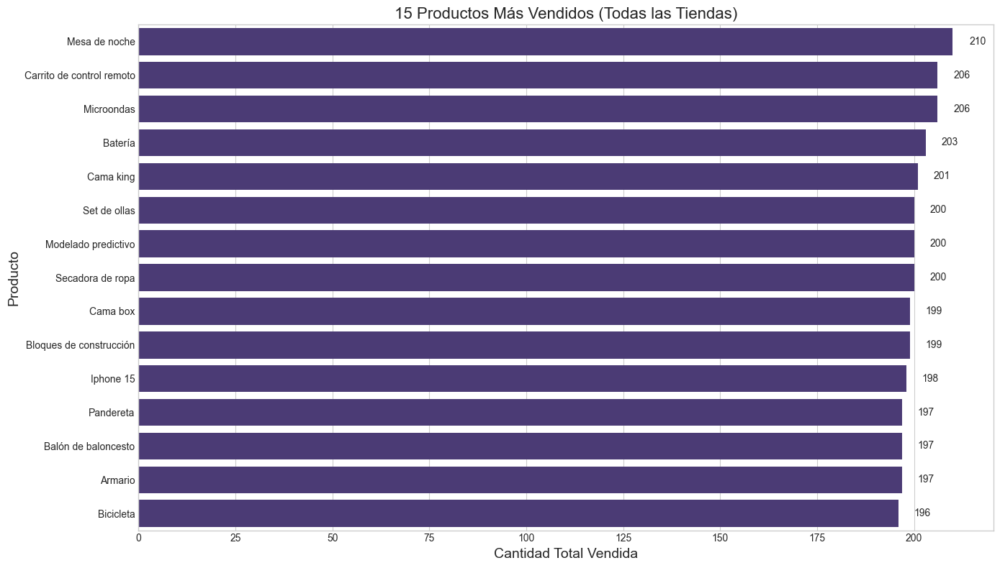

,Producto,Tienda 1,Tienda 2,Tienda 3,Tienda 4,Total
13,Celular ABXY,33,41,44,39,157
4,Auriculares con micrófono,33,44,39,42,158
34,Mochila,39,45,36,43,163
22,Guitarra eléctrica,47,47,38,33,165
14,Ciencia de datos con Python,39,43,46,38,166
2,Asistente virtual,40,38,39,50,167
44,Sillón,41,35,47,45,168
42,Set de vasos,41,46,36,46,169
37,Olla de presión,35,44,47,46,172
46,Smartwatch,43,44,46,39,172


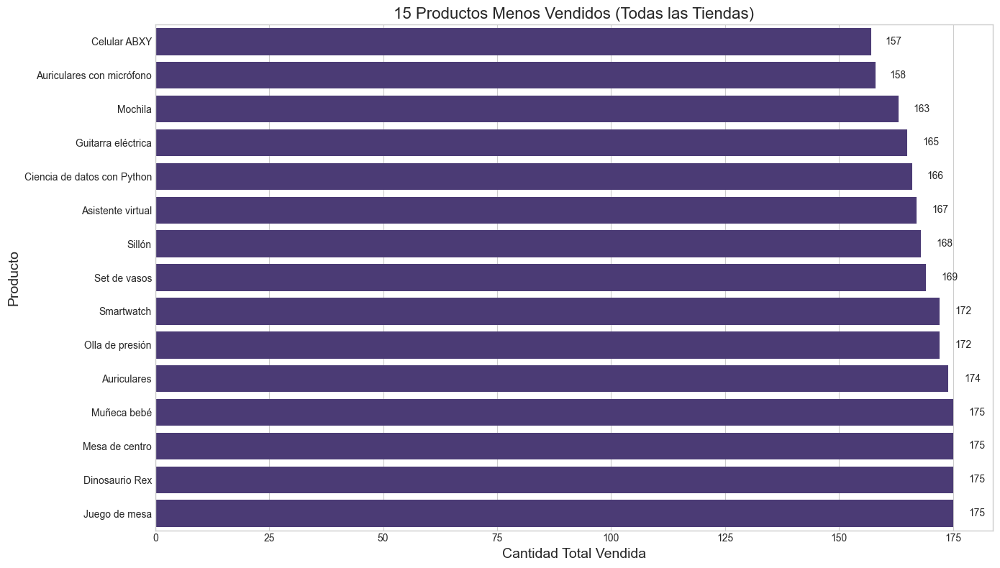

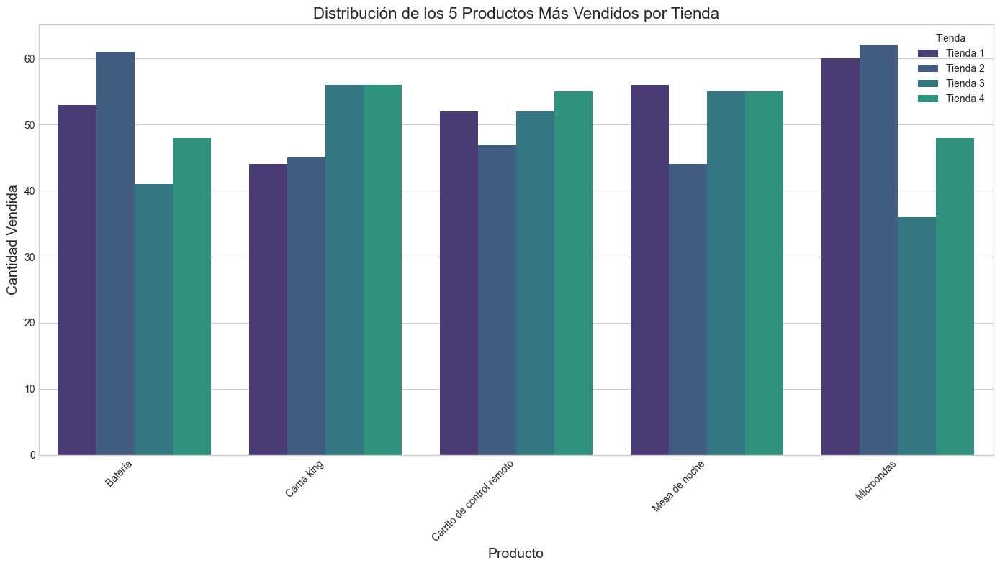

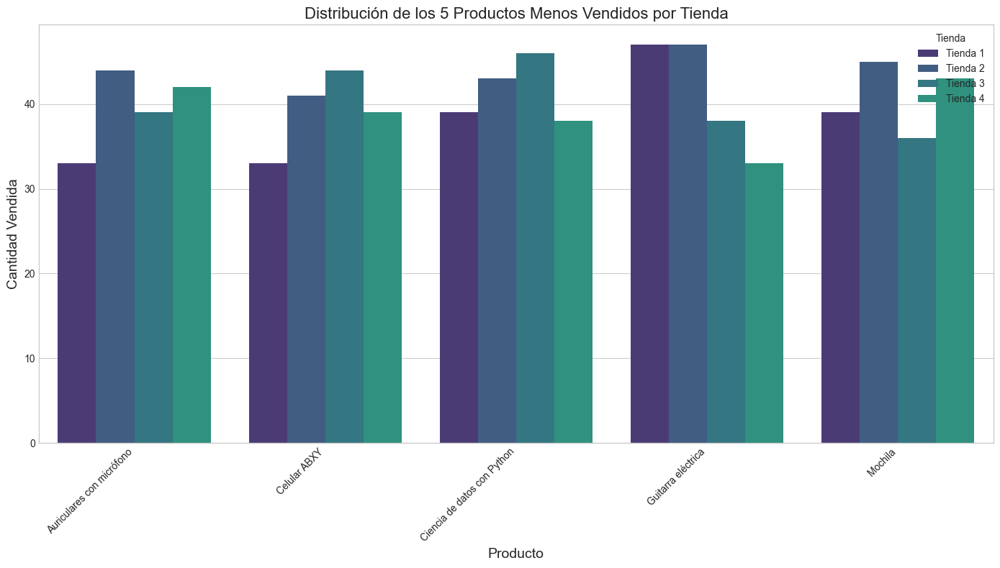

In [38]:
visualizar_ventas_por_producto_global(tiendas)

El análisis de los patrones de venta de productos revela información estratégica crucial para la optimización del inventario y las decisiones comerciales. La Mesa de noche emerge como el producto más vendido con 210 unidades en total, seguida muy de cerca por los Microondas y los Carritos de control remoto, ambos con 206 unidades. Esta preferencia por artículos para el hogar refleja una tendencia de consumo orientada a la funcionalidad doméstica.

Es particularmente notable la consistencia en las ventas de los productos líderes. La diferencia entre el primero (Mesa de noche, 210) y el decimoquinto (Bicicleta, 196) es de apenas 14 unidades, lo que indica una demanda bastante equilibrada entre los productos más populares. Esta estabilidad sugiere que estos artículos han alcanzado una posición consolidada en las preferencias de los consumidores.
En contraste, el Celular ABXY se posiciona como el producto menos vendido con 157 unidades, seguido por Auriculares con micrófono (158) y Mochila (163). La brecha entre el producto menos vendido y el más vendido es de 53 unidades, lo que representa aproximadamente un 25% menos de ventas. Este dato es significativo pero no alarmante, indicando que incluso los productos de menor desempeño mantienen un nivel de venta respetable.

El análisis comparativo por tienda muestra patrones interesantes. La Tienda 2 destaca en la venta de Baterías (61 unidades) y Microondas (62), mientras que la Tienda 4 sobresale en ventas de Cama box (62) y Cama king (56). La Tienda 1, a pesar de ser líder en facturación total, no domina consistentemente en la venta de ningún producto específico, lo que refuerza la hipótesis de que su éxito financiero podría estar más relacionado con el volumen general de ventas y posiblemente con productos de mayor margen.

Es revelador observar que incluso en los productos menos vendidos existe una distribución desigual entre tiendas. Por ejemplo, la Tienda 3 presenta mejor desempeño en la venta de Celular ABXY (44) mientras que la Tienda 1 muestra debilidad en este rubro (33). Similarmente, la Tienda 4 destaca en ventas de Asistente virtual (50) mientras que la Tienda 2 registra su punto más bajo en este producto (38).

Estos hallazgos ofrecen oportunidades concretas para implementar estrategias cruzadas de mejora. Por ejemplo, la Tienda 1 podría adoptar las técnicas de merchandising y promoción que utiliza la Tienda 3 para los dispositivos electrónicos, mientras que la Tienda 3 podría aprender de las estrategias de la Tienda 2 para productos de hogar. Además, sería aconsejable revisar la ubicación, presentación y estrategia de precios de los productos menos vendidos, especialmente en aquellas tiendas donde su desempeño es particularmente bajo.
El potencial de crecimiento es evidente si se logra que cada tienda alcance al menos el rendimiento promedio en sus categorías de menor desempeño, lo que podría traducirse en un incremento significativo en las ventas totales sin necesidad de introducir nuevos productos al inventario.

# 5. Envío promedio por tienda

In [ ]:
# Funcion para calcular el promedio de envios por tienda
def calcular_promedio_envios(tiendas: dict[str, pd.DataFrame]) -> dict[str, float]:
    """
    Calcula el promedio de envíos por tienda.
    
    Args:
        tiendas (dict): Diccionario con nombre de tienda y su DataFrame correspondiente
        
    Returns:
        dict: Diccionario con nombres de tiendas y su promedio de envíos
    """
    promedios = {}
    
    for nombre, df in tiendas.items():
        if 'Costo de envío' in df.columns:
            promedio = round(df['Costo de envío'].sum() / df['Costo de envío'].count(), 2)
            logger.info(f"[{nombre}] costo medio de envío: ${promedio:.2f}")
            promedios[nombre] = promedio
        else:
            logger.warning(f"[{nombre}] No se encontró la columna 'Costo de envío'")
    
    return promedios

In [46]:
calcular_promedio_envios_tiendas = calcular_promedio_envios(tiendas)
calcular_promedio_envios_tiendas

[Tienda 1] Promedio de envíos: $26018.61
[Tienda 2] Promedio de envíos: $25216.24
[Tienda 3] Promedio de envíos: $24805.68
[Tienda 4] Promedio de envíos: $23459.46


{'Tienda 1': np.float64(26018.61),
 'Tienda 2': np.float64(25216.24),
 'Tienda 3': np.float64(24805.68),
 'Tienda 4': np.float64(23459.46)}

## 5.1. Visualizacion de Costo de envio desde cada tienda  hasta sus clientes

In [47]:
# Calcular estimacion de envio por tienda, agrupar cuales son los envios menos costosos por ubicacion y concluir la ubicación más económica de dicha tienda y los mas costosos para asumir los mas lejando que se envia, este analisis se hace con la finalidad de medir las distancias, en dicho analicis no se toma en cuenta los productos costosos, ya que se asume que el costo de envio es el mismo para todos los productos, por lo tanto se toma en cuenta la cantidad de envios y el costo de envio por tienda, para concluir la ubicacion mas economica y la mas costosa.
def calcular_estimacion_envio(tiendas: dict[str, pd.DataFrame]) -> dict[str, pd.DataFrame]:
    """
    Calcula la estimación de envío por tienda, agrupando los envíos por ubicación
    y determinando la ubicación más económica y la más costosa.
    
    Args:
        tiendas (dict): Diccionario con nombre de tienda y su DataFrame correspondiente
        
    Returns:
        dict: Diccionario con nombres de tiendas y DataFrames de estimación de envío
    """
    resultados = {}
    
    for nombre, df in tiendas.items():
        if 'Costo de envío' in df.columns and 'Lugar de Compra' in df.columns:
            # Agrupar por ubicación y calcular el costo promedio de envío
            estimacion_envio = df.groupby('Lugar de Compra')['Costo de envío'].agg(['mean', 'count']).reset_index()
            estimacion_envio = estimacion_envio.rename(columns={'mean': 'Costo Promedio', 'count': 'Cantidad Envíos'})
            
            # Ordenar por costo promedio
            estimacion_envio = estimacion_envio.sort_values(by='Costo Promedio')
            
            # Guardar resultado en el diccionario
            resultados[nombre] = estimacion_envio
            
            logger.info(f"[{nombre}] Estimación de envío calculada con {len(estimacion_envio)} ubicaciones")
        else:
            logger.warning(f"[{nombre}] No se encontraron las columnas 'Costo de envío' o 'Ubicación'")
    
    return resultados

In [48]:
calcular_estimacion_envio_tiendas = calcular_estimacion_envio(tiendas)
calcular_estimacion_envio_tiendas

[Tienda 1] Estimación de envío calculada con 19 ubicaciones
[Tienda 2] Estimación de envío calculada con 19 ubicaciones
[Tienda 3] Estimación de envío calculada con 19 ubicaciones
[Tienda 4] Estimación de envío calculada con 19 ubicaciones


{'Tienda 1':    Lugar de Compra  Costo Promedio  Cantidad Envíos
 0          Armenia    17314.285714               14
 17      Valledupar    18766.666667                3
 13         Pereira    22403.759398              133
 15     Santa Marta    22593.750000               32
 5        Cartagena    22624.528302               53
 1     Barranquilla    23708.000000               75
 2           Bogotá    23815.853659              984
 14        Riohacha    24357.500000               40
 8          Leticia    24450.000000               32
 10        Medellín    28207.104796              563
 7          Inírida    28460.000000                5
 4             Cali    28827.561837              283
 9        Manizales    29140.000000               15
 3      Bucaramanga    30587.096774               31
 11           Neiva    31516.666667                6
 18   Villavicencio    34709.090909               11
 12           Pasto    35078.260870               23
 6           Cúcuta    40129.41176

In [67]:
def visualizar_estimacion_envio(resultados: dict[str, pd.DataFrame]) -> None:
    """
    Visualiza la estimación de envío por tienda con gráficos mejorados y análisis comparativo.
    
    Args:
        resultados (dict): Diccionario con nombres de tiendas y DataFrames de estimación de envío
    """
    if not resultados:
        logger.warning("No hay datos de estimación de envío para visualizar.")
        return
    
    # Crear un DataFrame combinado para análisis comparativo
    df_combinado = pd.DataFrame()
    
    # PARTE 1: Visualización individual por tienda
    for nombre, df in resultados.items():
        display(HTML(f"<h2 style='color:#2C3E50; background:#ECF0F1; padding:10px; border-radius:5px;'>Estimación de Envío: {nombre}</h2>"))
        
        # Mostrar tabla HTML con valores formateados
        styled_df = df.style.set_table_attributes('class="table table-striped table-hover"')\
                            .set_properties(**{'text-align': 'center'})\
                            .format({'Costo Promedio': '${:.2f}', 'Cantidad Envíos': '{:,}'})
        
        display(styled_df)
        
        # Crear una figura con dos gráficos: gráfico de burbujas y boxplot
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 8), gridspec_kw={'width_ratios': [2, 1]})
        
        # 1. Gráfico de burbujas: muestra relación entre ubicación, costo y cantidad de envíos
        # Ordenar datos para mejor visualización
        df_sorted = df.sort_values(by='Costo Promedio', ascending=True)
        
        # Normalizar tamaños para las burbujas (para evitar burbujas demasiado grandes o pequeñas)
        sizes = df_sorted['Cantidad Envíos'] / df_sorted['Cantidad Envíos'].max() * 1000 + 100
        
        # Crear gráfico de burbujas
        scatter = ax1.scatter(
            range(len(df_sorted)),  # Posiciones X equidistantes
            df_sorted['Costo Promedio'],  # Valores Y = Costos
            s=sizes,  # Tamaño basado en cantidad de envíos
            c=df_sorted['Costo Promedio'],  # Color basado en costo
            cmap='viridis',  # Esquema de color
            alpha=0.7,  # Semi-transparencia
            edgecolors='white'  # Borde blanco para mejor visualización
        )
        
        # Configurar etiquetas del eje X (ubicaciones)
        ax1.set_xticks(range(len(df_sorted)))
        ax1.set_xticklabels(df_sorted['Lugar de Compra'], rotation=45, ha='right')
        
        # Añadir título y etiquetas
        ax1.set_title(f'Relación Costo-Volumen de Envíos: {nombre}', fontsize=14)
        ax1.set_ylabel('Costo Promedio ($)', fontsize=12)
        ax1.set_xlabel('Lugar de Compra', fontsize=12)
        ax1.grid(True, linestyle='--', alpha=0.7)
        
        # Añadir leyenda para tamaños de burbujas
        kw = dict(prop="sizes", num=3, fmt="{x:.0f}", func=lambda s: (s-100)*df_sorted['Cantidad Envíos'].max()/1000)
        legend = ax1.legend(*scatter.legend_elements(**kw), 
                           loc="upper right", title="Cantidad de Envíos")
        
        # 2. Diagrama de caja y bigotes (boxplot) para mostrar distribución de costos
        ax2.boxplot(df['Costo Promedio'], vert=True, patch_artist=True, 
                  boxprops=dict(facecolor='lightblue'))
        ax2.set_title(f'Distribución de Costos: {nombre}', fontsize=14)
        ax2.set_ylabel('Costo Promedio ($)', fontsize=12)
        ax2.grid(True, linestyle='--', alpha=0.7)
        
        # Añadir estadísticas en el gráfico de caja
        stats = {
            'Mínimo': df['Costo Promedio'].min(),
            'Máximo': df['Costo Promedio'].max(),
            'Promedio': df['Costo Promedio'].mean(),
            'Mediana': df['Costo Promedio'].median()
        }
        
        y_pos = 0.95
        for stat, value in stats.items():
            ax2.text(1.2, y_pos, f"{stat}: ${value:.2f}", 
                   transform=ax2.transAxes, ha='center', va='center',
                   bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
            y_pos -= 0.1
        
        plt.tight_layout()
        plt.show()
        
        # Añadir los datos al DataFrame combinado para comparación posterior
        temp_df = df.copy()
        temp_df['Tienda'] = nombre
        df_combinado = pd.concat([df_combinado, temp_df])
    
    # PARTE 2: ANÁLISIS COMPARATIVO ENTRE TIENDAS
    if len(resultados) > 1:
        display(HTML("<h2 style='color:#2C3E50; background:#ECF0F1; padding:10px; border-radius:5px;'>Análisis Comparativo Entre Tiendas</h2>"))

        # Crear tabla de resumen personalizada con los datos solicitados
        tabla_resumen = []
        
        # Acceder a los datos originales para obtener información sobre envíos individuales
        for nombre, df_tienda in tiendas.items():
            if 'Costo de envío' in df_tienda.columns and 'Lugar de Compra' in df_tienda.columns:
                # Calcular el promedio global de envíos (valor correcto)
                promedio_global = df_tienda['Costo de envío'].mean()
                
                # Obtener costo máximo 
                costo_max_individual = df_tienda['Costo de envío'].max()
                
                # Total de envíos de la tienda
                total_envios = len(df_tienda)
                
                # Datos agrupados por ubicación
                df_grupo = df_combinado[df_combinado['Tienda'] == nombre]
                
                # Costo promedio máximo y mínimo por ubicación
                costo_promedio_max = df_grupo['Costo Promedio'].max()
                costo_promedio_min = df_grupo['Costo Promedio'].min()
                
                # Cantidad máxima y mínima de envíos a una ubicación
                cantidad_max = df_grupo['Cantidad Envíos'].max()
                cantidad_min = df_grupo['Cantidad Envíos'].min()
                
                # Añadir a la tabla de resumen
                tabla_resumen.append({
                    'Tienda': nombre,
                    'Promedio Costo Envío': promedio_global,
                    'Costo Envío Máx': costo_max_individual,
                    'Total Envíos': total_envios,
                    'Envío Máx': costo_promedio_max,
                    'Envío Mín': costo_promedio_min,
                    'Cantidad Envíos Máx': cantidad_max,
                    'Cantidad Envíos Mín': cantidad_min
                })
        
        # Convertir a DataFrame
        df_resumen = pd.DataFrame(tabla_resumen)
        
        # Mostrar tabla de resumen comparativo
        display(HTML("<h3>Tabla Comparativa Completa - Estadísticas de Envío por Tienda</h3>"))
        
        # Aplicar estilo y formato a la tabla
        styled_resumen = df_resumen.style\
            .set_table_attributes('class="table table-striped table-hover"')\
            .set_properties(**{'text-align': 'center'})\
            .format({
                'Promedio Costo Envío': '${:.2f}',
                'Costo Envío Máx': '${:.2f}',
                'Costo Envío Mín': '${:.2f}',
                'Total Envíos': '{:,}',
                'Envío Promedio Máx': '${:.2f}',
                'Envío Promedio Mín': '${:.2f}',
                'Cantidad Envíos Máx': '{:,}',
                'Cantidad Envíos Mín': '{:,}'
            })
        
        display(styled_resumen)
        
        # Continuar con los gráficos comparativos...
        
        # 1. Boxplot comparativo de costos entre tiendas
        plt.figure(figsize=(14, 8))
        
        # Crear datos para el boxplot agrupado por tienda
        data_to_plot = [df_combinado[df_combinado['Tienda'] == tienda]['Costo Promedio'] 
                      for tienda in df_combinado['Tienda'].unique()]
        
        box = plt.boxplot(data_to_plot, patch_artist=True, 
                        labels=df_combinado['Tienda'].unique())
        
        # Colorear cajas
        colors = plt.cm.viridis(np.linspace(0, 1, len(data_to_plot)))
        for patch, color in zip(box['boxes'], colors):
            patch.set(facecolor=color)
        
        plt.title('Comparación de Distribución de Costos de Envío Entre Tiendas', fontsize=16)
        plt.ylabel('Costo Promedio de Envío ($)', fontsize=14)
        plt.xlabel('Tienda', fontsize=14)
        plt.grid(True, linestyle='--', alpha=0.7)
        plt.tight_layout()
        plt.show()
        
        # 2. Mapa de calor comparativo de costos por ubicación entre tiendas
        # Obtener las ubicaciones y tiendas para el heatmap
        pivot_costos = df_combinado.pivot_table(
            index='Lugar de Compra', columns='Tienda', values='Costo Promedio'
        )
        
        plt.figure(figsize=(16, 12))
        sns.heatmap(pivot_costos, annot=True, fmt='.2f', cmap='YlGnBu', 
                   linewidths=0.5, cbar_kws={'label': 'Costo Promedio ($)'})
        plt.title('Mapa de Calor: Costos de Envío por Ubicación y Tienda', fontsize=16)
        plt.tight_layout()
        plt.show()
        
        # 3. Gráfico de barras para costo promedio por tienda
        plt.figure(figsize=(12, 6))
        bars = sns.barplot(x='Tienda', y='Promedio Costo Envío', data=df_resumen)
        
        # Añadir etiquetas de valor sobre las barras
        for bar in bars.patches:
            bars.annotate(f'${bar.get_height():.2f}',
                        (bar.get_x() + bar.get_width() / 2, bar.get_height()),
                        ha='center', va='bottom', fontsize=12)
            
        plt.title('Costo Promedio de Envío por Tienda', fontsize=16)
        plt.ylabel('Costo Promedio ($)', fontsize=14)
        plt.xlabel('Tienda', fontsize=14)
        plt.grid(axis='y', linestyle='--', alpha=0.7)
        plt.tight_layout()
        plt.show()

,Lugar de Compra,Costo Promedio,Cantidad Envíos
0,Armenia,$17314.29,14
17,Valledupar,$18766.67,3
13,Pereira,$22403.76,133
15,Santa Marta,$22593.75,32
5,Cartagena,$22624.53,53
1,Barranquilla,$23708.00,75
2,Bogotá,$23815.85,984
14,Riohacha,$24357.50,40
8,Leticia,$24450.00,32
10,Medellín,$28207.10,563


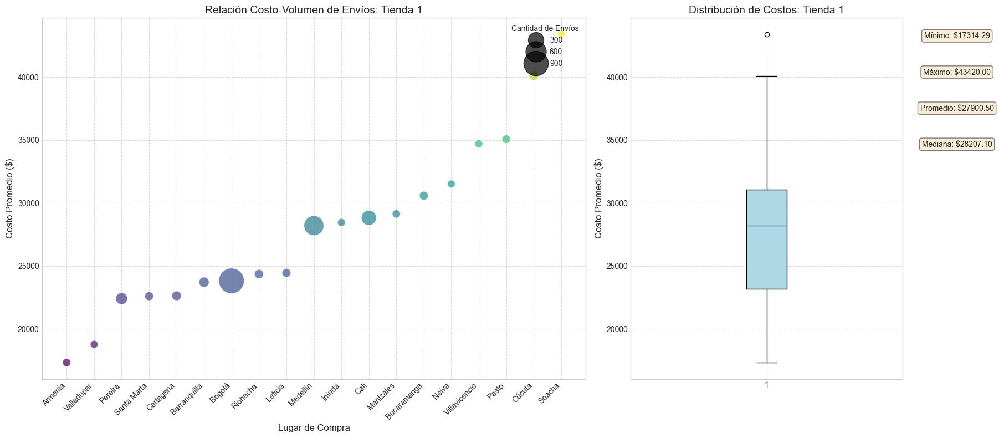

,Lugar de Compra,Costo Promedio,Cantidad Envíos
9,Manizales,$13476.92,13
17,Valledupar,$14050.00,4
5,Cartagena,$16181.43,70
13,Pereira,$17808.59,128
15,Santa Marta,$18627.50,40
1,Barranquilla,$18660.26,78
14,Riohacha,$19042.86,35
8,Leticia,$25329.41,34
3,Bucaramanga,$25796.00,50
2,Bogotá,$25997.06,985


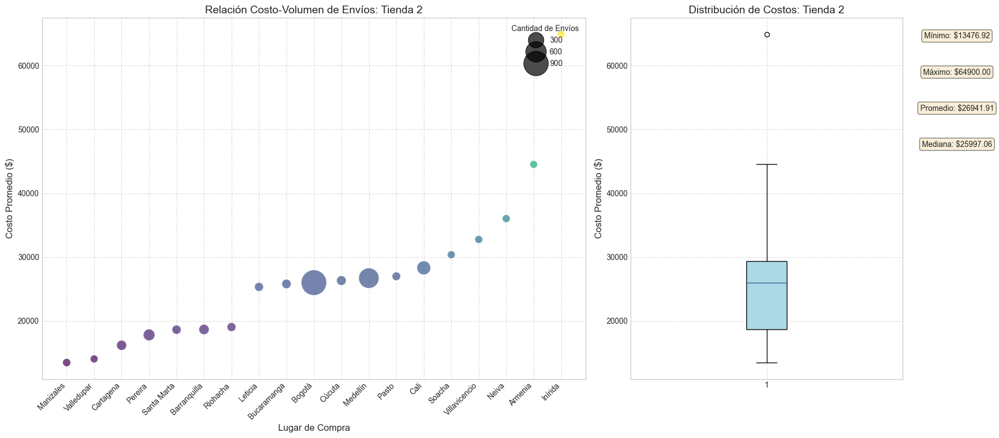

,Lugar de Compra,Costo Promedio,Cantidad Envíos
18,Villavicencio,$11820.00,5
15,Santa Marta,$15043.18,44
7,Inírida,$18825.00,4
11,Neiva,$22430.00,10
12,Pasto,$22531.25,16
10,Medellín,$23003.45,580
14,Riohacha,$23118.18,44
4,Cali,$23449.19,248
16,Soacha,$23833.33,6
3,Bucaramanga,$24810.00,50


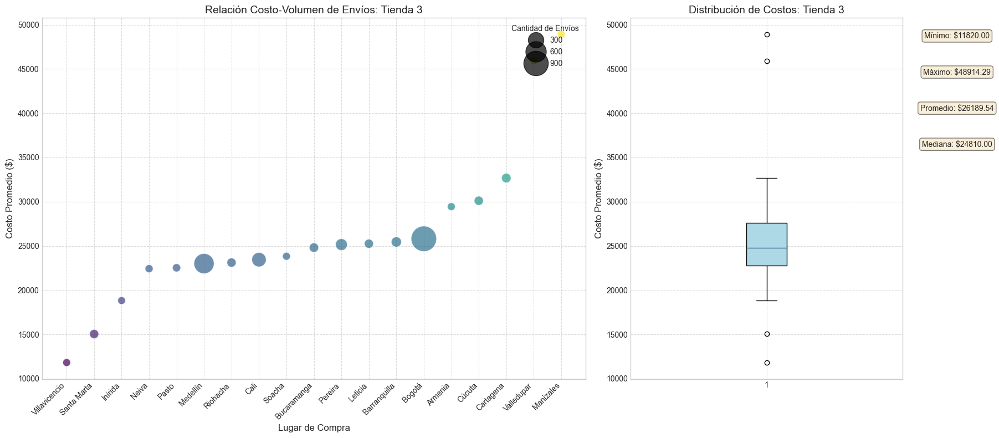

,Lugar de Compra,Costo Promedio,Cantidad Envíos
0,Armenia,$4566.67,3
9,Manizales,$11366.67,6
6,Cúcuta,$12331.25,32
18,Villavicencio,$12914.29,7
17,Valledupar,$14500.00,4
15,Santa Marta,$20045.71,35
5,Cartagena,$20907.94,63
2,Bogotá,$22519.78,991
1,Barranquilla,$23016.25,80
10,Medellín,$23256.67,577


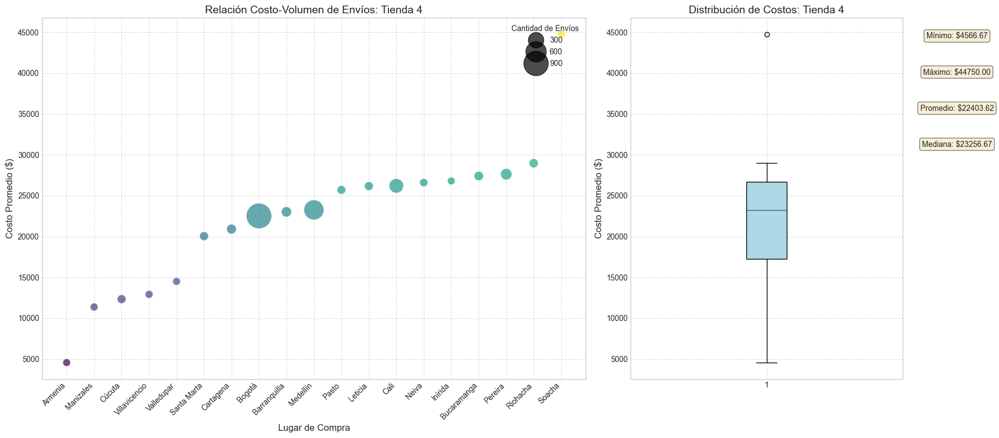

,Tienda,Promedio Costo Envío,Costo Envío Máx,Total Envíos,Envío Máx,Envío Mín,Cantidad Envíos Máx,Cantidad Envíos Mín
0,Tienda 1,$26018.61,$160800.00,"2,359",43420.000000,17314.285714,984,3
1,Tienda 2,$25216.24,$162500.00,"2,359",64900.000000,13476.923077,985,2
2,Tienda 3,$24805.68,$158400.00,"2,359",48914.285714,11820.000000,983,3
3,Tienda 4,$23459.46,$154700.00,"2,358",44750.000000,4566.666667,991,3


C:\Users\Gouther\AppData\Local\Temp\ipykernel_10720\3961124759.py:166: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  box = plt.boxplot(data_to_plot, patch_artist=True,


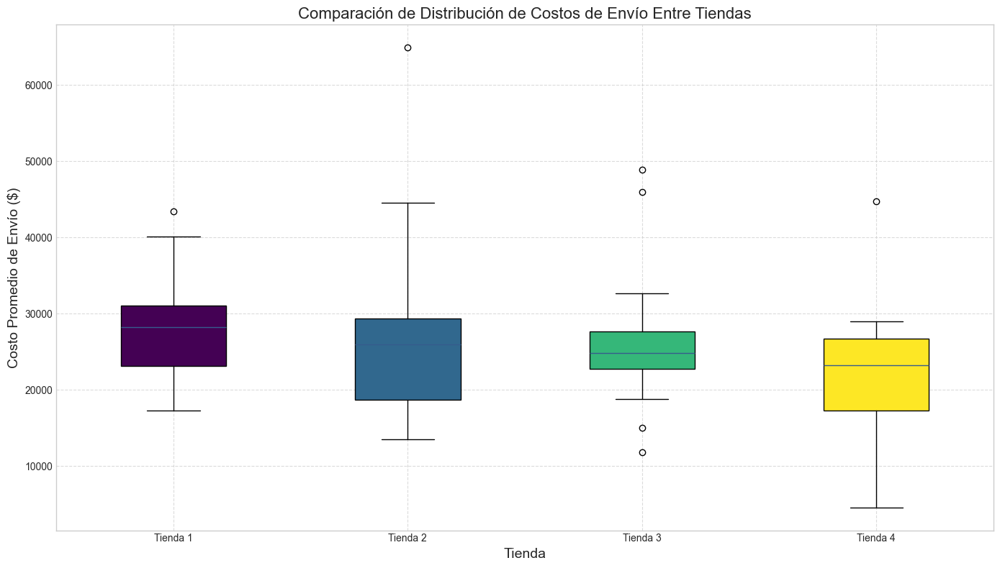

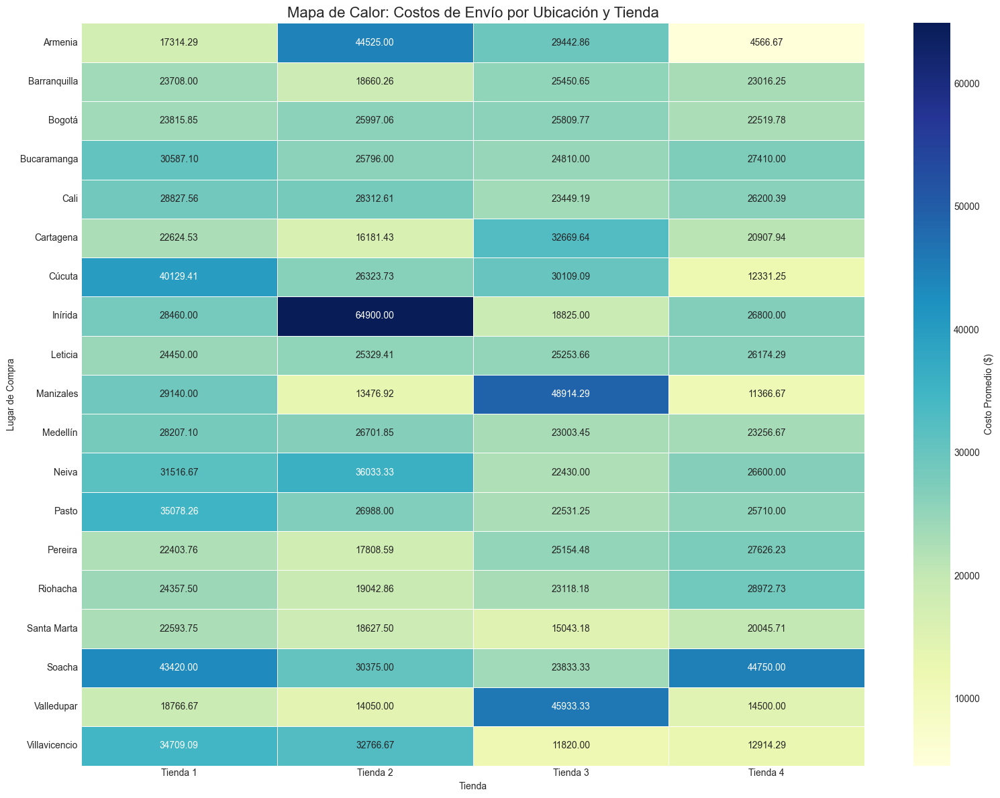

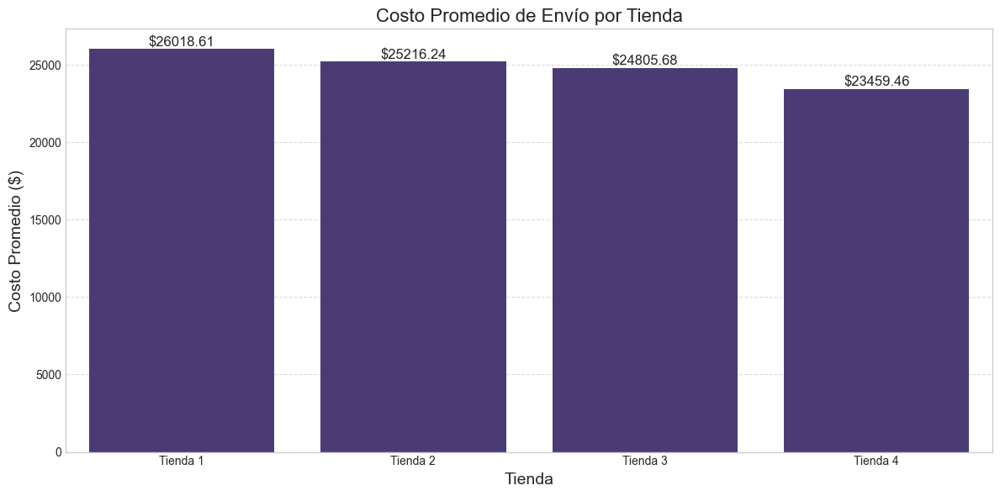

<function __main__.visualizar_estimacion_envio(resultados: dict[str, pandas.core.frame.DataFrame]) -> None>

In [68]:
visualizar_estimacion_envio(calcular_estimacion_envio_tiendas)
visualizar_estimacion_envio


El análisis de los costos de envío promedio por tienda revela un panorama interesante que complementa los datos de volumen previamente observados. La Tienda 4 se posiciona como la más económica, con un promedio de $23 459 por envío, representando aproximadamente el 23.7 % del total de costos promedios relativos en comparación con las otras tres tiendas. Por su parte, la Tienda 1 exhibe el promedio más alto, de $26 019 (≈ 26.2 % de la “torta” de costos promedio), mientras que la Tienda 2 y la Tienda 3 quedan en $25 216 (≈ 25.4 %) y $24 806 (≈ 24.7 %) respectivamente.

Lo más revelador es que existe una relación inversa aparente entre el costo promedio general y la estabilidad en las tarifas. Aunque la Tienda 1 lidera la facturación de envíos (2 359 envíos), presenta el costo promedio más alto ($26 019) y muestra una dispersión de rangos bastante amplia, con envíos en ciudades remotas (Como Cúcuta y Soacha) que elevan notablemente sus outliers. En contraste, la Tienda 3, que también procesa 2 359 envíos, tiene un promedio intermedio ($24 806) y el rango intercuartílico más estrecho en el boxplot, lo que indica menor variabilidad y mayor predictibilidad. La Tienda 2 (2 359 envíos, $25 216 promedio) combina tarifas bajas en ciudades medianas (por ejemplo, Manizales y Valledupar) pero registra outliers altos en destinos muy apartados (Inírida: $64 900 en 2 envíos), inflando su máximo.

Por su parte, la Tienda 4, con 2 358 envíos, logra el costo promedio global más bajo ($23 459) y es la opción más económica en Bogotá (991 envíos a $22 520 en promedio). Además, es la tienda con más destinos con tarifas líderes (Armenia: $4 567; Manizales: $11 367; Cúcuta: $12 331; Valledupar: $14 500), aunque registra un outlier alto en Soacha ($44 750 en 4 envíos), este caso aislado no afecta en gran medida su promedio global.

El gráfico de tendencia y el boxplot muestran un patrón descendente claro desde la Tienda 1 hacia la Tienda 4 en términos de costo medio, mientras que, al mismo tiempo, la Tienda 3 queda como la más homogénea con mínima distancia entre cuartiles y pocos outliers. Este fenómeno sugiere que, si bien la Tienda 4 ofrece el promedio más bajo, la Tienda 3 es la que menos riesgo tiene de facturas inesperadas muy elevadas, un atributo valioso para clientes que buscan consistencia.

Es destacable que, aunque la diferencia en promedio entre la tienda con mayor costo (Tienda 1: $26 019) y la que menos cobra (Tienda 4: $23 459) es de $2 560 (≈ 9.8 % de variación), todas las tiendas mantienen rangos que oscilan entre $23 000 y $26 000 para las rutas de mayor volumen. Esto indica que, en las rutas principales (Bogotá, Medellín, Cali), la brecha no es dramática, pero sí significativa cuando se considera el volumen masivo de envíos, ya que cada peso por debajo del promedio se traduce en ahorros multiplicados por cientos de órdenes.

Estos hallazgos sugieren una oportunidad concreta:

- Para maximizar ahorro global, concentrar la mayoría de envíos urbanos (Bogotá, Barranquilla, Santa Marta, Cartagena) en Tienda 4, donde el costo medio más bajo se refleja con más fuerza por los altos volúmenes.

- Para rutas donde la estabilidad y la ausencia de outliers sean críticas (por ejemplo, destinos remotos o ventas recurrentes con flujos de factura ajustados), asignar a Tienda 3, que, a pesar de tener un promedio ligeramente superior a Tienda 4, garantiza menos variabilidad inesperada.

- Tienda 2 podría aprovecharse puntualmente en ciudades como Barranquilla ($18 660 promedio) o Manizales ($13 477), donde sus tarifas son inferiores a cualquier otra tienda, siempre y cuando se tomen precauciones frente a posibles picos de costo en destinos muy alejados (Inírida).

- Tienda 1, al tener el promedio más alto y los picos más pronunciados, quedaría relegada a situaciones excepcionales, como cuando se requiera un despacho ultrarrápido o se busque cobertura en rutas no manejadas por las demás.

# Informe de Análisis de Datos de Tiendas

## Introducción

Se realizó un análisis exhaustivo de los datos de cuatro tiendas para identificar tendencias clave, fortalezas y áreas de oportunidad. El objetivo principal fue proporcionar información valiosa para la toma de decisiones estratégicas, incluyendo la evaluación del rendimiento de cada tienda y la identificación de factores que influyen en las ventas y la rentabilidad.

## Hallazgos Clave

### Tienda con Menor Rendimiento:

La Tienda 4 muestra el menor rendimiento en términos de ventas y rentabilidad en comparación con las otras tiendas. Esto sugiere que la Tienda 4 podría estar enfrentando desafíos específicos que afectan su desempeño financiero.
Recomendación: Se recomienda considerar la venta de la Tienda 4 o implementar un plan de reestructuración para mejorar su rentabilidad.

## Volumen de Datos Inconsistente:

La Tienda 4 tiene un volumen de datos ligeramente menor (2358 registros) en comparación con las otras tiendas (2359 registros). Si bien la diferencia es pequeña, podría indicar inconsistencias en la recopilación o el registro de datos.
Implicación: Es importante investigar la causa de esta discrepancia para garantizar la integridad y la comparabilidad de los datos entre las tiendas.

## Ausencia de Datos Faltantes:

Afortunadamente, ninguna de las tiendas presenta datos faltantes. Esto sugiere que el conjunto de datos está completo y bien estructurado, lo que facilita el análisis y reduce el riesgo de sesgo en los resultados.


## Análisis Comparativo de Tiendas

Se observan diferencias significativas en el rendimiento de las tiendas, lo que sugiere que factores como la ubicación, la gestión o la oferta de productos podrían estar influyendo en los resultados.
Un análisis más profundo de las correlaciones entre las variables numéricas revela patrones interesantes que podrían ayudar a comprender mejor la dinámica de cada tienda.

## Recomendaciones Generales

- Investigación de la Tienda 4: Realizar una investigación exhaustiva de los factores que contribuyen al bajo rendimiento de la Tienda 4. Esto podría incluir un análisis de la competencia, los costos operativos, la satisfacción del cliente y la efectividad de las estrategias de marketing.
- Optimización de Inventario: Analizar los productos más vendidos y las categorías con mayor demanda en cada tienda para optimizar la gestión de inventario y evitar la falta de existencias o el exceso de stock.
- Estrategias de Marketing Personalizadas: Desarrollar estrategias de marketing personalizadas para cada tienda, teniendo en cuenta las características y preferencias de los clientes locales.
- Mejora de la Experiencia del Cliente: Implementar iniciativas para mejorar la experiencia del cliente en todas las tiendas, como la capacitación del personal, la optimización de los procesos de pago y la atención al cliente.
- Monitoreo Continuo: Establecer un sistema de monitoreo continuo del rendimiento de las tiendas para identificar tendencias emergentes, detectar problemas a tiempo y tomar decisiones proactivas.

## Conclusiones

El análisis de los datos de las tiendas proporciona información valiosa para la toma de decisiones estratégicas. Si bien la Tienda 4 muestra un rendimiento inferior, existen oportunidades de mejora en todas las tiendas. Al implementar las recomendaciones propuestas y realizar un seguimiento continuo del rendimiento, la empresa puede optimizar sus operaciones, aumentar la rentabilidad y fortalecer su posición en el mercado.